In [7]:
# Isaac Berez
# 17.01.23
import sys
from scipy.io import mmread
import os
import glob
import pandas as pd
import numpy as np
#from pandas_ods_reader import read_ods
from copy import deepcopy
import pprint
import json
import re
from datetime import datetime
import logging
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import HuberRegressor
from sklearn import preprocessing
from sklearn.decomposition import PCA
from mpl_toolkits.mplot3d import Axes3D
from scipy.spatial.distance import pdist
from scipy.spatial.distance import squareform
from sklearn.manifold import TSNE
from sklearn import metrics
from sklearn.cluster import DBSCAN
import seaborn as sns
from sklearn.neighbors import NearestNeighbors
from collections import Counter
from sklearn.preprocessing import StandardScaler
from scipy.cluster.hierarchy import dendrogram, linkage
import harmonypy as hm
from matplotlib.cm import ScalarMappable
from datetime import date
import mpld3
import hvplot.pandas
import holoviews as hv
from holoviews import opts
import panel as pn
import bokeh
from bokeh.resources import INLINE
import bbknn

import dimorph_processing as dp
import cell_comparison as cc
import sd_v_amy_tsne_harmony_comp as thc


today = str(date.today())
%matplotlib notebook
%load_ext autoreload
%autoreload 2

# Analyze similarity between SD dataset and Amy dataset by integrating with harmony and

1) Concat two datasets using an intersected gene list: [genesXcells]Amy [genesXcells]SD
2) Feature Selection (CV highest variable genes) on each dataset seperately and use the union, recombine
3) PCA Dimensionality Reduction, using find knee to get cutoff 
4) Harmony Integration, with vars_use = dataset (?), iterate until convergence
5) Tsne with harmony as input
5) Run Tsne on each, visulize, color each cell by dataset, color each cell in the SD dataset by the match cell type in the FC dataset

Load data

In [8]:
IEG_list = []
with open('/bigdata/isaac/IEG_cluster.txt', 'r') as fh:
    for g in fh:
        IEG_list.append(g[:-1])

In [9]:
sex_gene_list = []
with open('/bigdata/isaac/sex_gene_list.txt', 'r') as fh:
    for g in fh:
        sex_gene_list.append(g[:-1])

In [10]:
amy_df_orig = pd.read_csv('/bigdata/isaac/amy_fc_data/Amy_FC_allcells_with_metadata_31-Jul-2022.txt', encoding='utf-8', delimiter='\t') 



/tmp/ipykernel_2519638/2145579833.py:1: DtypeWarning: Columns (1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,2

In [200]:
amy_metadata_df = amy_df_orig.iloc[:4,:]
amy_metadata_df = amy_metadata_df.set_index('cellID')

In [201]:
amy_metadata_df

,GGGTATTTCTCGCGTT-1_10-1,GGTAACTAGACATCCT-1_18-1,GGTAATCGTGGACTAG-1_18-1,TTCCGGTAGTGGTGGT-1_18-1,AGGGTGAAGTACAACA-1_19-1,AGTACCATCCCTGGTT-1_19-1,CATGAGTTCCGGCTTT-1_19-1,TTGCCTGAGACGGTTG-1_19-1,AAACGCTTCACCATGA-1_23-1,TACCCACCAGTGACCC-1_23-1,...,TCGAACAAGGAGCTGT-1_76-1,TGTACAGTCTGCAGCG-1_76-1,AGGACTTTCATGGAGG-1_76-2,CCCATTGGTACCTAGT-1_76-2,CTATCTACAATTGCTG-1_76-2,CTCATCGTCACCCATC-1_76-2,CTGCCATGTATCGCTA-1_76-2,GCATGATTCTCGTCGT-1_76-2,TGGGCGTAGAAGCCAC-1_76-2,TTCTGTAGTGGTATGG-1_76-2
cellID,,,,,,,,,,,,,,,,,,,,,
celltype,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,...,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm
sample,10-1,18-1,18-1,18-1,19-1,19-1,19-1,19-1,23-1,23-1,...,76-1,76-1,76-2,76-2,76-2,76-2,76-2,76-2,76-2,76-2
FC time,2,2,2,2,2,2,2,2,0,0,...,2,2,2,2,2,2,2,2,2,2
batch,1,1,1,1,1,1,1,1,1,1,...,3,3,3,3,3,3,3,3,3,3


In [84]:
_, idx = np.unique(amy_metadata_df.loc['celltype'], return_index=True)
amy_celltype = np.array(amy_metadata_df.loc['celltype'][np.sort(idx)])
list(amy_celltype)

/tmp/ipykernel_2519638/1349414274.py:2: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  amy_celltype = np.array(amy_metadata_df.loc['celltype'][np.sort(idx)])


['GABA-11-Adora2a-Id4',
 'GABA-12-Adora2a-Scn4b',
 'GABA-30-Prlr-Calcr',
 'GABA-50-Chat-Vip',
 'GABA-43-Crabp1-Etv1',
 'GABA-13-Adora2a-Crh',
 'GABA-7-Pax6-Cyp26a1',
 'GABA-48-Reln-Crim1',
 'GABA-18-Isl1-Tac1',
 'GABA-15-Drd1-Ebf1',
 'GABA-14-Drd1-Scn4b',
 'GABA-19-Isl1-Aldoc',
 'GABA-55-Sncg-Vip',
 'GABA-31-Prlr-Cbln1',
 'GABA-34-Prlr-Satb1',
 'GABA-1-Foxp2_Fmod',
 'GABA-22-Gal-Avp',
 'GABA-25-Lhx8-Th',
 'GABA-20-Gpr101-Gabre',
 'GABA-42-Moxd1-Vwc2',
 'GABA-41-Moxd1-Pvalb',
 'GABA-45-Lamp5-Hctr2',
 'GABA-4-Foxp2_Htr1f',
 'GABA-54-Scng-Kcnc2',
 'GABA-29-Prlr-Greb1',
 'GABA-46-Lamp5-Kit',
 'GABA-56-Sncg-Krt73',
 'GABA-27-Lhx6-Nxph2',
 'GABA-23-Fign-Lrpprc',
 'GABA-28-Cbln4-Luzp2',
 'GABA-49-Npnt-Calca',
 'GABA-8-Prkcd-Oprk1',
 'GABA-5-Pax6-Enpp2',
 'GABA-6-Pax6-Th',
 'GABA-3-Foxp2_Col6a1',
 'GABA-10-Prkcd-Adora2a',
 'GABA-9-Prkcd-Ezr',
 'GABA-16-Prkcd-Nts',
 'GABA-52-Calb2-Rgs12',
 'GABA-47-Reln-Ndnf',
 'GABA-53-Htr3a-Kcnc2',
 'GABA-40-Rpb4-Sst',
 'GABA-2-Foxp2_Adra2a',
 'GABA-26-Cbln4-

In [202]:

cls = [x.split('-')[0] for x in np.array(amy_metadata_df.loc['celltype'])]
amy_metadata_df.loc['cell_class'] = cls
markers = [re.split(r"-|_",x)[2:4] for x in np.array(amy_metadata_df.loc['celltype'])]
amy_metadata_df.loc['markers'] = markers


In [203]:
amy_metadata_df

,GGGTATTTCTCGCGTT-1_10-1,GGTAACTAGACATCCT-1_18-1,GGTAATCGTGGACTAG-1_18-1,TTCCGGTAGTGGTGGT-1_18-1,AGGGTGAAGTACAACA-1_19-1,AGTACCATCCCTGGTT-1_19-1,CATGAGTTCCGGCTTT-1_19-1,TTGCCTGAGACGGTTG-1_19-1,AAACGCTTCACCATGA-1_23-1,TACCCACCAGTGACCC-1_23-1,...,TCGAACAAGGAGCTGT-1_76-1,TGTACAGTCTGCAGCG-1_76-1,AGGACTTTCATGGAGG-1_76-2,CCCATTGGTACCTAGT-1_76-2,CTATCTACAATTGCTG-1_76-2,CTCATCGTCACCCATC-1_76-2,CTGCCATGTATCGCTA-1_76-2,GCATGATTCTCGTCGT-1_76-2,TGGGCGTAGAAGCCAC-1_76-2,TTCTGTAGTGGTATGG-1_76-2
cellID,,,,,,,,,,,,,,,,,,,,,
celltype,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,...,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm
sample,10-1,18-1,18-1,18-1,19-1,19-1,19-1,19-1,23-1,23-1,...,76-1,76-1,76-2,76-2,76-2,76-2,76-2,76-2,76-2,76-2
FC time,2,2,2,2,2,2,2,2,0,0,...,2,2,2,2,2,2,2,2,2,2
batch,1,1,1,1,1,1,1,1,1,1,...,3,3,3,3,3,3,3,3,3,3
cell_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm
markers,"[Adora2a, Id4]","[Adora2a, Id4]","[Adora2a, Id4]","[Adora2a, Id4]","[Adora2a, Id4]","[Adora2a, Id4]","[Adora2a, Id4]","[Adora2a, Id4]","[Adora2a, Id4]","[Adora2a, Id4]",...,[],[],[],[],[],[],[],[],[],[]


In [204]:
#get dendrogram order
amy_celltype_subset = amy_celltype[:-14]

In [205]:
amy_celltype[-14:]

array(['Astro', 'Astro_SC', 'Astro_agt', 'COP', 'EC', 'Epend', 'OL',
       'OPC', 'OPC_cycling', 'Peri', 'VLMC', 'VSM', 'microglia', 'pvm'],
      dtype=object)

In [206]:
amy_gabas = [x for x in amy_celltype_subset if x[:4]=='GABA']
amy_gabas_sorted = sorted(amy_gabas, key=lambda x: int(x.split('-')[1]))
amy_vglut1s = [x for x in amy_celltype_subset if x[:6]=='VGLUT1']
amy_vglut1s_sorted = sorted(amy_vglut1s, key=lambda x: int(x.split('-')[1]))
amy_vglut2s = [x for x in amy_celltype_subset if x[:6]=='VGLUT2']
amy_vglut2s_sorted = sorted(amy_vglut2s, key=lambda x: int(x.split('-')[1]))

In [207]:
amy_dd_order = np.concatenate((amy_gabas_sorted,amy_vglut1s_sorted,amy_vglut2s_sorted, amy_celltype[-14:]))

In [208]:
amy_dd_order

array(['GABA-1-Foxp2_Fmod', 'GABA-2-Foxp2_Adra2a', 'GABA-3-Foxp2_Col6a1',
       'GABA-4-Foxp2_Htr1f', 'GABA-5-Pax6-Enpp2', 'GABA-6-Pax6-Th',
       'GABA-7-Pax6-Cyp26a1', 'GABA-8-Prkcd-Oprk1', 'GABA-9-Prkcd-Ezr',
       'GABA-10-Prkcd-Adora2a', 'GABA-11-Adora2a-Id4',
       'GABA-12-Adora2a-Scn4b', 'GABA-13-Adora2a-Crh',
       'GABA-14-Drd1-Scn4b', 'GABA-15-Drd1-Ebf1', 'GABA-16-Prkcd-Nts',
       'GABA-17-Pdyn-Ebf1', 'GABA-18-Isl1-Tac1', 'GABA-19-Isl1-Aldoc',
       'GABA-20-Gpr101-Gabre', 'GABA-21-Vdr-Nts', 'GABA-22-Gal-Avp',
       'GABA-23-Fign-Lrpprc', 'GABA-24-Fign-Ucn3', 'GABA-25-Lhx8-Th',
       'GABA-26-Cbln4-Sst', 'GABA-27-Lhx6-Nxph2', 'GABA-28-Cbln4-Luzp2',
       'GABA-29-Prlr-Greb1', 'GABA-30-Prlr-Calcr', 'GABA-31-Prlr-Cbln1',
       'GABA-32-Prlr-Tac1', 'GABA-33-Prlr-St18', 'GABA-34-Prlr-Satb1',
       'GABA-35-Chodl-Moxd1', 'GABA-36-Sst-Fign', 'GABA-37-Sst-Npy',
       'GABA-38-Sst-Tmtc4', 'GABA-39-Sst-Nek7', 'GABA-40-Rpb4-Sst',
       'GABA-41-Moxd1-Pvalb', 'GABA-42-Mo

In [ ]:
#use '-' consistently instead of occasional '_' in marker names
#amy_dd_order = [x.replace("_", "-") for x in amy_dd_order]

In [14]:
amy_df = amy_df_orig.set_index('cellID')
amy_df = amy_df.iloc[4:,:]

In [16]:
#load in all SD filtered metadata with subclass labels
with open('/bigdata/isaac/combined_metadatadf_plis_filtered_markers_full_name_id.json') as json_data:
    sd_metadata = json.load(json_data)
sd_metadata = pd.DataFrame.from_dict(sd_metadata, orient='columns')
sd_df = pd.read_feather('/bigdata/isaac/df_orig.feather')
sd_df = sd_df.reindex(columns=sd_metadata.columns)

In [17]:
sd_metadata

,CAACAACAGACATATG-1_10X35_2,ATGACCATCGTGAGAG-1_10X51_1,AACCCAAAGAAATGGG-1_10X35_2,GAGGGATGTATGCTAC-1_10X35_1,AAGATAGGTAACACCT-1_10X37_2,CAGGGCTGTATCTTCT-1_10X51_1,CTGCTCATCCGATCGG-1_10X38_1,TGCTCCAAGAGGCGTT-1_10X51_1,TTGCCTGTCGTAGGGA-1_10X35_2,GCAACATAGATCGACG-1_10X51_2,...,CAAGAGGGTCAATCTG-1_10X36_2,TATACCTAGAGTAACT-1_10X35_1,GCACGTGGTTATTCCT-1_10X37_1,GATGATCTCAAGCCTA-1_10X36_1,GGTGTCGAGAAGCTGC-1_10X36_2,GAGAGGTCACATCATG-1_10X37_2,ATCAGGTTCCACTAGA-1_10X35_2,TCCACGTAGAGCATCG-1_10X37_1,CTGCGAGCACTACGGC-1_10X35_2,CTCTGGTTCGAAGCAG-1_10X37_1
Serial_Number,64.0,97.0,64.0,63.0,68.0,97.0,69.0,97.0,64.0,98.0,...,66.0,63.0,67.0,65.0,66.0,68.0,64.0,67.0,64.0,67.0
Date_Captured,2019-11-20,05/31/20,2019-11-20,2019-11-20,2019-11-25,05/31/20,2019-12-01,05/31/20,2019-11-20,05/31/20,...,2019-11-24,2019-11-20,2019-11-25,2019-11-24,2019-11-24,2019-11-25,2019-11-20,2019-11-25,2019-11-20,2019-11-25
Species,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,...,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm
Transcriptome,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,...,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10
Strain,,C57Bl/6,,,,C57Bl/6,,C57Bl/6,,C57Bl/6,...,,,,,,,,,,
Project,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,...,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph
Group,Naïve-F,Breeder-F,Naïve-F,Naïve-F,Naïve-M,Breeder-F,Naïve-F,Breeder-F,Naïve-F,Breeder-F,...,Naïve-M,Naïve-F,Naïve-M,Naïve-M,Naïve-M,Naïve-M,Naïve-F,Naïve-M,Naïve-F,Naïve-M
ChipID,10X35,10X51,10X35,10X35,10X37,10X51,10X38,10X51,10X35,10X51,...,10X36,10X35,10X37,10X36,10X36,10X37,10X35,10X37,10X35,10X37
SampleID,10X35_2,10X51_1,10X35_2,10X35_1,10X37_2,10X51_1,10X38_1,10X51_1,10X35_2,10X51_2,...,10X36_2,10X35_1,10X37_1,10X36_1,10X36_2,10X37_2,10X35_2,10X37_1,10X35_2,10X37_1
DonorID,"DI1,DI2",DI-B1-F,"DI1,DI2","DI1,DI2","DI4,DI5",DI-B1-F,DI6,DI-B1-F,"DI1,DI2",DI-B1-F,...,DI3,"DI1,DI2","DI4,DI5",DI3,DI3,"DI4,DI5","DI1,DI2","DI4,DI5","DI1,DI2","DI4,DI5"


In [18]:
amy_df = dp.gene_remover(IEG_list,amy_df)

removing  53  genes found in  ['Btg2', 'Jun', 'Egr4', 'Fosb', 'Junb', 'Gadd45g', 'Fos', 'Arc', 'Nr4a1', 'Npas4', 'Coq10b', 'Tns1', 'Per2', 'Ptgs2', 'Rnd3', 'Tnfaip6', 'Srxn1', 'Tiparp', 'Ccnl1', 'Mcl1', 'Dnajb5', 'Nr4a3', 'Fosl2', 'Nptx2', 'Rasl11a', 'Mest', 'Sertad1', 'Egr2', 'Midn', 'Gadd45b', 'Dusp6', 'Irs2', 'Plat', 'Ier2', 'Rrad', 'Tpbg', 'Csrnp1', 'Peli1', 'Per1', 'Kdm6b', 'Inhba', 'Plk2', 'Ifrd1', 'Baz1a', 'Trib1', 'Pim3', 'Lrrk2', 'Dusp1', 'Cdkn1a', 'Pim1', 'Sik1', 'Frat2', 'Dusp5']


In [19]:
amy_df = dp.gene_remover(sex_gene_list,amy_df)

removing  6  genes found in  ['Xist', 'Tsix', 'Ddx3y', 'Eif2s3y', 'Kdm5d', 'Uty']


In [20]:
sd_df = dp.gene_remover(IEG_list,sd_df)

removing  53  genes found in  ['Btg2', 'Jun', 'Egr4', 'Fosb', 'Junb', 'Gadd45g', 'Fos', 'Arc', 'Nr4a1', 'Npas4', 'Coq10b', 'Tns1', 'Per2', 'Ptgs2', 'Rnd3', 'Tnfaip6', 'Srxn1', 'Tiparp', 'Ccnl1', 'Mcl1', 'Dnajb5', 'Nr4a3', 'Fosl2', 'Nptx2', 'Rasl11a', 'Mest', 'Sertad1', 'Egr2', 'Midn', 'Gadd45b', 'Dusp6', 'Irs2', 'Plat', 'Ier2', 'Rrad', 'Tpbg', 'Csrnp1', 'Peli1', 'Per1', 'Kdm6b', 'Inhba', 'Plk2', 'Ifrd1', 'Baz1a', 'Trib1', 'Pim3', 'Lrrk2', 'Dusp1', 'Cdkn1a', 'Pim1', 'Sik1', 'Frat2', 'Dusp5']


In [21]:
sd_df = dp.gene_remover(sex_gene_list,sd_df)

removing  6  genes found in  ['Xist', 'Tsix', 'Ddx3y', 'Eif2s3y', 'Kdm5d', 'Uty']


In [22]:
amy_df.shape

(27939, 55514)

In [23]:
sd_df.shape

(27874, 26824)

In [24]:
sd_metadata.shape

(32, 26824)

1) Concat two datasets using an intersected gene list: [genesXcells]Amy [genesXcells]SD

In [25]:
intersected_gene_ind = amy_df.index.intersection(sd_df.index)

In [26]:
intersected_gene_ind

Index(['Xkr4', 'Gm1992', 'Gm37381', 'Rp1', 'Sox17', 'Gm37323', 'Mrpl15',
       'Lypla1', 'Gm37988', 'Tcea1',
       ...
       'AC125149.1', 'AC125149.2', 'AC125149.4', 'AC234645.1', 'AC168977.2',
       'AC168977.1', 'PISD', 'DHRSX', 'Vmn2r122', 'CAAA01147332.1'],
      dtype='object', length=27874)

In [27]:
amy_df.duplicated()

cellID
Xkr4              False
Gm1992            False
Gm37381           False
Rp1               False
Rp1                True
                  ...  
AC168977.1        False
PISD              False
DHRSX             False
Vmn2r122           True
CAAA01147332.1    False
Length: 27939, dtype: bool

In [28]:
#remove duplicate gene indices
amy_df = amy_df[~amy_df.index.duplicated(keep='first')]

In [29]:
amy_df.shape

(27874, 55514)

In [30]:
amy_df = amy_df.reindex(index = intersected_gene_ind)
sd_df = sd_df.reindex(index = intersected_gene_ind)

In [31]:
amy_df.head()

,GGGTATTTCTCGCGTT-1_10-1,GGTAACTAGACATCCT-1_18-1,GGTAATCGTGGACTAG-1_18-1,TTCCGGTAGTGGTGGT-1_18-1,AGGGTGAAGTACAACA-1_19-1,AGTACCATCCCTGGTT-1_19-1,CATGAGTTCCGGCTTT-1_19-1,TTGCCTGAGACGGTTG-1_19-1,AAACGCTTCACCATGA-1_23-1,TACCCACCAGTGACCC-1_23-1,...,TCGAACAAGGAGCTGT-1_76-1,TGTACAGTCTGCAGCG-1_76-1,AGGACTTTCATGGAGG-1_76-2,CCCATTGGTACCTAGT-1_76-2,CTATCTACAATTGCTG-1_76-2,CTCATCGTCACCCATC-1_76-2,CTGCCATGTATCGCTA-1_76-2,GCATGATTCTCGTCGT-1_76-2,TGGGCGTAGAAGCCAC-1_76-2,TTCTGTAGTGGTATGG-1_76-2
Xkr4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Gm1992,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Gm37381,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Rp1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Sox17,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [32]:
sd_df.head()

,CAACAACAGACATATG-1_10X35_2,ATGACCATCGTGAGAG-1_10X51_1,AACCCAAAGAAATGGG-1_10X35_2,GAGGGATGTATGCTAC-1_10X35_1,AAGATAGGTAACACCT-1_10X37_2,CAGGGCTGTATCTTCT-1_10X51_1,CTGCTCATCCGATCGG-1_10X38_1,TGCTCCAAGAGGCGTT-1_10X51_1,TTGCCTGTCGTAGGGA-1_10X35_2,GCAACATAGATCGACG-1_10X51_2,...,CAAGAGGGTCAATCTG-1_10X36_2,TATACCTAGAGTAACT-1_10X35_1,GCACGTGGTTATTCCT-1_10X37_1,GATGATCTCAAGCCTA-1_10X36_1,GGTGTCGAGAAGCTGC-1_10X36_2,GAGAGGTCACATCATG-1_10X37_2,ATCAGGTTCCACTAGA-1_10X35_2,TCCACGTAGAGCATCG-1_10X37_1,CTGCGAGCACTACGGC-1_10X35_2,CTCTGGTTCGAAGCAG-1_10X37_1
Xkr4,0,0,2,1,1,1,0,0,0,0,...,1,1,0,0,0,0,0,0,0,0
Gm1992,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Gm37381,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Rp1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Sox17,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [33]:
amy_sd_df = pd.concat([amy_df,sd_df],axis=1)

In [34]:
amy_sd_df.head()

,GGGTATTTCTCGCGTT-1_10-1,GGTAACTAGACATCCT-1_18-1,GGTAATCGTGGACTAG-1_18-1,TTCCGGTAGTGGTGGT-1_18-1,AGGGTGAAGTACAACA-1_19-1,AGTACCATCCCTGGTT-1_19-1,CATGAGTTCCGGCTTT-1_19-1,TTGCCTGAGACGGTTG-1_19-1,AAACGCTTCACCATGA-1_23-1,TACCCACCAGTGACCC-1_23-1,...,CAAGAGGGTCAATCTG-1_10X36_2,TATACCTAGAGTAACT-1_10X35_1,GCACGTGGTTATTCCT-1_10X37_1,GATGATCTCAAGCCTA-1_10X36_1,GGTGTCGAGAAGCTGC-1_10X36_2,GAGAGGTCACATCATG-1_10X37_2,ATCAGGTTCCACTAGA-1_10X35_2,TCCACGTAGAGCATCG-1_10X37_1,CTGCGAGCACTACGGC-1_10X35_2,CTCTGGTTCGAAGCAG-1_10X37_1
Xkr4,0,0,0,0,0,0,0,0,0,0,...,1,1,0,0,0,0,0,0,0,0
Gm1992,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Gm37381,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Rp1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Sox17,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [209]:
amy_metadata_df

,GGGTATTTCTCGCGTT-1_10-1,GGTAACTAGACATCCT-1_18-1,GGTAATCGTGGACTAG-1_18-1,TTCCGGTAGTGGTGGT-1_18-1,AGGGTGAAGTACAACA-1_19-1,AGTACCATCCCTGGTT-1_19-1,CATGAGTTCCGGCTTT-1_19-1,TTGCCTGAGACGGTTG-1_19-1,AAACGCTTCACCATGA-1_23-1,TACCCACCAGTGACCC-1_23-1,...,TCGAACAAGGAGCTGT-1_76-1,TGTACAGTCTGCAGCG-1_76-1,AGGACTTTCATGGAGG-1_76-2,CCCATTGGTACCTAGT-1_76-2,CTATCTACAATTGCTG-1_76-2,CTCATCGTCACCCATC-1_76-2,CTGCCATGTATCGCTA-1_76-2,GCATGATTCTCGTCGT-1_76-2,TGGGCGTAGAAGCCAC-1_76-2,TTCTGTAGTGGTATGG-1_76-2
cellID,,,,,,,,,,,,,,,,,,,,,
celltype,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,...,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm
sample,10-1,18-1,18-1,18-1,19-1,19-1,19-1,19-1,23-1,23-1,...,76-1,76-1,76-2,76-2,76-2,76-2,76-2,76-2,76-2,76-2
FC time,2,2,2,2,2,2,2,2,0,0,...,2,2,2,2,2,2,2,2,2,2
batch,1,1,1,1,1,1,1,1,1,1,...,3,3,3,3,3,3,3,3,3,3
cell_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm
markers,"[Adora2a, Id4]","[Adora2a, Id4]","[Adora2a, Id4]","[Adora2a, Id4]","[Adora2a, Id4]","[Adora2a, Id4]","[Adora2a, Id4]","[Adora2a, Id4]","[Adora2a, Id4]","[Adora2a, Id4]",...,[],[],[],[],[],[],[],[],[],[]


In [197]:
list(np.unique(amy_metadata_df.loc['celltype',:]))

['Astro',
 'Astro_SC',
 'Astro_agt',
 'COP',
 'EC',
 'Epend',
 'GABA-1-Foxp2-Fmod',
 'GABA-10-Prkcd-Adora2a',
 'GABA-11-Adora2a-Id4',
 'GABA-12-Adora2a-Scn4b',
 'GABA-13-Adora2a-Crh',
 'GABA-14-Drd1-Scn4b',
 'GABA-15-Drd1-Ebf1',
 'GABA-16-Prkcd-Nts',
 'GABA-17-Pdyn-Ebf1',
 'GABA-18-Isl1-Tac1',
 'GABA-19-Isl1-Aldoc',
 'GABA-2-Foxp2-Adra2a',
 'GABA-20-Gpr101-Gabre',
 'GABA-21-Vdr-Nts',
 'GABA-22-Gal-Avp',
 'GABA-23-Fign-Lrpprc',
 'GABA-24-Fign-Ucn3',
 'GABA-25-Lhx8-Th',
 'GABA-26-Cbln4-Sst',
 'GABA-27-Lhx6-Nxph2',
 'GABA-28-Cbln4-Luzp2',
 'GABA-29-Prlr-Greb1',
 'GABA-3-Foxp2-Col6a1',
 'GABA-30-Prlr-Calcr',
 'GABA-31-Prlr-Cbln1',
 'GABA-32-Prlr-Tac1',
 'GABA-33-Prlr-St18',
 'GABA-34-Prlr-Satb1',
 'GABA-35-Chodl-Moxd1',
 'GABA-36-Sst-Fign',
 'GABA-37-Sst-Npy',
 'GABA-38-Sst-Tmtc4',
 'GABA-39-Sst-Nek7',
 'GABA-4-Foxp2-Htr1f',
 'GABA-40-Rpb4-Sst',
 'GABA-41-Moxd1-Pvalb',
 'GABA-42-Moxd1-Vwc2',
 'GABA-43-Crabp1-Etv1',
 'GABA-44-Pthlh-Pvalb',
 'GABA-45-Lamp5-Hctr2',
 'GABA-46-Lamp5-Kit',
 'GAB

In [194]:
gv_ct_subset = pd.concat([amy_metadata_df.loc['celltype',amy_metadata_df.loc['cell_class']=='GABA'],amy_metadata_df.loc['celltype',amy_metadata_df.loc['cell_class']=='VGLUT1'],amy_metadata_df.loc['celltype',amy_metadata_df.loc['cell_class']=='VGLUT2']],axis = 0)

In [195]:
gv_ct_subset.values

array(['GABA-11-Adora2a-Id4', 'GABA-11-Adora2a-Id4',
       'GABA-11-Adora2a-Id4', ..., 'VGLUT2-20-Zic5_Serpinb1b',
       'VGLUT2-20-Zic5_Serpinb1b', 'VGLUT2-20-Zic5_Serpinb1b'],
      dtype=object)

In [196]:
list(np.unique(gv_ct_subset))

['GABA-1-Foxp2-Fmod',
 'GABA-10-Prkcd-Adora2a',
 'GABA-11-Adora2a-Id4',
 'GABA-12-Adora2a-Scn4b',
 'GABA-13-Adora2a-Crh',
 'GABA-14-Drd1-Scn4b',
 'GABA-15-Drd1-Ebf1',
 'GABA-16-Prkcd-Nts',
 'GABA-17-Pdyn-Ebf1',
 'GABA-18-Isl1-Tac1',
 'GABA-19-Isl1-Aldoc',
 'GABA-2-Foxp2-Adra2a',
 'GABA-20-Gpr101-Gabre',
 'GABA-21-Vdr-Nts',
 'GABA-22-Gal-Avp',
 'GABA-23-Fign-Lrpprc',
 'GABA-24-Fign-Ucn3',
 'GABA-25-Lhx8-Th',
 'GABA-26-Cbln4-Sst',
 'GABA-27-Lhx6-Nxph2',
 'GABA-28-Cbln4-Luzp2',
 'GABA-29-Prlr-Greb1',
 'GABA-3-Foxp2-Col6a1',
 'GABA-30-Prlr-Calcr',
 'GABA-31-Prlr-Cbln1',
 'GABA-32-Prlr-Tac1',
 'GABA-33-Prlr-St18',
 'GABA-34-Prlr-Satb1',
 'GABA-35-Chodl-Moxd1',
 'GABA-36-Sst-Fign',
 'GABA-37-Sst-Npy',
 'GABA-38-Sst-Tmtc4',
 'GABA-39-Sst-Nek7',
 'GABA-4-Foxp2-Htr1f',
 'GABA-40-Rpb4-Sst',
 'GABA-41-Moxd1-Pvalb',
 'GABA-42-Moxd1-Vwc2',
 'GABA-43-Crabp1-Etv1',
 'GABA-44-Pthlh-Pvalb',
 'GABA-45-Lamp5-Hctr2',
 'GABA-46-Lamp5-Kit',
 'GABA-47-Reln-Ndnf',
 'GABA-48-Reln-Crim1',
 'GABA-49-Npnt-Calca',

In [ ]:
#fix inconsistent - and _ in cell type
#tmp = [x.replace("_", "-") for x in gv_ct_subset]
#amy_metadata_df.loc['full_name',:]= np.array(tmp)

In [162]:
list(np.unique(tmp))

['GABA-1-Foxp2-Fmod',
 'GABA-10-Prkcd-Adora2a',
 'GABA-11-Adora2a-Id4',
 'GABA-12-Adora2a-Scn4b',
 'GABA-13-Adora2a-Crh',
 'GABA-14-Drd1-Scn4b',
 'GABA-15-Drd1-Ebf1',
 'GABA-16-Prkcd-Nts',
 'GABA-17-Pdyn-Ebf1',
 'GABA-18-Isl1-Tac1',
 'GABA-19-Isl1-Aldoc',
 'GABA-2-Foxp2-Adra2a',
 'GABA-20-Gpr101-Gabre',
 'GABA-21-Vdr-Nts',
 'GABA-22-Gal-Avp',
 'GABA-23-Fign-Lrpprc',
 'GABA-24-Fign-Ucn3',
 'GABA-25-Lhx8-Th',
 'GABA-26-Cbln4-Sst',
 'GABA-27-Lhx6-Nxph2',
 'GABA-28-Cbln4-Luzp2',
 'GABA-29-Prlr-Greb1',
 'GABA-3-Foxp2-Col6a1',
 'GABA-30-Prlr-Calcr',
 'GABA-31-Prlr-Cbln1',
 'GABA-32-Prlr-Tac1',
 'GABA-33-Prlr-St18',
 'GABA-34-Prlr-Satb1',
 'GABA-35-Chodl-Moxd1',
 'GABA-36-Sst-Fign',
 'GABA-37-Sst-Npy',
 'GABA-38-Sst-Tmtc4',
 'GABA-39-Sst-Nek7',
 'GABA-4-Foxp2-Htr1f',
 'GABA-40-Rpb4-Sst',
 'GABA-41-Moxd1-Pvalb',
 'GABA-42-Moxd1-Vwc2',
 'GABA-43-Crabp1-Etv1',
 'GABA-44-Pthlh-Pvalb',
 'GABA-45-Lamp5-Hctr2',
 'GABA-46-Lamp5-Kit',
 'GABA-47-Reln-Ndnf',
 'GABA-48-Reln-Crim1',
 'GABA-49-Npnt-Calca',

In [176]:
gv_ct_subset[:] = tmp

In [188]:
list(gv_ct_subset.values)

['GABA-11-Adora2a-Id4',
 'GABA-11-Adora2a-Id4',
 'GABA-11-Adora2a-Id4',
 'GABA-11-Adora2a-Id4',
 'GABA-11-Adora2a-Id4',
 'GABA-11-Adora2a-Id4',
 'GABA-11-Adora2a-Id4',
 'GABA-11-Adora2a-Id4',
 'GABA-11-Adora2a-Id4',
 'GABA-11-Adora2a-Id4',
 'GABA-11-Adora2a-Id4',
 'GABA-11-Adora2a-Id4',
 'GABA-11-Adora2a-Id4',
 'GABA-11-Adora2a-Id4',
 'GABA-11-Adora2a-Id4',
 'GABA-11-Adora2a-Id4',
 'GABA-11-Adora2a-Id4',
 'GABA-11-Adora2a-Id4',
 'GABA-11-Adora2a-Id4',
 'GABA-11-Adora2a-Id4',
 'GABA-11-Adora2a-Id4',
 'GABA-11-Adora2a-Id4',
 'GABA-11-Adora2a-Id4',
 'GABA-11-Adora2a-Id4',
 'GABA-11-Adora2a-Id4',
 'GABA-11-Adora2a-Id4',
 'GABA-11-Adora2a-Id4',
 'GABA-11-Adora2a-Id4',
 'GABA-11-Adora2a-Id4',
 'GABA-11-Adora2a-Id4',
 'GABA-11-Adora2a-Id4',
 'GABA-11-Adora2a-Id4',
 'GABA-11-Adora2a-Id4',
 'GABA-11-Adora2a-Id4',
 'GABA-11-Adora2a-Id4',
 'GABA-11-Adora2a-Id4',
 'GABA-11-Adora2a-Id4',
 'GABA-11-Adora2a-Id4',
 'GABA-11-Adora2a-Id4',
 'GABA-11-Adora2a-Id4',
 'GABA-11-Adora2a-Id4',
 'GABA-11-Adora2

In [191]:
amy_metadata_df.loc['celltype',gv_ct_subset.index]

GGGTATTTCTCGCGTT-1_10-1         GABA-11-Adora2a-Id4
GGTAACTAGACATCCT-1_18-1         GABA-11-Adora2a-Id4
GGTAATCGTGGACTAG-1_18-1         GABA-11-Adora2a-Id4
TTCCGGTAGTGGTGGT-1_18-1         GABA-11-Adora2a-Id4
AGGGTGAAGTACAACA-1_19-1         GABA-11-Adora2a-Id4
                                     ...           
TGGGATTTCCCTGTTG-1_75-1    VGLUT2-20-Zic5_Serpinb1b
GTTGTAGTCACTGGTA-1_75-3    VGLUT2-20-Zic5_Serpinb1b
ATCGTAGTCCCGAGGT-1_76-1    VGLUT2-20-Zic5_Serpinb1b
GGTGATTAGGCACAAC-1_76-1    VGLUT2-20-Zic5_Serpinb1b
TCACACCCACGCGTCA-1_76-1    VGLUT2-20-Zic5_Serpinb1b
Name: celltype, Length: 30184, dtype: object

In [210]:
#amy_metadata_df.loc['full_name',gv_ct_subset.index] = gv_ct_subset.values

In [192]:
for i,x in enumerate(gv_ct_subset.values):
    if type(x)!= str:
        print (type(x))

In [198]:
amy_metadata_df.shape

(7, 55514)

In [109]:
amy_dd_order[0]

'GABA-1-Foxp2_Fmod'

In [115]:
list(amy_dd_order)

['GABA-1-Foxp2-Fmod',
 'GABA-2-Foxp2-Adra2a',
 'GABA-3-Foxp2-Col6a1',
 'GABA-4-Foxp2-Htr1f',
 'GABA-5-Pax6-Enpp2',
 'GABA-6-Pax6-Th',
 'GABA-7-Pax6-Cyp26a1',
 'GABA-8-Prkcd-Oprk1',
 'GABA-9-Prkcd-Ezr',
 'GABA-10-Prkcd-Adora2a',
 'GABA-11-Adora2a-Id4',
 'GABA-12-Adora2a-Scn4b',
 'GABA-13-Adora2a-Crh',
 'GABA-14-Drd1-Scn4b',
 'GABA-15-Drd1-Ebf1',
 'GABA-16-Prkcd-Nts',
 'GABA-17-Pdyn-Ebf1',
 'GABA-18-Isl1-Tac1',
 'GABA-19-Isl1-Aldoc',
 'GABA-20-Gpr101-Gabre',
 'GABA-21-Vdr-Nts',
 'GABA-22-Gal-Avp',
 'GABA-23-Fign-Lrpprc',
 'GABA-24-Fign-Ucn3',
 'GABA-25-Lhx8-Th',
 'GABA-26-Cbln4-Sst',
 'GABA-27-Lhx6-Nxph2',
 'GABA-28-Cbln4-Luzp2',
 'GABA-29-Prlr-Greb1',
 'GABA-30-Prlr-Calcr',
 'GABA-31-Prlr-Cbln1',
 'GABA-32-Prlr-Tac1',
 'GABA-33-Prlr-St18',
 'GABA-34-Prlr-Satb1',
 'GABA-35-Chodl-Moxd1',
 'GABA-36-Sst-Fign',
 'GABA-37-Sst-Npy',
 'GABA-38-Sst-Tmtc4',
 'GABA-39-Sst-Nek7',
 'GABA-40-Rpb4-Sst',
 'GABA-41-Moxd1-Pvalb',
 'GABA-42-Moxd1-Vwc2',
 'GABA-43-Crabp1-Etv1',
 'GABA-44-Pthlh-Pvalb',
 'GA

In [213]:
amy_metadata_df.loc[:,amy_metadata_df.loc['celltype',:]=='GABA-1-Foxp2_Fmod']

,TGGGAAGGTCGAGTGA-1_08-1,AAAGTCCAGTACCATC-1_10-1,ATATCCTCAAAGGATT-1_10-1,CGAGTTACATCCTTCG-1_10-1,GGACGTCCACCCATAA-1_10-1,GGACGTCGTCCAATCA-1_10-1,GTCACGGCAATCGAAA-1_10-1,TATTTCGAGCAGCAGT-1_10-1,TCCGTGTTCCAATCTT-1_10-1,TCTACATTCTGCATGA-1_10-1,...,CCACTTGAGATTGAGT-1_76-2,CTCAGGGGTCAGTCCG-1_76-2,CTTGATTGTCTCAAGT-1_76-2,GCTTTCGCAGCGGTCT-1_76-2,GTCGTTCCAGGACTTT-1_76-2,TAGACCACATTCCTCG-1_76-2,TCTCACGGTGCAGTGA-1_76-2,TGAATCGTCCGAAATC-1_76-2,TGATTCTTCACAGAGG-1_76-2,TGTAACGAGAAGTGTT-1_76-2
cellID,,,,,,,,,,,,,,,,,,,,,
celltype,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,...,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod
sample,08-1,10-1,10-1,10-1,10-1,10-1,10-1,10-1,10-1,10-1,...,76-2,76-2,76-2,76-2,76-2,76-2,76-2,76-2,76-2,76-2
FC time,0,2,2,2,2,2,2,2,2,2,...,2,2,2,2,2,2,2,2,2,2
batch,1,1,1,1,1,1,1,1,1,1,...,2,2,2,2,2,2,2,2,2,2
cell_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA
markers,"[Foxp2, Fmod]","[Foxp2, Fmod]","[Foxp2, Fmod]","[Foxp2, Fmod]","[Foxp2, Fmod]","[Foxp2, Fmod]","[Foxp2, Fmod]","[Foxp2, Fmod]","[Foxp2, Fmod]","[Foxp2, Fmod]",...,"[Foxp2, Fmod]","[Foxp2, Fmod]","[Foxp2, Fmod]","[Foxp2, Fmod]","[Foxp2, Fmod]","[Foxp2, Fmod]","[Foxp2, Fmod]","[Foxp2, Fmod]","[Foxp2, Fmod]","[Foxp2, Fmod]"


In [314]:
amy_metadata_df_dd_order = pd.DataFrame(index=amy_metadata_df.index)
amy_metadata_df_dd_order

""
cellID
celltype
sample
FC time
batch
cell_class
markers


In [315]:
#use amy_dd_order to resort amy_metadata_df
for n in list(amy_dd_order):
    #print (n)
    tmp = amy_metadata_df.loc[:,amy_metadata_df.loc['celltype']==n]
    #print (tmp)
    amy_metadata_df_dd_order = pd.concat([amy_metadata_df_dd_order,tmp],axis=1)


In [316]:
amy_metadata_df_dd_order

,TGGGAAGGTCGAGTGA-1_08-1,AAAGTCCAGTACCATC-1_10-1,ATATCCTCAAAGGATT-1_10-1,CGAGTTACATCCTTCG-1_10-1,GGACGTCCACCCATAA-1_10-1,GGACGTCGTCCAATCA-1_10-1,GTCACGGCAATCGAAA-1_10-1,TATTTCGAGCAGCAGT-1_10-1,TCCGTGTTCCAATCTT-1_10-1,TCTACATTCTGCATGA-1_10-1,...,TCGAACAAGGAGCTGT-1_76-1,TGTACAGTCTGCAGCG-1_76-1,AGGACTTTCATGGAGG-1_76-2,CCCATTGGTACCTAGT-1_76-2,CTATCTACAATTGCTG-1_76-2,CTCATCGTCACCCATC-1_76-2,CTGCCATGTATCGCTA-1_76-2,GCATGATTCTCGTCGT-1_76-2,TGGGCGTAGAAGCCAC-1_76-2,TTCTGTAGTGGTATGG-1_76-2
cellID,,,,,,,,,,,,,,,,,,,,,
celltype,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,...,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm
sample,08-1,10-1,10-1,10-1,10-1,10-1,10-1,10-1,10-1,10-1,...,76-1,76-1,76-2,76-2,76-2,76-2,76-2,76-2,76-2,76-2
FC time,0,2,2,2,2,2,2,2,2,2,...,2,2,2,2,2,2,2,2,2,2
batch,1,1,1,1,1,1,1,1,1,1,...,3,3,3,3,3,3,3,3,3,3
cell_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm
markers,"[Foxp2, Fmod]","[Foxp2, Fmod]","[Foxp2, Fmod]","[Foxp2, Fmod]","[Foxp2, Fmod]","[Foxp2, Fmod]","[Foxp2, Fmod]","[Foxp2, Fmod]","[Foxp2, Fmod]","[Foxp2, Fmod]",...,[],[],[],[],[],[],[],[],[],[]


In [317]:
amy_metadata_df_dd_order.loc['markers',:] = amy_metadata_df_dd_order.loc['markers'].apply(lambda x: '-'.join(x))

In [318]:
amy_metadata_df_dd_order

,TGGGAAGGTCGAGTGA-1_08-1,AAAGTCCAGTACCATC-1_10-1,ATATCCTCAAAGGATT-1_10-1,CGAGTTACATCCTTCG-1_10-1,GGACGTCCACCCATAA-1_10-1,GGACGTCGTCCAATCA-1_10-1,GTCACGGCAATCGAAA-1_10-1,TATTTCGAGCAGCAGT-1_10-1,TCCGTGTTCCAATCTT-1_10-1,TCTACATTCTGCATGA-1_10-1,...,TCGAACAAGGAGCTGT-1_76-1,TGTACAGTCTGCAGCG-1_76-1,AGGACTTTCATGGAGG-1_76-2,CCCATTGGTACCTAGT-1_76-2,CTATCTACAATTGCTG-1_76-2,CTCATCGTCACCCATC-1_76-2,CTGCCATGTATCGCTA-1_76-2,GCATGATTCTCGTCGT-1_76-2,TGGGCGTAGAAGCCAC-1_76-2,TTCTGTAGTGGTATGG-1_76-2
cellID,,,,,,,,,,,,,,,,,,,,,
celltype,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,...,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm
sample,08-1,10-1,10-1,10-1,10-1,10-1,10-1,10-1,10-1,10-1,...,76-1,76-1,76-2,76-2,76-2,76-2,76-2,76-2,76-2,76-2
FC time,0,2,2,2,2,2,2,2,2,2,...,2,2,2,2,2,2,2,2,2,2
batch,1,1,1,1,1,1,1,1,1,1,...,3,3,3,3,3,3,3,3,3,3
cell_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm
markers,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,...,,,,,,,,,,


In [224]:
amy_metadata_df_dd_order.to_json('/bigdata/isaac/sd_amy_tsne_harmony_comp/v2_full_names/amy_metadata_df_dd_order.json')

In [319]:
amy_metadata_df_subset = amy_metadata_df_dd_order.loc[['cell_class','markers','celltype'],:]

In [320]:
amy_metadata_df_subset = amy_metadata_df_subset.rename(index={'celltype': 'full_name'})

In [321]:
amy_metadata_df_subset

,TGGGAAGGTCGAGTGA-1_08-1,AAAGTCCAGTACCATC-1_10-1,ATATCCTCAAAGGATT-1_10-1,CGAGTTACATCCTTCG-1_10-1,GGACGTCCACCCATAA-1_10-1,GGACGTCGTCCAATCA-1_10-1,GTCACGGCAATCGAAA-1_10-1,TATTTCGAGCAGCAGT-1_10-1,TCCGTGTTCCAATCTT-1_10-1,TCTACATTCTGCATGA-1_10-1,...,TCGAACAAGGAGCTGT-1_76-1,TGTACAGTCTGCAGCG-1_76-1,AGGACTTTCATGGAGG-1_76-2,CCCATTGGTACCTAGT-1_76-2,CTATCTACAATTGCTG-1_76-2,CTCATCGTCACCCATC-1_76-2,CTGCCATGTATCGCTA-1_76-2,GCATGATTCTCGTCGT-1_76-2,TGGGCGTAGAAGCCAC-1_76-2,TTCTGTAGTGGTATGG-1_76-2
cellID,,,,,,,,,,,,,,,,,,,,,
cell_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm
markers,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,...,,,,,,,,,,
full_name,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,...,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm


In [228]:
amy_metadata_df_subset.to_json('/bigdata/isaac/sd_amy_tsne_harmony_comp/v2_full_names/amy_metadata_df_subset.json')

In [229]:
sd_metadata

,CAACAACAGACATATG-1_10X35_2,ATGACCATCGTGAGAG-1_10X51_1,AACCCAAAGAAATGGG-1_10X35_2,GAGGGATGTATGCTAC-1_10X35_1,AAGATAGGTAACACCT-1_10X37_2,CAGGGCTGTATCTTCT-1_10X51_1,CTGCTCATCCGATCGG-1_10X38_1,TGCTCCAAGAGGCGTT-1_10X51_1,TTGCCTGTCGTAGGGA-1_10X35_2,GCAACATAGATCGACG-1_10X51_2,...,CAAGAGGGTCAATCTG-1_10X36_2,TATACCTAGAGTAACT-1_10X35_1,GCACGTGGTTATTCCT-1_10X37_1,GATGATCTCAAGCCTA-1_10X36_1,GGTGTCGAGAAGCTGC-1_10X36_2,GAGAGGTCACATCATG-1_10X37_2,ATCAGGTTCCACTAGA-1_10X35_2,TCCACGTAGAGCATCG-1_10X37_1,CTGCGAGCACTACGGC-1_10X35_2,CTCTGGTTCGAAGCAG-1_10X37_1
Serial_Number,64.0,97.0,64.0,63.0,68.0,97.0,69.0,97.0,64.0,98.0,...,66.0,63.0,67.0,65.0,66.0,68.0,64.0,67.0,64.0,67.0
Date_Captured,2019-11-20,05/31/20,2019-11-20,2019-11-20,2019-11-25,05/31/20,2019-12-01,05/31/20,2019-11-20,05/31/20,...,2019-11-24,2019-11-20,2019-11-25,2019-11-24,2019-11-24,2019-11-25,2019-11-20,2019-11-25,2019-11-20,2019-11-25
Species,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,...,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm
Transcriptome,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,...,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10
Strain,,C57Bl/6,,,,C57Bl/6,,C57Bl/6,,C57Bl/6,...,,,,,,,,,,
Project,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,...,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph
Group,Naïve-F,Breeder-F,Naïve-F,Naïve-F,Naïve-M,Breeder-F,Naïve-F,Breeder-F,Naïve-F,Breeder-F,...,Naïve-M,Naïve-F,Naïve-M,Naïve-M,Naïve-M,Naïve-M,Naïve-F,Naïve-M,Naïve-F,Naïve-M
ChipID,10X35,10X51,10X35,10X35,10X37,10X51,10X38,10X51,10X35,10X51,...,10X36,10X35,10X37,10X36,10X36,10X37,10X35,10X37,10X35,10X37
SampleID,10X35_2,10X51_1,10X35_2,10X35_1,10X37_2,10X51_1,10X38_1,10X51_1,10X35_2,10X51_2,...,10X36_2,10X35_1,10X37_1,10X36_1,10X36_2,10X37_2,10X35_2,10X37_1,10X35_2,10X37_1
DonorID,"DI1,DI2",DI-B1-F,"DI1,DI2","DI1,DI2","DI4,DI5",DI-B1-F,DI6,DI-B1-F,"DI1,DI2",DI-B1-F,...,DI3,"DI1,DI2","DI4,DI5",DI3,DI3,"DI4,DI5","DI1,DI2","DI4,DI5","DI1,DI2","DI4,DI5"


In [230]:
sd_metadata_df_subset = sd_metadata.loc[['cell_class','markers','full_name']]

In [231]:
sd_metadata_df_subset

,CAACAACAGACATATG-1_10X35_2,ATGACCATCGTGAGAG-1_10X51_1,AACCCAAAGAAATGGG-1_10X35_2,GAGGGATGTATGCTAC-1_10X35_1,AAGATAGGTAACACCT-1_10X37_2,CAGGGCTGTATCTTCT-1_10X51_1,CTGCTCATCCGATCGG-1_10X38_1,TGCTCCAAGAGGCGTT-1_10X51_1,TTGCCTGTCGTAGGGA-1_10X35_2,GCAACATAGATCGACG-1_10X51_2,...,CAAGAGGGTCAATCTG-1_10X36_2,TATACCTAGAGTAACT-1_10X35_1,GCACGTGGTTATTCCT-1_10X37_1,GATGATCTCAAGCCTA-1_10X36_1,GGTGTCGAGAAGCTGC-1_10X36_2,GAGAGGTCACATCATG-1_10X37_2,ATCAGGTTCCACTAGA-1_10X35_2,TCCACGTAGAGCATCG-1_10X37_1,CTGCGAGCACTACGGC-1_10X35_2,CTCTGGTTCGAAGCAG-1_10X37_1
cell_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal
markers,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,...,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2
full_name,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,...,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2


In [60]:
sd_metadata_df_subset.to_json('/bigdata/isaac/sd_amy_tsne_harmony_comp/v2_full_names/sd_metadata_df_subset.json')

In [ ]:
#add 'amy' label row

In [322]:
l = ['amy']*amy_metadata_df_subset.shape[1]
l = np.reshape(l,(1,len(l)))
amy_label = pd.DataFrame(l, columns = amy_metadata_df_subset.columns, index = ['dataset'])
amy_metadata_df_subset = pd.concat([amy_metadata_df_subset,amy_label])
amy_metadata_df_subset

,TGGGAAGGTCGAGTGA-1_08-1,AAAGTCCAGTACCATC-1_10-1,ATATCCTCAAAGGATT-1_10-1,CGAGTTACATCCTTCG-1_10-1,GGACGTCCACCCATAA-1_10-1,GGACGTCGTCCAATCA-1_10-1,GTCACGGCAATCGAAA-1_10-1,TATTTCGAGCAGCAGT-1_10-1,TCCGTGTTCCAATCTT-1_10-1,TCTACATTCTGCATGA-1_10-1,...,TCGAACAAGGAGCTGT-1_76-1,TGTACAGTCTGCAGCG-1_76-1,AGGACTTTCATGGAGG-1_76-2,CCCATTGGTACCTAGT-1_76-2,CTATCTACAATTGCTG-1_76-2,CTCATCGTCACCCATC-1_76-2,CTGCCATGTATCGCTA-1_76-2,GCATGATTCTCGTCGT-1_76-2,TGGGCGTAGAAGCCAC-1_76-2,TTCTGTAGTGGTATGG-1_76-2
cell_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm
markers,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,...,,,,,,,,,,
full_name,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,...,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm
dataset,amy,amy,amy,amy,amy,amy,amy,amy,amy,amy,...,amy,amy,amy,amy,amy,amy,amy,amy,amy,amy


In [ ]:
#add 'sd' label row

In [237]:
l = ['sd']*sd_metadata_df_subset.shape[1]
l = np.reshape(l,(1,len(l)))
sd_label = pd.DataFrame(l, columns = sd_metadata_df_subset.columns, index = ['dataset'])
sd_metadata_df_subset = pd.concat([sd_metadata_df_subset,sd_label])
sd_metadata_df_subset

,CAACAACAGACATATG-1_10X35_2,ATGACCATCGTGAGAG-1_10X51_1,AACCCAAAGAAATGGG-1_10X35_2,GAGGGATGTATGCTAC-1_10X35_1,AAGATAGGTAACACCT-1_10X37_2,CAGGGCTGTATCTTCT-1_10X51_1,CTGCTCATCCGATCGG-1_10X38_1,TGCTCCAAGAGGCGTT-1_10X51_1,TTGCCTGTCGTAGGGA-1_10X35_2,GCAACATAGATCGACG-1_10X51_2,...,CAAGAGGGTCAATCTG-1_10X36_2,TATACCTAGAGTAACT-1_10X35_1,GCACGTGGTTATTCCT-1_10X37_1,GATGATCTCAAGCCTA-1_10X36_1,GGTGTCGAGAAGCTGC-1_10X36_2,GAGAGGTCACATCATG-1_10X37_2,ATCAGGTTCCACTAGA-1_10X35_2,TCCACGTAGAGCATCG-1_10X37_1,CTGCGAGCACTACGGC-1_10X35_2,CTCTGGTTCGAAGCAG-1_10X37_1
cell_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal
markers,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,...,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2
full_name,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,...,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2
dataset,sd,sd,sd,sd,sd,sd,sd,sd,sd,sd,...,sd,sd,sd,sd,sd,sd,sd,sd,sd,sd


In [323]:
#fix nonneuronal formatting in amy metadata
main_classes = ['GABA','VGLUT1','VGLUT2']
updated_amy_cls_vector = []
for x in np.array(amy_metadata_df_subset.loc['cell_class']):
    if x not in main_classes:
        x = 'Nonneuronal'
        updated_amy_cls_vector.append(x)
    else:
        updated_amy_cls_vector.append(x)
amy_metadata_df_subset.loc['cell_class'] = updated_amy_cls_vector
amy_metadata_df_subset

,TGGGAAGGTCGAGTGA-1_08-1,AAAGTCCAGTACCATC-1_10-1,ATATCCTCAAAGGATT-1_10-1,CGAGTTACATCCTTCG-1_10-1,GGACGTCCACCCATAA-1_10-1,GGACGTCGTCCAATCA-1_10-1,GTCACGGCAATCGAAA-1_10-1,TATTTCGAGCAGCAGT-1_10-1,TCCGTGTTCCAATCTT-1_10-1,TCTACATTCTGCATGA-1_10-1,...,TCGAACAAGGAGCTGT-1_76-1,TGTACAGTCTGCAGCG-1_76-1,AGGACTTTCATGGAGG-1_76-2,CCCATTGGTACCTAGT-1_76-2,CTATCTACAATTGCTG-1_76-2,CTCATCGTCACCCATC-1_76-2,CTGCCATGTATCGCTA-1_76-2,GCATGATTCTCGTCGT-1_76-2,TGGGCGTAGAAGCCAC-1_76-2,TTCTGTAGTGGTATGG-1_76-2
cell_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal
markers,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,...,,,,,,,,,,
full_name,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,...,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm
dataset,amy,amy,amy,amy,amy,amy,amy,amy,amy,amy,...,amy,amy,amy,amy,amy,amy,amy,amy,amy,amy


In [324]:
amy_md_nn = amy_metadata_df_subset.loc[:,amy_metadata_df_subset.loc['cell_class']=='Nonneuronal']

In [325]:
amy_md_nn.loc['markers'] = amy_md_nn.loc['full_name']

/tmp/ipykernel_2519638/4045327983.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  amy_md_nn.loc['markers'] = amy_md_nn.loc['full_name']


In [326]:
amy_md_nn

,AAACGCTCAGCCTTCT-1_08-1,AAAGGTATCATGGGAG-1_08-1,AAATGGAGTAACTGCT-1_08-1,AACCTGAAGACGGTCA-1_08-1,AACCTGAGTGAAAGTT-1_08-1,AAGAACAAGAAGGGAT-1_08-1,AATAGAGTCATCACTT-1_08-1,AATCGTGGTCGAATTC-1_08-1,AATGGCTCACGGTGAA-1_08-1,ACAGCCGTCCCAAGTA-1_08-1,...,TCGAACAAGGAGCTGT-1_76-1,TGTACAGTCTGCAGCG-1_76-1,AGGACTTTCATGGAGG-1_76-2,CCCATTGGTACCTAGT-1_76-2,CTATCTACAATTGCTG-1_76-2,CTCATCGTCACCCATC-1_76-2,CTGCCATGTATCGCTA-1_76-2,GCATGATTCTCGTCGT-1_76-2,TGGGCGTAGAAGCCAC-1_76-2,TTCTGTAGTGGTATGG-1_76-2
cell_class,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,...,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal
markers,Astro,Astro,Astro,Astro,Astro,Astro,Astro,Astro,Astro,Astro,...,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm
full_name,Astro,Astro,Astro,Astro,Astro,Astro,Astro,Astro,Astro,Astro,...,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm
dataset,amy,amy,amy,amy,amy,amy,amy,amy,amy,amy,...,amy,amy,amy,amy,amy,amy,amy,amy,amy,amy


In [327]:
m_row = amy_md_nn.loc['markers']
ind = []
cnt = 1
for i in range(len(m_row)):
    if i ==0:
        ind.append(cnt)
    elif m_row[i] != m_row[i-1]:
        cnt+=1
        ind.append(cnt)
    else:
        ind.append(cnt)

/tmp/ipykernel_2519638/113866916.py:7: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  elif m_row[i] != m_row[i-1]:


In [328]:
len(ind)

25330

In [329]:
amy_md_nn.loc['cluster_label'] = ind

/tmp/ipykernel_2519638/2246945248.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  amy_md_nn.loc['cluster_label'] = ind


In [330]:
amy_md_nn

,AAACGCTCAGCCTTCT-1_08-1,AAAGGTATCATGGGAG-1_08-1,AAATGGAGTAACTGCT-1_08-1,AACCTGAAGACGGTCA-1_08-1,AACCTGAGTGAAAGTT-1_08-1,AAGAACAAGAAGGGAT-1_08-1,AATAGAGTCATCACTT-1_08-1,AATCGTGGTCGAATTC-1_08-1,AATGGCTCACGGTGAA-1_08-1,ACAGCCGTCCCAAGTA-1_08-1,...,TCGAACAAGGAGCTGT-1_76-1,TGTACAGTCTGCAGCG-1_76-1,AGGACTTTCATGGAGG-1_76-2,CCCATTGGTACCTAGT-1_76-2,CTATCTACAATTGCTG-1_76-2,CTCATCGTCACCCATC-1_76-2,CTGCCATGTATCGCTA-1_76-2,GCATGATTCTCGTCGT-1_76-2,TGGGCGTAGAAGCCAC-1_76-2,TTCTGTAGTGGTATGG-1_76-2
cell_class,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,...,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal
markers,Astro,Astro,Astro,Astro,Astro,Astro,Astro,Astro,Astro,Astro,...,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm
full_name,Astro,Astro,Astro,Astro,Astro,Astro,Astro,Astro,Astro,Astro,...,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm
dataset,amy,amy,amy,amy,amy,amy,amy,amy,amy,amy,...,amy,amy,amy,amy,amy,amy,amy,amy,amy,amy
cluster_label,1,1,1,1,1,1,1,1,1,1,...,14,14,14,14,14,14,14,14,14,14


In [331]:
amy_md_nn.loc['full_name'] = amy_md_nn.loc['cell_class'] + '-' + amy_md_nn.loc['cluster_label'].astype(str) + '-' + amy_md_nn.loc['markers']

/tmp/ipykernel_2519638/3951501003.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  amy_md_nn.loc['full_name'] = amy_md_nn.loc['cell_class'] + '-' + amy_md_nn.loc['cluster_label'].astype(str) + '-' + amy_md_nn.loc['markers']


In [332]:
amy_md_nn = amy_md_nn.drop(index='cluster_label')

In [333]:
amy_md_nn

,AAACGCTCAGCCTTCT-1_08-1,AAAGGTATCATGGGAG-1_08-1,AAATGGAGTAACTGCT-1_08-1,AACCTGAAGACGGTCA-1_08-1,AACCTGAGTGAAAGTT-1_08-1,AAGAACAAGAAGGGAT-1_08-1,AATAGAGTCATCACTT-1_08-1,AATCGTGGTCGAATTC-1_08-1,AATGGCTCACGGTGAA-1_08-1,ACAGCCGTCCCAAGTA-1_08-1,...,TCGAACAAGGAGCTGT-1_76-1,TGTACAGTCTGCAGCG-1_76-1,AGGACTTTCATGGAGG-1_76-2,CCCATTGGTACCTAGT-1_76-2,CTATCTACAATTGCTG-1_76-2,CTCATCGTCACCCATC-1_76-2,CTGCCATGTATCGCTA-1_76-2,GCATGATTCTCGTCGT-1_76-2,TGGGCGTAGAAGCCAC-1_76-2,TTCTGTAGTGGTATGG-1_76-2
cell_class,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,...,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal
markers,Astro,Astro,Astro,Astro,Astro,Astro,Astro,Astro,Astro,Astro,...,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm
full_name,Nonneuronal-1-Astro,Nonneuronal-1-Astro,Nonneuronal-1-Astro,Nonneuronal-1-Astro,Nonneuronal-1-Astro,Nonneuronal-1-Astro,Nonneuronal-1-Astro,Nonneuronal-1-Astro,Nonneuronal-1-Astro,Nonneuronal-1-Astro,...,Nonneuronal-14-pvm,Nonneuronal-14-pvm,Nonneuronal-14-pvm,Nonneuronal-14-pvm,Nonneuronal-14-pvm,Nonneuronal-14-pvm,Nonneuronal-14-pvm,Nonneuronal-14-pvm,Nonneuronal-14-pvm,Nonneuronal-14-pvm
dataset,amy,amy,amy,amy,amy,amy,amy,amy,amy,amy,...,amy,amy,amy,amy,amy,amy,amy,amy,amy,amy


In [334]:
amy_metadata_df_subset.loc[:,amy_metadata_df_subset.loc['cell_class']=='Nonneuronal'] = amy_md_nn

In [335]:
amy_metadata_df_subset

,TGGGAAGGTCGAGTGA-1_08-1,AAAGTCCAGTACCATC-1_10-1,ATATCCTCAAAGGATT-1_10-1,CGAGTTACATCCTTCG-1_10-1,GGACGTCCACCCATAA-1_10-1,GGACGTCGTCCAATCA-1_10-1,GTCACGGCAATCGAAA-1_10-1,TATTTCGAGCAGCAGT-1_10-1,TCCGTGTTCCAATCTT-1_10-1,TCTACATTCTGCATGA-1_10-1,...,TCGAACAAGGAGCTGT-1_76-1,TGTACAGTCTGCAGCG-1_76-1,AGGACTTTCATGGAGG-1_76-2,CCCATTGGTACCTAGT-1_76-2,CTATCTACAATTGCTG-1_76-2,CTCATCGTCACCCATC-1_76-2,CTGCCATGTATCGCTA-1_76-2,GCATGATTCTCGTCGT-1_76-2,TGGGCGTAGAAGCCAC-1_76-2,TTCTGTAGTGGTATGG-1_76-2
cell_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal
markers,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,...,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm
full_name,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,...,Nonneuronal-14-pvm,Nonneuronal-14-pvm,Nonneuronal-14-pvm,Nonneuronal-14-pvm,Nonneuronal-14-pvm,Nonneuronal-14-pvm,Nonneuronal-14-pvm,Nonneuronal-14-pvm,Nonneuronal-14-pvm,Nonneuronal-14-pvm
dataset,amy,amy,amy,amy,amy,amy,amy,amy,amy,amy,...,amy,amy,amy,amy,amy,amy,amy,amy,amy,amy


In [336]:
#fix typos in amy data
amy_metadata_df_subset.loc['markers',amy_metadata_df_subset.loc['markers',:]=='Cd34-Papp2'] = 'Cd34-Pappa2'
amy_metadata_df_subset.loc['cell_class',amy_metadata_df_subset.loc['markers',:]=='Cd34-Papp2'] = 'VGLUT2-3-Cd34_Pappa2'

amy_metadata_df_subset.loc['markers',amy_metadata_df_subset.loc['markers',:]=='Papp2-Cdh23'] = 'Pappa2-Cd34'
amy_metadata_df_subset.loc['cell_class',amy_metadata_df_subset.loc['markers',:]=='Papp2-Cdh23'] = 'VGLUT2-18-Pappa2_Cdh23'


In [544]:
amy_metadata_df_subset.loc[:,amy_metadata_df_subset.loc['markers',:]=='Cd34-Pappa2']

,ACTCCCACAGCGTAGA-1_08-1,AGATGCTCACAGCGCT-1_08-1,TCGGTCTCAGCTGTTA-1_08-1,TGATTCTGTACCGCGT-1_08-1,AAACGCTTCACCATAG-1_10-1,ATTTCTGCAACAAGTA-1_10-1,CCGAACGTCCATTTGT-1_10-1,CGAATTGGTGCTCGTG-1_10-1,GAAGGGTTCCTCTCTT-1_10-1,GCTGGGTCACGGCGTT-1_10-1,...,GTGGCGTAGTAGATCA-1_76-1,TAACGACAGCATTTGC-1_76-1,TCGACCTGTAGTACGG-1_76-1,TTCGGTCAGATACTGA-1_76-1,CAGCACGGTACCTATG-1_76-2,CATACAGGTCCGAAAG-1_76-2,GTCACTCCACTGTGTA-1_76-2,GTCTAGAGTATGAGCG-1_76-2,GTTGCTCAGTCTCGTA-1_76-2,TTGGTTTCAGAGTGAC-1_76-2
cell_class,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2,...,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2
markers,Cd34-Pappa2,Cd34-Pappa2,Cd34-Pappa2,Cd34-Pappa2,Cd34-Pappa2,Cd34-Pappa2,Cd34-Pappa2,Cd34-Pappa2,Cd34-Pappa2,Cd34-Pappa2,...,Cd34-Pappa2,Cd34-Pappa2,Cd34-Pappa2,Cd34-Pappa2,Cd34-Pappa2,Cd34-Pappa2,Cd34-Pappa2,Cd34-Pappa2,Cd34-Pappa2,Cd34-Pappa2
full_name,VGLUT2-3-Cd34_Papp2,VGLUT2-3-Cd34_Papp2,VGLUT2-3-Cd34_Papp2,VGLUT2-3-Cd34_Papp2,VGLUT2-3-Cd34_Papp2,VGLUT2-3-Cd34_Papp2,VGLUT2-3-Cd34_Papp2,VGLUT2-3-Cd34_Papp2,VGLUT2-3-Cd34_Papp2,VGLUT2-3-Cd34_Papp2,...,VGLUT2-3-Cd34_Papp2,VGLUT2-3-Cd34_Papp2,VGLUT2-3-Cd34_Papp2,VGLUT2-3-Cd34_Papp2,VGLUT2-3-Cd34_Papp2,VGLUT2-3-Cd34_Papp2,VGLUT2-3-Cd34_Papp2,VGLUT2-3-Cd34_Papp2,VGLUT2-3-Cd34_Papp2,VGLUT2-3-Cd34_Papp2
dataset,amy,amy,amy,amy,amy,amy,amy,amy,amy,amy,...,amy,amy,amy,amy,amy,amy,amy,amy,amy,amy


In [545]:
amy_metadata_df_subset.loc[:,amy_metadata_df_subset.loc['markers',:]=='Pappa2-Cd34']

,GAGGCCTCACTAGGTT-1_08-1,TGTGCGGGTGAGAACC-1_08-1,CTCCAACAGTAAGCAT-1_10-1,GAGACCCGTACAGTTC-1_10-1,TGTGAGTTCCGGTAGC-1_10-1,AGATCCAAGGATTTGA-1_18-1,CTCCACAAGGGAACAA-1_18-1,GAGTGTTTCCGACAGC-1_18-1,GTATTGGGTCTGTGTA-1_18-1,ACCCTCACACGCACCA-1_19-1,...,AGGAGGTGTTGCCTAA-1_75-3,CCGTGAGTCTCCCTAG-1_75-3,CTTCCGAAGGGCTAAC-1_75-3,GAGTGAGTCCGCGAGT-1_75-3,TAATCTCCAAAGCTCT-1_75-3,TACTTACTCAGTGATC-1_75-3,TGCGACGTCAGTGGGA-1_75-3,AGCTTCCAGAAGCGGG-1_76-1,TCTACATTCTCCTGAC-1_76-1,CTACTATAGATGCCGA-1_76-2
cell_class,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2,...,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2
markers,Pappa2-Cd34,Pappa2-Cd34,Pappa2-Cd34,Pappa2-Cd34,Pappa2-Cd34,Pappa2-Cd34,Pappa2-Cd34,Pappa2-Cd34,Pappa2-Cd34,Pappa2-Cd34,...,Pappa2-Cd34,Pappa2-Cd34,Pappa2-Cd34,Pappa2-Cd34,Pappa2-Cd34,Pappa2-Cd34,Pappa2-Cd34,Pappa2-Cd34,Pappa2-Cd34,Pappa2-Cd34
full_name,VGLUT2-18-Papp2_Cdh23,VGLUT2-18-Papp2_Cdh23,VGLUT2-18-Papp2_Cdh23,VGLUT2-18-Papp2_Cdh23,VGLUT2-18-Papp2_Cdh23,VGLUT2-18-Papp2_Cdh23,VGLUT2-18-Papp2_Cdh23,VGLUT2-18-Papp2_Cdh23,VGLUT2-18-Papp2_Cdh23,VGLUT2-18-Papp2_Cdh23,...,VGLUT2-18-Papp2_Cdh23,VGLUT2-18-Papp2_Cdh23,VGLUT2-18-Papp2_Cdh23,VGLUT2-18-Papp2_Cdh23,VGLUT2-18-Papp2_Cdh23,VGLUT2-18-Papp2_Cdh23,VGLUT2-18-Papp2_Cdh23,VGLUT2-18-Papp2_Cdh23,VGLUT2-18-Papp2_Cdh23,VGLUT2-18-Papp2_Cdh23
dataset,amy,amy,amy,amy,amy,amy,amy,amy,amy,amy,...,amy,amy,amy,amy,amy,amy,amy,amy,amy,amy


In [542]:
amy_metadata_df_subset

,TGGGAAGGTCGAGTGA-1_08-1,AAAGTCCAGTACCATC-1_10-1,ATATCCTCAAAGGATT-1_10-1,CGAGTTACATCCTTCG-1_10-1,GGACGTCCACCCATAA-1_10-1,GGACGTCGTCCAATCA-1_10-1,GTCACGGCAATCGAAA-1_10-1,TATTTCGAGCAGCAGT-1_10-1,TCCGTGTTCCAATCTT-1_10-1,TCTACATTCTGCATGA-1_10-1,...,GTGGGAACACAGCCAC-1_75-2,CAGATTGGTGCAGATG-1_75-3,GGGAAGTCAAGGCCTC-1_76-1,AGGACTTGTAGATCCT-1_76-2,CAGTTCCGTAACCCTA-1_76-2,TGGGATTTCCCTCTCC-1_76-2,GGGTGAAGTCGATGCC-1_45-3,GCTCAAACACCAGTTA-1_74-1,TCATTGTTCAAACCTG-1_74-1,TGGAGGAGTTCCGGTG-1_74-2
cell_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal
markers,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,...,microglia,microglia,microglia,microglia,microglia,microglia,pvm,pvm,pvm,pvm
full_name,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,...,Nonneuronal-13-microglia,Nonneuronal-13-microglia,Nonneuronal-13-microglia,Nonneuronal-13-microglia,Nonneuronal-13-microglia,Nonneuronal-13-microglia,Nonneuronal-14-pvm,Nonneuronal-14-pvm,Nonneuronal-14-pvm,Nonneuronal-14-pvm
dataset,amy,amy,amy,amy,amy,amy,amy,amy,amy,amy,...,amy,amy,amy,amy,amy,amy,amy,amy,amy,amy


In [339]:
#### reindex amy_df using sorted amy_metadata_df_subset
amy_df = amy_df.reindex(columns=amy_metadata_df_subset.columns)

In [342]:
amy_df.head()

,TGGGAAGGTCGAGTGA-1_08-1,AAAGTCCAGTACCATC-1_10-1,ATATCCTCAAAGGATT-1_10-1,CGAGTTACATCCTTCG-1_10-1,GGACGTCCACCCATAA-1_10-1,GGACGTCGTCCAATCA-1_10-1,GTCACGGCAATCGAAA-1_10-1,TATTTCGAGCAGCAGT-1_10-1,TCCGTGTTCCAATCTT-1_10-1,TCTACATTCTGCATGA-1_10-1,...,TCGAACAAGGAGCTGT-1_76-1,TGTACAGTCTGCAGCG-1_76-1,AGGACTTTCATGGAGG-1_76-2,CCCATTGGTACCTAGT-1_76-2,CTATCTACAATTGCTG-1_76-2,CTCATCGTCACCCATC-1_76-2,CTGCCATGTATCGCTA-1_76-2,GCATGATTCTCGTCGT-1_76-2,TGGGCGTAGAAGCCAC-1_76-2,TTCTGTAGTGGTATGG-1_76-2
Xkr4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Gm1992,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Gm37381,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Rp1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Sox17,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [341]:
amy_df.to_feather('/bigdata/isaac/sd_amy_tsne_harmony_comp/v2_full_names/amy_df_dd_order.feather')

In [287]:
amy_metadata_df_subset.to_json('/bigdata/isaac/sd_amy_tsne_harmony_comp/v2_full_names/amy_metadata_df_subset.json')

In [288]:
sd_metadata_df_subset

,CAACAACAGACATATG-1_10X35_2,ATGACCATCGTGAGAG-1_10X51_1,AACCCAAAGAAATGGG-1_10X35_2,GAGGGATGTATGCTAC-1_10X35_1,AAGATAGGTAACACCT-1_10X37_2,CAGGGCTGTATCTTCT-1_10X51_1,CTGCTCATCCGATCGG-1_10X38_1,TGCTCCAAGAGGCGTT-1_10X51_1,TTGCCTGTCGTAGGGA-1_10X35_2,GCAACATAGATCGACG-1_10X51_2,...,CAAGAGGGTCAATCTG-1_10X36_2,TATACCTAGAGTAACT-1_10X35_1,GCACGTGGTTATTCCT-1_10X37_1,GATGATCTCAAGCCTA-1_10X36_1,GGTGTCGAGAAGCTGC-1_10X36_2,GAGAGGTCACATCATG-1_10X37_2,ATCAGGTTCCACTAGA-1_10X35_2,TCCACGTAGAGCATCG-1_10X37_1,CTGCGAGCACTACGGC-1_10X35_2,CTCTGGTTCGAAGCAG-1_10X37_1
cell_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal
markers,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,...,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2
full_name,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,...,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2
dataset,sd,sd,sd,sd,sd,sd,sd,sd,sd,sd,...,sd,sd,sd,sd,sd,sd,sd,sd,sd,sd


In [292]:
sd_df.shape

(27874, 26824)

In [289]:
sd_metadata_df_subset.to_json('/bigdata/isaac/sd_amy_tsne_harmony_comp/v2_full_names/sd_metadata_df_subset.json')

In [290]:
amy_sd_metadata = pd.concat([amy_metadata_df_subset,sd_metadata_df_subset],axis=1)
amy_sd_metadata

,TGGGAAGGTCGAGTGA-1_08-1,AAAGTCCAGTACCATC-1_10-1,ATATCCTCAAAGGATT-1_10-1,CGAGTTACATCCTTCG-1_10-1,GGACGTCCACCCATAA-1_10-1,GGACGTCGTCCAATCA-1_10-1,GTCACGGCAATCGAAA-1_10-1,TATTTCGAGCAGCAGT-1_10-1,TCCGTGTTCCAATCTT-1_10-1,TCTACATTCTGCATGA-1_10-1,...,CAAGAGGGTCAATCTG-1_10X36_2,TATACCTAGAGTAACT-1_10X35_1,GCACGTGGTTATTCCT-1_10X37_1,GATGATCTCAAGCCTA-1_10X36_1,GGTGTCGAGAAGCTGC-1_10X36_2,GAGAGGTCACATCATG-1_10X37_2,ATCAGGTTCCACTAGA-1_10X35_2,TCCACGTAGAGCATCG-1_10X37_1,CTGCGAGCACTACGGC-1_10X35_2,CTCTGGTTCGAAGCAG-1_10X37_1
cell_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal
markers,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,...,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2
full_name,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,...,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2
dataset,amy,amy,amy,amy,amy,amy,amy,amy,amy,amy,...,sd,sd,sd,sd,sd,sd,sd,sd,sd,sd


2) Feature Selection (CV highest variable genes) on each dataset seperately and use the union, recombine

Total cells reduced from 55514 to 34961
Total genes reduced from 27874 to 16383


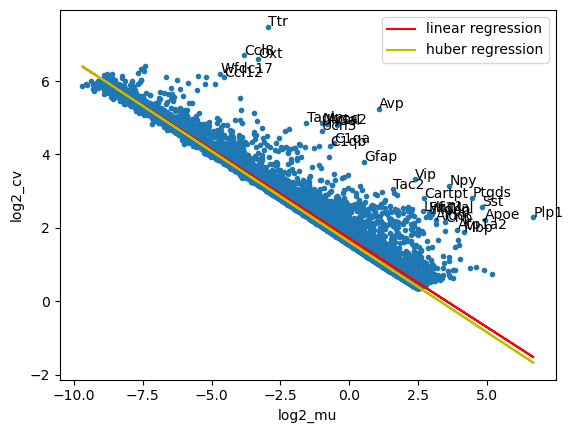

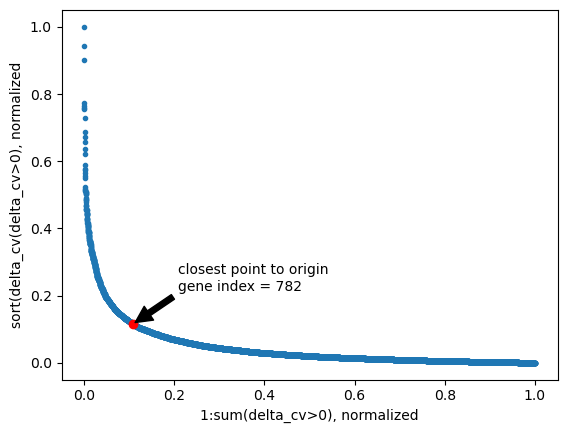

column (gene) mean after standardization: 0.00
column (gene) sigma after standardization: 1.00


In [343]:
%matplotlib inline
amy_df = amy_df.astype('int')
#process using standard workflow/functions from dimorph_processing.py
amy_df_bool = amy_df.mask(amy_df>0, other = 1)
status_df = dp.intialize_status_df()
amy_df_ce, amy_df_bool, amy_metadata_df_subset, status_df = dp.cell_exclusion(threshold_m = 2500, 
                                                      threshold_g = 2000,
                                                      meta_data_df = amy_metadata_df_subset,
                                                      df_bool = amy_df_bool,
                                                      df = amy_df,
                                                      status_df = status_df)
amy_df_ce_ge, amy_df_bool, amy_metadata_df_subset, status_df = dp.gene_exclusion(num_cell_lwr_bound=10,
                                                  percent_cell_upper_bound=50,
                                                 df_bool=amy_df_bool,
                                                 df = amy_df_ce,
                                                 meta_data_df = amy_metadata_df_subset,
                                                 status_df = status_df)

amy_cv_df = dp.analyze_cv(df = amy_df_ce_ge,
                  norm_scale_factor=20000,
                  num_top_genes=30,
                  plot_flag=1,
                 use_huber = True)
amy_gene_index, amy_df_ce_ge_cv, status_df = dp.get_top_cv_genes(df = amy_df_ce_ge, cv_df=amy_cv_df, plot_flag=1, status_df=status_df)
amy_cv_ls_arr,status_df = dp.log_and_standerdize_df(amy_df_ce_ge_cv,status_df)
amy_df_ce_ge_cv_ls = pd.DataFrame(data=amy_cv_ls_arr.T, index=amy_df_ce_ge_cv.index, columns=amy_df_ce_ge_cv.columns)


In [296]:
amy_df_ce_ge_cv_ls.shape

(782, 34961)

In [297]:
amy_metadata_df_subset.shape

(4, 34961)

Total cells reduced from 26824 to 26778
(27874, 26778)
Total genes reduced from 27874 to 16340
(16340, 26778)


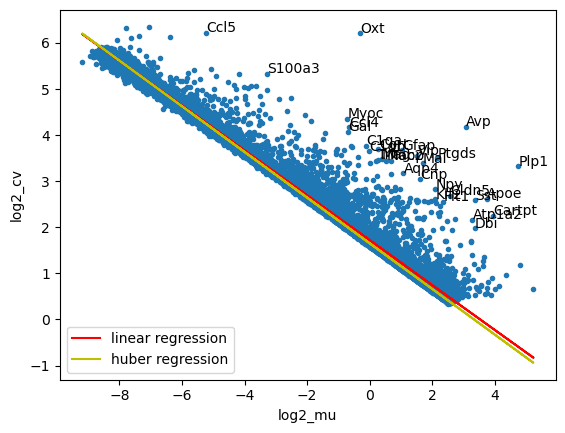

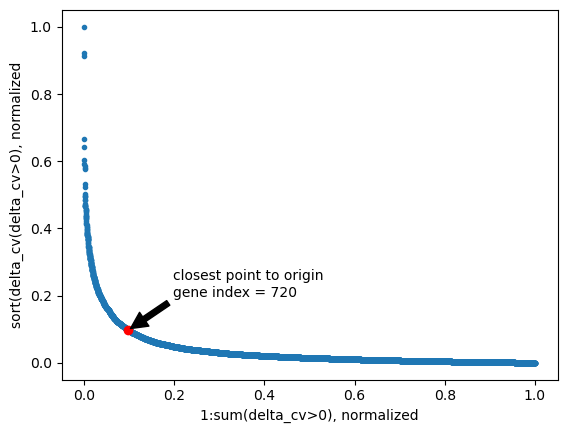

(720, 26778)
column (gene) mean after standardization: 0.00
column (gene) sigma after standardization: 1.00


In [298]:
sd_df = sd_df.astype('int')
#process using standard workflow/functions from dimorph_processing.py
sd_df_bool = sd_df.mask(sd_df>0, other = 1)
status_df = dp.intialize_status_df()
sd_df_ce, df_bool, sd_metadata_df_subset, status_df = dp.cell_exclusion(threshold_m = 2500, 
                                                      threshold_g = 2000,
                                                      meta_data_df = sd_metadata_df_subset,
                                                      df_bool = sd_df_bool,
                                                      df = sd_df,
                                                      status_df = status_df)
print (sd_df_ce.shape)
sd_df_ce_ge, sd_df_bool, sd_metadata_df_subset, status_df = dp.gene_exclusion(num_cell_lwr_bound=10,
                                                  percent_cell_upper_bound=50,
                                                 df_bool=sd_df_bool,
                                                 df = sd_df_ce,
                                                 meta_data_df = sd_metadata_df_subset,
                                                 status_df = status_df)
print (sd_df_ce_ge.shape)
sd_cv_df = dp.analyze_cv(df = sd_df_ce_ge,
                  norm_scale_factor=20000,
                  num_top_genes=30,
                  plot_flag=1,
                 use_huber = True)
sd_gene_index, sd_df_ce_ge_cv, status_df = dp.get_top_cv_genes(df = sd_df_ce_ge, cv_df=sd_cv_df, plot_flag=1, status_df=status_df)
print (sd_df_ce_ge_cv.shape)
sd_cv_ls_arr,status_df = dp.log_and_standerdize_df(sd_df_ce_ge_cv,status_df)
sd_df_ce_ge_cv_ls = pd.DataFrame(data=sd_cv_ls_arr.T, index=sd_df_ce_ge_cv.index, columns=sd_df_ce_ge_cv.columns)

In [299]:
sd_df_ce_ge_cv_ls.shape

(720, 26778)

In [300]:
sd_metadata_df_subset.shape

(4, 26778)

In [ ]:
#store intermediate results

In [348]:
amy_df_ce_ge_cv.to_feather('/bigdata/isaac/sd_amy_tsne_harmony_comp/v2_full_names/amy_df_ce_ge_cv.feather')
amy_df_ce_ge_cv_ls.to_feather('/bigdata/isaac/sd_amy_tsne_harmony_comp/v2_full_names/amy_df_ce_ge_cv_ls.feather')
amy_metadata_df_subset.to_json('/bigdata/isaac/sd_amy_tsne_harmony_comp/v2_full_names/amy_metadata_df_subset_fs.json')

sd_df_ce_ge_cv.to_feather('/bigdata/isaac/sd_amy_tsne_harmony_comp/v2_full_names/sd_df_ce_ge_cv.feather')
sd_df_ce_ge_cv_ls.to_feather('/bigdata/isaac/sd_amy_tsne_harmony_comp/v2_full_names/sd_df_ce_ge_cv_ls.feather')
sd_metadata_df_subset.to_json('/bigdata/isaac/sd_amy_tsne_harmony_comp/v2_full_names/sd_metadata_df_subset_fs.json')


In [153]:
#recombine using intersected genes

In [349]:
intersected_gene_ind_cv = amy_df_ce_ge_cv_ls.index.intersection(sd_df_ce_ge_cv_ls.index)

In [350]:
intersected_gene_ind_cv

Index(['Avp', 'Plp1', 'Ptgds', 'Oxt', 'Sst', 'Npy', 'Apoe', 'Gal', 'Vip',
       'Acta2',
       ...
       'AF251705', 'Adamts1', 'Aurkb', 'Xaf1', 'Ogn', 'Gamt', 'Npas3',
       'Bcl2a1b', 'Gm26772', 'Gjb1'],
      dtype='object', length=581)

In [304]:
sd_cv_ls_arr.shape

(26778, 720)

In [161]:
sd_cv_ls_arr.T

array([[-0.09801688, -0.09801688, -0.09801688, ..., -0.09801688,
        -0.09801688, -0.09801688],
       [-0.1765032 , -0.1765032 , -0.1765032 , ..., -0.1765032 ,
        -0.1765032 , -0.1765032 ],
       [ 0.60671206, -0.41379637,  1.20367123, ..., 10.34742874,
        10.29934994, 10.39207619],
       ...,
       [-0.29287611, -0.29287611, -0.29287611, ..., -0.29287611,
        -0.29287611, -0.29287611],
       [-0.11846363, -0.11846363, -0.11846363, ..., -0.11846363,
        -0.11846363, -0.11846363],
       [-0.26256462, -0.26256462, -0.26256462, ..., -0.26256462,
        -0.26256462, -0.26256462]])

In [160]:
sd_df_ce_ge_cv_ls.values

array([[-0.09801688, -0.09801688, -0.09801688, ..., -0.09801688,
        -0.09801688, -0.09801688],
       [-0.1765032 , -0.1765032 , -0.1765032 , ..., -0.1765032 ,
        -0.1765032 , -0.1765032 ],
       [ 0.60671206, -0.41379637,  1.20367123, ..., 10.34742874,
        10.29934994, 10.39207619],
       ...,
       [-0.29287611, -0.29287611, -0.29287611, ..., -0.29287611,
        -0.29287611, -0.29287611],
       [-0.11846363, -0.11846363, -0.11846363, ..., -0.11846363,
        -0.11846363, -0.11846363],
       [-0.26256462, -0.26256462, -0.26256462, ..., -0.26256462,
        -0.26256462, -0.26256462]])

In [351]:
amy_df_ce_ge_cv_ls = amy_df_ce_ge_cv_ls.reindex(index = intersected_gene_ind_cv)
sd_df_ce_ge_cv_ls = sd_df_ce_ge_cv_ls.reindex(index = intersected_gene_ind_cv)

In [352]:
amy_df_ce_ge_cv_ls.shape

(581, 34961)

In [353]:
sd_df_ce_ge_cv_ls.shape

(581, 26778)

In [ ]:
#concat values to single array

In [354]:
amy_sd_df_ce_ge_cv_ls = pd.concat([amy_df_ce_ge_cv_ls,sd_df_ce_ge_cv_ls], axis = 1)

In [355]:
amy_sd_df_ce_ge_cv_ls.shape

(581, 61739)

In [356]:
amy_sd_metadata.shape

(4, 82338)

In [ ]:
#concat metadata to single df

In [357]:
amy_metadata_df_subset

,TGGGAAGGTCGAGTGA-1_08-1,AAAGTCCAGTACCATC-1_10-1,ATATCCTCAAAGGATT-1_10-1,CGAGTTACATCCTTCG-1_10-1,GGACGTCCACCCATAA-1_10-1,GGACGTCGTCCAATCA-1_10-1,GTCACGGCAATCGAAA-1_10-1,TATTTCGAGCAGCAGT-1_10-1,TCCGTGTTCCAATCTT-1_10-1,TCTACATTCTGCATGA-1_10-1,...,GTGGGAACACAGCCAC-1_75-2,CAGATTGGTGCAGATG-1_75-3,GGGAAGTCAAGGCCTC-1_76-1,AGGACTTGTAGATCCT-1_76-2,CAGTTCCGTAACCCTA-1_76-2,TGGGATTTCCCTCTCC-1_76-2,GGGTGAAGTCGATGCC-1_45-3,GCTCAAACACCAGTTA-1_74-1,TCATTGTTCAAACCTG-1_74-1,TGGAGGAGTTCCGGTG-1_74-2
cell_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal
markers,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,...,microglia,microglia,microglia,microglia,microglia,microglia,pvm,pvm,pvm,pvm
full_name,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,...,Nonneuronal-13-microglia,Nonneuronal-13-microglia,Nonneuronal-13-microglia,Nonneuronal-13-microglia,Nonneuronal-13-microglia,Nonneuronal-13-microglia,Nonneuronal-14-pvm,Nonneuronal-14-pvm,Nonneuronal-14-pvm,Nonneuronal-14-pvm
dataset,amy,amy,amy,amy,amy,amy,amy,amy,amy,amy,...,amy,amy,amy,amy,amy,amy,amy,amy,amy,amy


In [358]:
sd_metadata_df_subset

,CAACAACAGACATATG-1_10X35_2,ATGACCATCGTGAGAG-1_10X51_1,AACCCAAAGAAATGGG-1_10X35_2,GAGGGATGTATGCTAC-1_10X35_1,AAGATAGGTAACACCT-1_10X37_2,CAGGGCTGTATCTTCT-1_10X51_1,CTGCTCATCCGATCGG-1_10X38_1,TGCTCCAAGAGGCGTT-1_10X51_1,TTGCCTGTCGTAGGGA-1_10X35_2,GCAACATAGATCGACG-1_10X51_2,...,CAAGAGGGTCAATCTG-1_10X36_2,TATACCTAGAGTAACT-1_10X35_1,GCACGTGGTTATTCCT-1_10X37_1,GATGATCTCAAGCCTA-1_10X36_1,GGTGTCGAGAAGCTGC-1_10X36_2,GAGAGGTCACATCATG-1_10X37_2,ATCAGGTTCCACTAGA-1_10X35_2,TCCACGTAGAGCATCG-1_10X37_1,CTGCGAGCACTACGGC-1_10X35_2,CTCTGGTTCGAAGCAG-1_10X37_1
cell_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal
markers,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,...,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2
full_name,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,...,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2
dataset,sd,sd,sd,sd,sd,sd,sd,sd,sd,sd,...,sd,sd,sd,sd,sd,sd,sd,sd,sd,sd


In [359]:
amy_sd_metadata_df_ce_ge_cv_ls = pd.concat([amy_metadata_df_subset,sd_metadata_df_subset],axis=1)
amy_sd_metadata_df_ce_ge_cv_ls.shape

(4, 61739)

In [360]:
log_std_arr = amy_sd_df_ce_ge_cv_ls.values.T

3) PCA Dimensionality Reduction, using find knee to get cutoff 

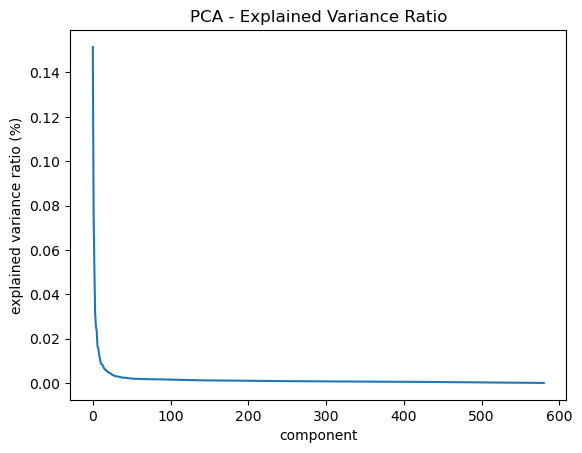

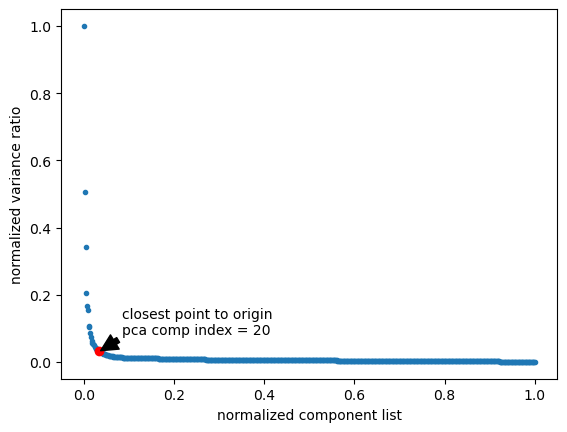

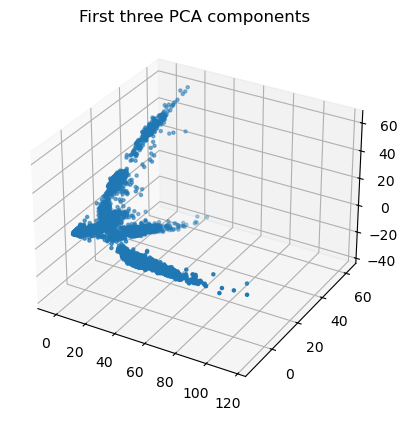

In [361]:
pca_index, arr_pca, status_df = dp.analyze_pca(arr = log_std_arr, #log_std_arr
                                               n_components=log_std_arr.shape[1], #log_std_arr.shape[1]
                                               optimize_n=True,
                                               plot_flag=1, 
                                               status_df=status_df)

In [362]:
arr_pca.shape

(61739, 20)

In [363]:
np.save('/bigdata/isaac/sd_amy_tsne_harmony_comp/v2_full_names/arr_pca.npy',arr_pca)

In [364]:
amy_sd_metadata_df_ce_ge_cv_ls.index

Index(['cell_class', 'markers', 'full_name', 'dataset'], dtype='object')

In [365]:
meta_data_df_pca = amy_sd_metadata_df_ce_ge_cv_ls.T.copy()

In [366]:
meta_data_df_pca.shape

(61739, 4)

In [367]:
meta_data_df_pca

,cell_class,markers,full_name,dataset
TGGGAAGGTCGAGTGA-1_08-1,GABA,Foxp2-Fmod,GABA-1-Foxp2_Fmod,amy
AAAGTCCAGTACCATC-1_10-1,GABA,Foxp2-Fmod,GABA-1-Foxp2_Fmod,amy
ATATCCTCAAAGGATT-1_10-1,GABA,Foxp2-Fmod,GABA-1-Foxp2_Fmod,amy
CGAGTTACATCCTTCG-1_10-1,GABA,Foxp2-Fmod,GABA-1-Foxp2_Fmod,amy
GGACGTCCACCCATAA-1_10-1,GABA,Foxp2-Fmod,GABA-1-Foxp2_Fmod,amy
...,...,...,...,...
GAGAGGTCACATCATG-1_10X37_2,Nonneuronal,OL_2,Nonneuronal-11-OL_2,sd
ATCAGGTTCCACTAGA-1_10X35_2,Nonneuronal,OL_2,Nonneuronal-11-OL_2,sd
TCCACGTAGAGCATCG-1_10X37_1,Nonneuronal,OL_2,Nonneuronal-11-OL_2,sd
CTGCGAGCACTACGGC-1_10X35_2,Nonneuronal,OL_2,Nonneuronal-11-OL_2,sd


4) Harmony Integration, with vars_use = dataset, iterate until convergence

In [368]:
vars_use = ['dataset']
ho = hm.run_harmony(arr_pca,meta_data_df_pca,vars_use,max_iter_harmony=20)

2024-11-28 11:13:38,712 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2024-11-28 11:13:43,006 - harmonypy - INFO - sklearn.KMeans initialization complete.
2024-11-28 11:13:43,444 - harmonypy - INFO - Iteration 1 of 20
2024-11-28 11:14:01,953 - harmonypy - INFO - Iteration 2 of 20
2024-11-28 11:14:20,027 - harmonypy - INFO - Iteration 3 of 20
2024-11-28 11:14:38,041 - harmonypy - INFO - Iteration 4 of 20
2024-11-28 11:15:03,955 - harmonypy - INFO - Iteration 5 of 20
2024-11-28 11:15:31,282 - harmonypy - INFO - Iteration 6 of 20
2024-11-28 11:15:46,737 - harmonypy - INFO - Iteration 7 of 20
2024-11-28 11:15:56,620 - harmonypy - INFO - Iteration 8 of 20
2024-11-28 11:16:04,038 - harmonypy - INFO - Converged after 8 iterations


5) Run Tsne 

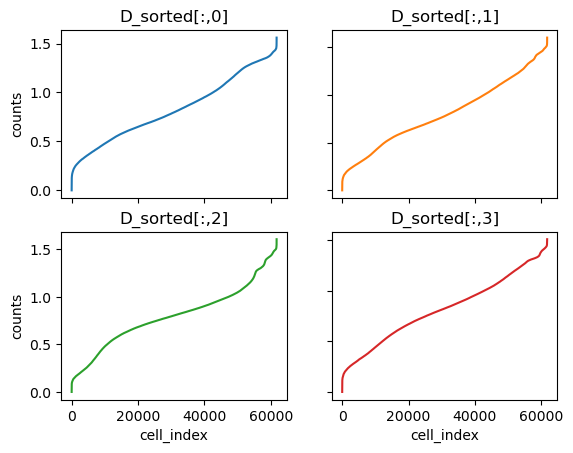

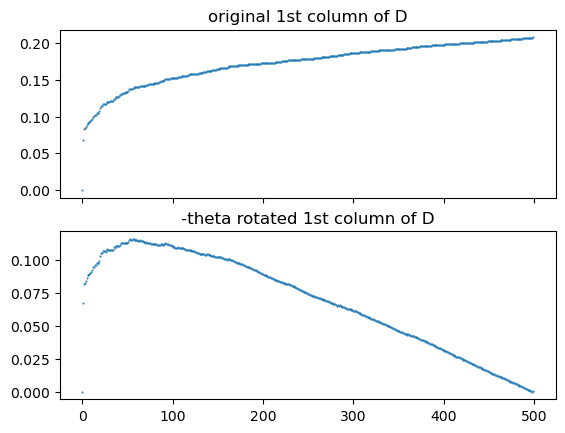

creating tsne object with the following parameters: 
n_components:2
n_iter: 1000
learning_rate: 50
early_exaggeration: 12
init: pca
perplexity: 59.0


/home/isaac/anaconda3/lib/python3.11/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


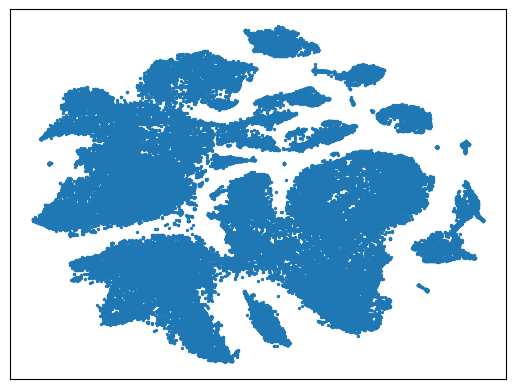

In [369]:
amy_sd_hm_arr = ho.Z_corr.T

perplexity,status_df = dp.get_perplexity(pca_arr = amy_sd_hm_arr, cutoff=500, plot_flag=1, status_df = status_df)

amy_sd_arr_tsne,status_df = dp.do_tsne(arr = amy_sd_hm_arr, 
                               n_components=2,
                               n_iter=1000,
                               learning_rate=50,
                               early_exaggeration=12,
                               init='pca', 
                               perplexity = perplexity,
                               status_df = status_df)

In [370]:
meta_data_df_pca.shape

(61739, 4)

In [371]:
amy_sd_hm_arr.shape

(61739, 20)

In [372]:
amy_sd_arr_tsne.shape

(61739, 2)

In [377]:
#save intermediate results
np.save('/bigdata/isaac/sd_amy_tsne_harmony_comp/v2_full_names/amy_sd_arr_tsne.npy',amy_sd_arr_tsne)
meta_data_df_pca.to_json('/bigdata/isaac/sd_amy_tsne_harmony_comp/v2_full_names/meta_data_df_pca.json')

In [379]:
amy_sd_df_ce_ge_cv_ls.to_feather('/bigdata/isaac/sd_amy_tsne_harmony_comp/v2_full_names/amy_sd_df_ce_ge_cv_ls.feather')
amy_sd_metadata_df_ce_ge_cv_ls.to_json('/bigdata/isaac/sd_amy_tsne_harmony_comp/v2_full_names/amy_sd_metadata_df_ce_ge_cv_ls.json')

color each cell by dataset

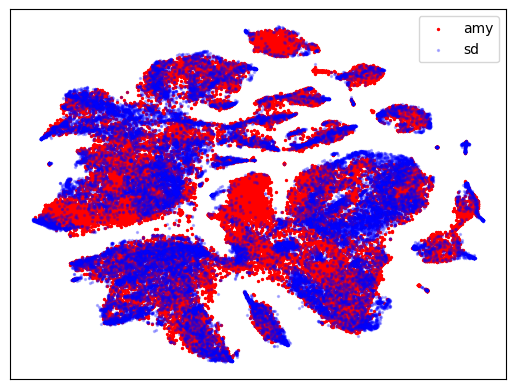

In [380]:
fig,ax = plt.subplots()
#all pts
x = amy_sd_arr_tsne[:,0]
y = amy_sd_arr_tsne[:,1]
#ax.scatter(x,y,s=2)

#amy pts
x_amy = x[meta_data_df_pca['dataset'] == 'amy']
y_amy = y[meta_data_df_pca['dataset'] == 'amy']
ax.scatter(x_amy,y_amy,s=2,c = 'r', label = 'amy',alpha=1)

#sd pts
x_sd = x[meta_data_df_pca['dataset'] == 'sd']
y_sd = y[meta_data_df_pca['dataset'] == 'sd']
ax.scatter(x_sd,y_sd,s=2,c = 'b', label = 'sd',alpha=0.25)


ax.set_xticks([])
ax.set_yticks([])

ax.legend()
plt.savefig('/bigdata/isaac/sd_amy_tsne_harmony_comp/v2_full_names/tsne_overlay_sd_on_amy.pdf')
plt.show()

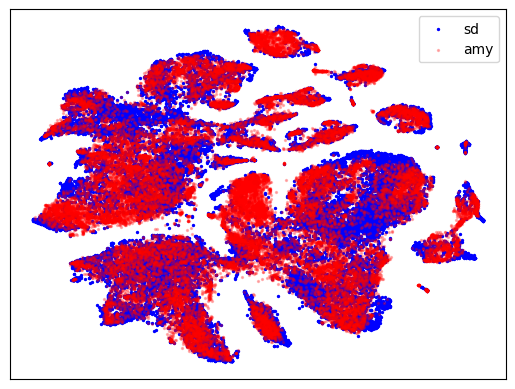

In [381]:
fig,ax = plt.subplots()
#all pts
x = amy_sd_arr_tsne[:,0]
y = amy_sd_arr_tsne[:,1]
#ax.scatter(x,y,s=2)

#sd pts
x_sd = x[meta_data_df_pca['dataset'] == 'sd']
y_sd = y[meta_data_df_pca['dataset'] == 'sd']
ax.scatter(x_sd,y_sd,s=2,c = 'b', label = 'sd',alpha=1)

#amy pts
x_amy = x[meta_data_df_pca['dataset'] == 'amy']
y_amy = y[meta_data_df_pca['dataset'] == 'amy']
ax.scatter(x_amy,y_amy,s=2,c = 'r', label = 'amy',alpha=.25)

ax.set_xticks([])
ax.set_yticks([])

ax.legend()
plt.savefig('/bigdata/isaac/sd_amy_tsne_harmony_comp/v2_full_names/tsne_overlay_amy_on_sd.pdf')
plt.show()

In [382]:
amy_sd_metadata_df_ce_ge_cv_ls

,TGGGAAGGTCGAGTGA-1_08-1,AAAGTCCAGTACCATC-1_10-1,ATATCCTCAAAGGATT-1_10-1,CGAGTTACATCCTTCG-1_10-1,GGACGTCCACCCATAA-1_10-1,GGACGTCGTCCAATCA-1_10-1,GTCACGGCAATCGAAA-1_10-1,TATTTCGAGCAGCAGT-1_10-1,TCCGTGTTCCAATCTT-1_10-1,TCTACATTCTGCATGA-1_10-1,...,CAAGAGGGTCAATCTG-1_10X36_2,TATACCTAGAGTAACT-1_10X35_1,GCACGTGGTTATTCCT-1_10X37_1,GATGATCTCAAGCCTA-1_10X36_1,GGTGTCGAGAAGCTGC-1_10X36_2,GAGAGGTCACATCATG-1_10X37_2,ATCAGGTTCCACTAGA-1_10X35_2,TCCACGTAGAGCATCG-1_10X37_1,CTGCGAGCACTACGGC-1_10X35_2,CTCTGGTTCGAAGCAG-1_10X37_1
cell_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal
markers,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,...,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2
full_name,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,...,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2
dataset,amy,amy,amy,amy,amy,amy,amy,amy,amy,amy,...,sd,sd,sd,sd,sd,sd,sd,sd,sd,sd


compare tsne overlay of non harmonized verison

In [383]:
amy_sd_hm_arr.shape

(61739, 20)

In [384]:
arr_pca.shape

(61739, 20)

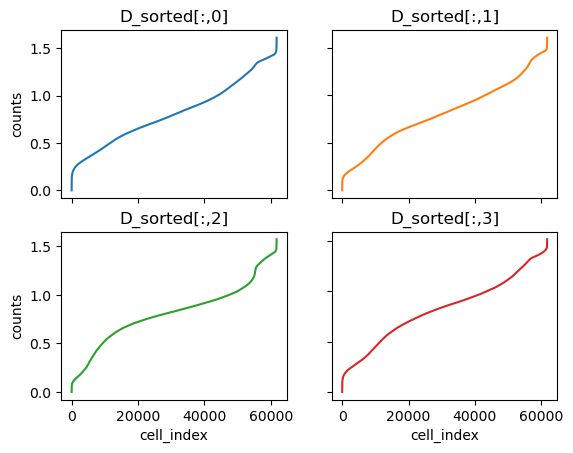

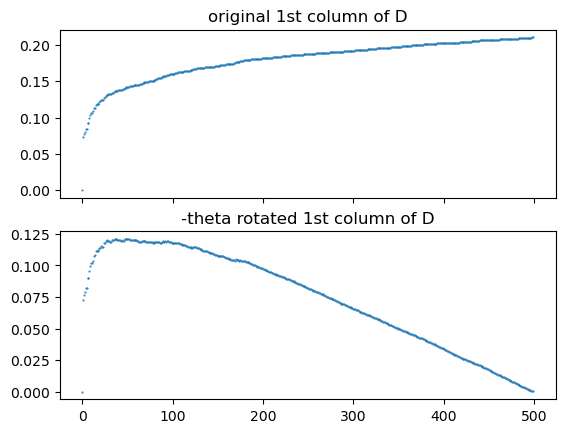

creating tsne object with the following parameters: 
n_components:2
n_iter: 1000
learning_rate: 50
early_exaggeration: 12
init: pca
perplexity: 60.0


/home/isaac/anaconda3/lib/python3.11/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


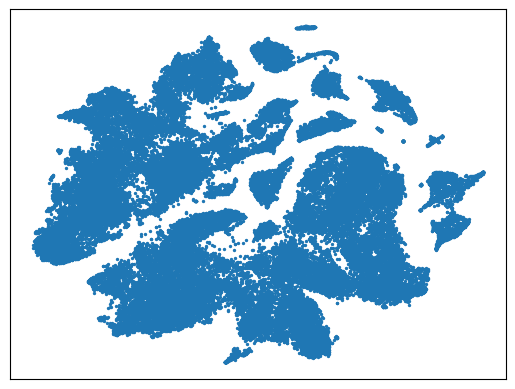

In [385]:
perplexity,status_df = dp.get_perplexity(pca_arr = arr_pca, cutoff=500, plot_flag=1, status_df = status_df)

amy_sd_arr_tsne_pca_input,status_df = dp.do_tsne(arr = arr_pca, 
                               n_components=2,
                               n_iter=1000,
                               learning_rate=50,
                               early_exaggeration=12,
                               init='pca', 
                               perplexity = perplexity,
                               status_df = status_df)

In [386]:
np.save('/bigdata/isaac/sd_amy_tsne_harmony_comp/v2_full_names/amy_sd_arr_tsne_pca_input.npy',amy_sd_arr_tsne_pca_input)

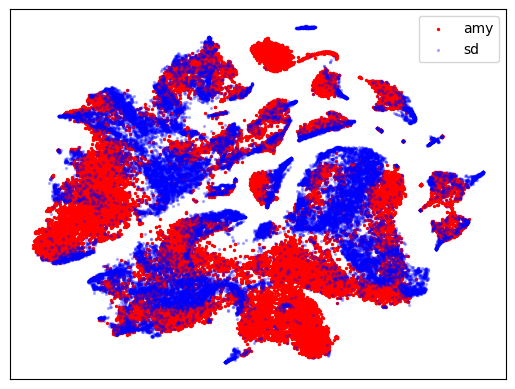

In [387]:
%matplotlib inline
fig,ax = plt.subplots()
#all pts
x = amy_sd_arr_tsne_pca_input[:,0]
y = amy_sd_arr_tsne_pca_input[:,1]
#ax.scatter(x,y,s=2)

#amy pts
x_amy = x[meta_data_df_pca['dataset'] == 'amy']
y_amy = y[meta_data_df_pca['dataset'] == 'amy']
ax.scatter(x_amy,y_amy,s=2,c = 'r', label = 'amy',alpha=1)

#sd pts
x_sd = x[meta_data_df_pca['dataset'] == 'sd']
y_sd = y[meta_data_df_pca['dataset'] == 'sd']
ax.scatter(x_sd,y_sd,s=2,c = 'b', label = 'sd',alpha=0.25)


ax.set_xticks([])
ax.set_yticks([])

ax.legend()
plt.savefig('/bigdata/isaac/sd_amy_tsne_harmony_comp/v2_full_names/tsne_overlay_sd_on_amy_no_harmony.pdf')
plt.show()

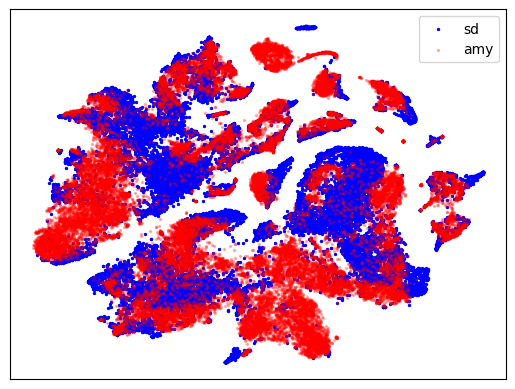

In [388]:
fig,ax = plt.subplots()
#all pts
x = amy_sd_arr_tsne_pca_input[:,0]
y = amy_sd_arr_tsne_pca_input[:,1]
#ax.scatter(x,y,s=2)

#sd pts
x_sd = x[meta_data_df_pca['dataset'] == 'sd']
y_sd = y[meta_data_df_pca['dataset'] == 'sd']
ax.scatter(x_sd,y_sd,s=2,c = 'b', label = 'sd',alpha=1)

#amy pts
x_amy = x[meta_data_df_pca['dataset'] == 'amy']
y_amy = y[meta_data_df_pca['dataset'] == 'amy']
ax.scatter(x_amy,y_amy,s=2,c = 'r', label = 'amy',alpha=.25)

ax.set_xticks([])
ax.set_yticks([])

ax.legend()
plt.savefig('/bigdata/isaac/sd_amy_tsne_harmony_comp/v2_full_names/tsne_overlay_amy_on_sd_no_harmony.pdf')
plt.show()

color each cell in the SD dataset by the match cell type in the FC dataset

In [389]:
updated_amy_classes = list(np.unique(amy_metadata_df_subset.loc['cell_class']))
updated_amy_classes

['GABA', 'Nonneuronal', 'VGLUT1', 'VGLUT2']

In [390]:
amy_classes = list(np.unique(amy_metadata_df_subset.loc['cell_class']))
amy_classes

['GABA', 'Nonneuronal', 'VGLUT1', 'VGLUT2']

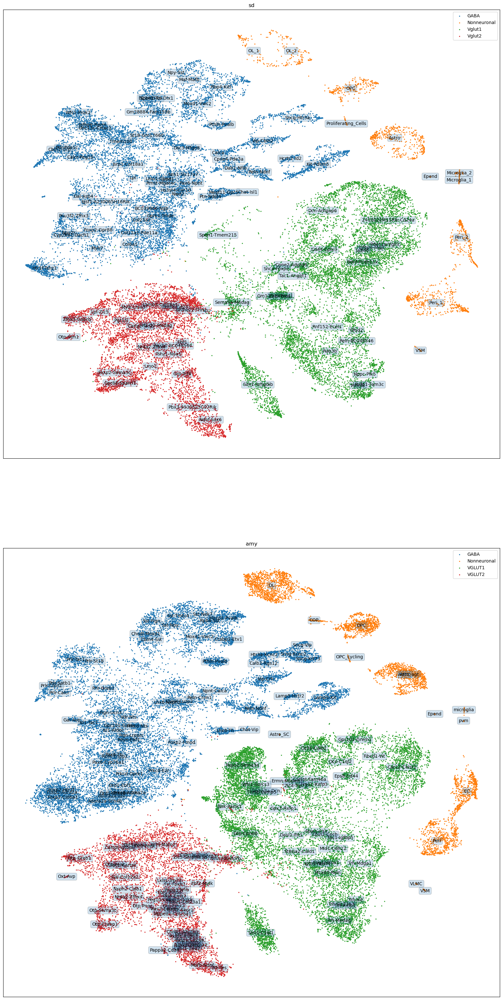

In [ ]:
#get cell type labels for each dataset 
sd_labels = list(np.unique(sd_metadata_df_subset.loc['markers']))
amy_labels = list(np.unique(amy_metadata_df_subset.loc['markers']))

#get class labels for each dataset
sd_classes = list(np.unique(sd_metadata_df_subset.loc['cell_class']))
updated_amy_classes = list(np.unique(amy_metadata_df_subset.loc['cell_class']))

###############################################
fig,ax = plt.subplots(2,1, figsize = (20,40))
#label fontsize
label_fs = 10
#all pts
x = amy_sd_arr_tsne[:,0]
y = amy_sd_arr_tsne[:,1]
##############################################
#sd pts
x_sd = x[meta_data_df_pca['dataset'] == 'sd']
y_sd = y[meta_data_df_pca['dataset'] == 'sd']
#ax[0].scatter(x_sd,y_sd,s=2,c = 'b', label = 'sd',alpha=.25)
for sd_cls in sd_classes:
    ax[0].scatter(x_sd[sd_metadata_df_subset.T['cell_class']==sd_cls],y_sd[sd_metadata_df_subset.T['cell_class']==sd_cls], s=2, label = str(sd_cls))

#combine into 2D array
arr_xy_sd = np.vstack([x_sd,y_sd])
for sd_ct in sd_labels:
    #print (arr_xy_sd.T[sd_metadata_df_subset.T['markers']==sd_ct])
    cluster_median = np.median(arr_xy_sd.T[sd_metadata_df_subset.T['markers']==sd_ct],axis = 0)
    ax[0].annotate(text = sd_ct, xy=cluster_median, fontsize=label_fs, color='black',
                    ha='center', va='center', bbox=dict(boxstyle='round', alpha=0.2))
ax[0].set_xticks([])
ax[0].set_yticks([])
ax[0].set_title('sd')
ax[0].legend()
###############################################
#amy pts
x_amy = x[meta_data_df_pca['dataset'] == 'amy']
y_amy = y[meta_data_df_pca['dataset'] == 'amy']
#ax[1].scatter(x_amy,y_amy,s=2,c = 'r', label = 'amy',alpha=.25)
for amy_cls in updated_amy_classes:
    ax[1].scatter(x_amy[amy_metadata_df_subset.T['cell_class']==amy_cls],y_amy[amy_metadata_df_subset.T['cell_class']==amy_cls], s=2, label = str(amy_cls))

#combine into 2D array
arr_xy_amy = np.vstack([x_amy,y_amy])
for amy_ct in amy_labels:
    #print (arr_xy_amy.T[amy_metadata_df_subset.T['markers']==amy_ct])
    cluster_median = np.median(arr_xy_amy.T[amy_metadata_df_subset.T['markers']==amy_ct],axis = 0)
    ax[1].annotate(text = amy_ct, xy=cluster_median, fontsize=label_fs, color='black',
                    ha='center', va='center', bbox=dict(boxstyle='round', alpha=0.2))
ax[1].set_xticks([])
ax[1].set_yticks([])
ax[1].legend()
ax[1].set_title('amy')

plt.savefig('/bigdata/isaac/sd_amy_tsne_harmony_comp/v2_full_names/ctype_cclass_sd_amy_comparison.pdf')
plt.show()

In [352]:
#individual versions

In [402]:
amy_metadata_df_subset.loc['full_name']

TGGGAAGGTCGAGTGA-1_08-1           GABA-1-Foxp2_Fmod
AAAGTCCAGTACCATC-1_10-1           GABA-1-Foxp2_Fmod
ATATCCTCAAAGGATT-1_10-1           GABA-1-Foxp2_Fmod
CGAGTTACATCCTTCG-1_10-1           GABA-1-Foxp2_Fmod
GGACGTCCACCCATAA-1_10-1           GABA-1-Foxp2_Fmod
                                     ...           
TGGGATTTCCCTCTCC-1_76-2    Nonneuronal-13-microglia
GGGTGAAGTCGATGCC-1_45-3          Nonneuronal-14-pvm
GCTCAAACACCAGTTA-1_74-1          Nonneuronal-14-pvm
TCATTGTTCAAACCTG-1_74-1          Nonneuronal-14-pvm
TGGAGGAGTTCCGGTG-1_74-2          Nonneuronal-14-pvm
Name: full_name, Length: 34961, dtype: object

In [401]:
amy_labels = list(np.unique(amy_metadata_df_subset.loc['full_name']))
amy_labels

['GABA-1-Foxp2_Fmod',
 'GABA-10-Prkcd-Adora2a',
 'GABA-11-Adora2a-Id4',
 'GABA-12-Adora2a-Scn4b',
 'GABA-13-Adora2a-Crh',
 'GABA-14-Drd1-Scn4b',
 'GABA-15-Drd1-Ebf1',
 'GABA-16-Prkcd-Nts',
 'GABA-17-Pdyn-Ebf1',
 'GABA-18-Isl1-Tac1',
 'GABA-19-Isl1-Aldoc',
 'GABA-2-Foxp2_Adra2a',
 'GABA-20-Gpr101-Gabre',
 'GABA-21-Vdr-Nts',
 'GABA-22-Gal-Avp',
 'GABA-23-Fign-Lrpprc',
 'GABA-24-Fign-Ucn3',
 'GABA-25-Lhx8-Th',
 'GABA-26-Cbln4-Sst',
 'GABA-27-Lhx6-Nxph2',
 'GABA-28-Cbln4-Luzp2',
 'GABA-29-Prlr-Greb1',
 'GABA-3-Foxp2_Col6a1',
 'GABA-30-Prlr-Calcr',
 'GABA-31-Prlr-Cbln1',
 'GABA-32-Prlr-Tac1',
 'GABA-33-Prlr-St18',
 'GABA-34-Prlr-Satb1',
 'GABA-35-Chodl-Moxd1',
 'GABA-36-Sst-Fign',
 'GABA-37-Sst-Npy',
 'GABA-38-Sst-Tmtc4',
 'GABA-39-Sst-Nek7',
 'GABA-4-Foxp2_Htr1f',
 'GABA-40-Rpb4-Sst',
 'GABA-41-Moxd1-Pvalb',
 'GABA-42-Moxd1-Vwc2',
 'GABA-43-Crabp1-Etv1',
 'GABA-44-Pthlh-Pvalb',
 'GABA-45-Lamp5-Hctr2',
 'GABA-46-Lamp5-Kit',
 'GABA-47-Reln-Ndnf',
 'GABA-48-Reln-Crim1',
 'GABA-49-Npnt-Calca',

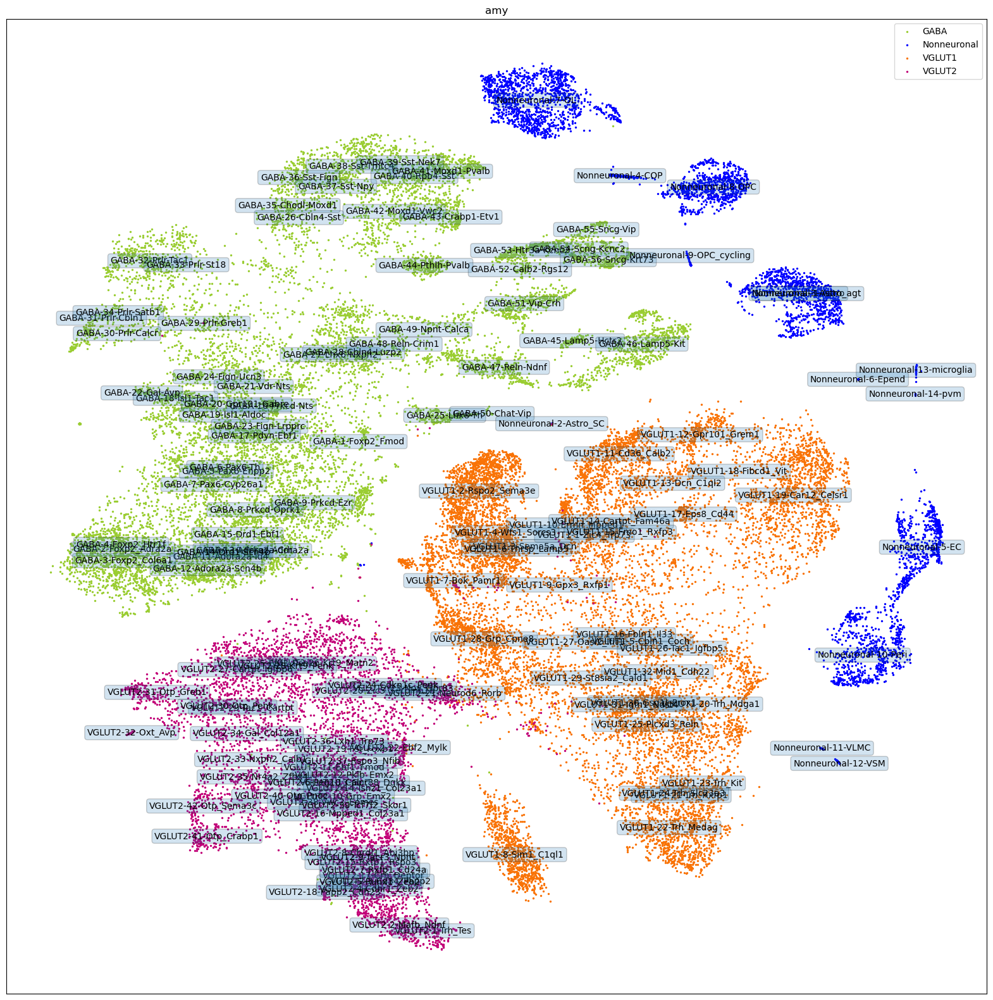

In [404]:
%matplotlib inline
#get cell type labels
amy_labels = list(np.unique(amy_metadata_df_subset.loc['full_name']))

#get class labels
updated_amy_classes = list(np.unique(amy_metadata_df_subset.loc['cell_class']))

fig,ax = plt.subplots(figsize = (20,20))
#label fontsize
label_fs = 10
#all pts
x = amy_sd_arr_tsne[:,0]
y = amy_sd_arr_tsne[:,1]
#amy pts
x_amy = x[meta_data_df_pca['dataset'] == 'amy']
y_amy = y[meta_data_df_pca['dataset'] == 'amy']
#ax.scatter(x_amy,y_amy,s=2,c = 'r', label = 'amy',alpha=.25)
for amy_cls in updated_amy_classes:
    #ax.scatter(x_amy[amy_metadata_df_subset.T['cell_class']==amy_cls],y_amy[amy_metadata_df_subset.T['cell_class']==amy_cls], s=2, label = str(amy_cls))
    if amy_cls == 'GABA':
        ax.scatter(x_amy[amy_metadata_df_subset.T['cell_class']==amy_cls],y_amy[amy_metadata_df_subset.T['cell_class']==amy_cls], s=2, label = str(amy_cls), c = '#9ACD32')
    if amy_cls == 'VGLUT1':
        ax.scatter(x_amy[amy_metadata_df_subset.T['cell_class']==amy_cls],y_amy[amy_metadata_df_subset.T['cell_class']==amy_cls], s=2, label = str(amy_cls), c = '#F97306')
    if amy_cls == 'VGLUT2':
        ax.scatter(x_amy[amy_metadata_df_subset.T['cell_class']==amy_cls],y_amy[amy_metadata_df_subset.T['cell_class']==amy_cls], s=2, label = str(amy_cls), c = '#C20078')
    if amy_cls == 'Nonneuronal':
        ax.scatter(x_amy[amy_metadata_df_subset.T['cell_class']==amy_cls],y_amy[amy_metadata_df_subset.T['cell_class']==amy_cls], s=2, label = str(amy_cls), c = '#0000FF')

    
#combine into 2D array
arr_xy_amy = np.vstack([x_amy,y_amy])
for amy_ct in amy_labels:
    #print (arr_xy_amy.T[amy_metadata_df_subset.T['markers']==amy_ct])
    cluster_median = np.median(arr_xy_amy.T[amy_metadata_df_subset.T['full_name']==amy_ct],axis = 0)
    ax.annotate(text = amy_ct, xy=cluster_median, fontsize=label_fs, color='black',
                    ha='center', va='center', bbox=dict(boxstyle='round', alpha=0.2))
ax.set_xticks([])
ax.set_yticks([])
ax.legend()
ax.set_title('amy')

plt.savefig('/bigdata/isaac/sd_amy_tsne_harmony_comp/v2_full_names/ctype_cclass_amy_full_names.pdf')
plt.show()

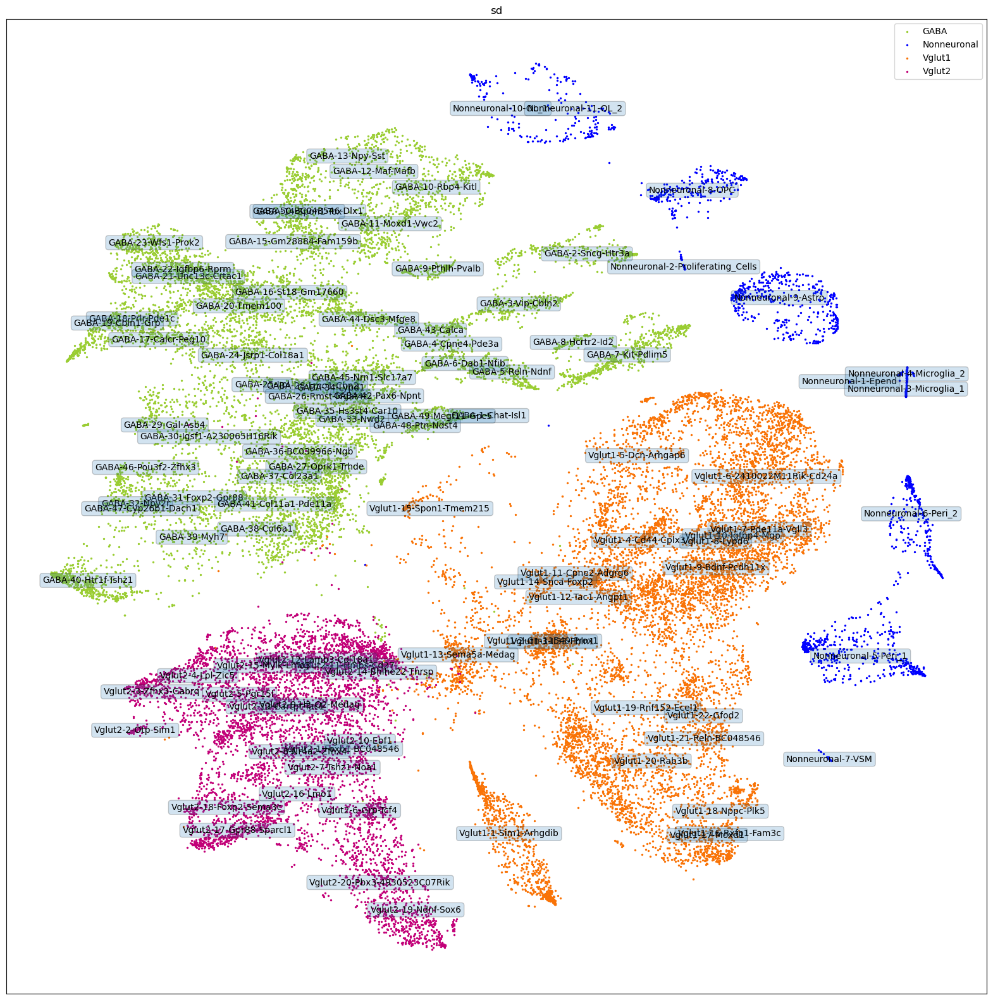

In [407]:
#get cell type labels
sd_labels = list(np.unique(sd_metadata_df_subset.loc['full_name']))

#get class labels
sd_classes = list(np.unique(sd_metadata_df_subset.loc['cell_class']))
#print (sd_classes)
fig,ax = plt.subplots(figsize = (20,20))
#label fontsize
label_fs = 10
#all pts
x = amy_sd_arr_tsne[:,0]
y = amy_sd_arr_tsne[:,1]
#sd pts
x_sd = x[meta_data_df_pca['dataset'] == 'sd']
y_sd = y[meta_data_df_pca['dataset'] == 'sd']
#ax.scatter(x_sd,y_sd,s=2,c = 'b', label = 'sd',alpha=.25)
for sd_cls in sd_classes:
    #ax.scatter(x_sd[sd_metadata_df_subset.T['cell_class']==sd_cls],y_sd[sd_metadata_df_subset.T['cell_class']==sd_cls], s=2, label = str(sd_cls))
    if sd_cls == 'GABA':
        ax.scatter(x_sd[sd_metadata_df_subset.T['cell_class']==sd_cls],y_sd[sd_metadata_df_subset.T['cell_class']==sd_cls], s=2, label = str(sd_cls), c = '#9ACD32')
    if sd_cls == 'Vglut1':
        ax.scatter(x_sd[sd_metadata_df_subset.T['cell_class']==sd_cls],y_sd[sd_metadata_df_subset.T['cell_class']==sd_cls], s=2, label = str(sd_cls), c = '#F97306')
    if sd_cls == 'Vglut2':
        ax.scatter(x_sd[sd_metadata_df_subset.T['cell_class']==sd_cls],y_sd[sd_metadata_df_subset.T['cell_class']==sd_cls], s=2, label = str(sd_cls), c = '#C20078')
    if sd_cls == 'Nonneuronal':
        ax.scatter(x_sd[sd_metadata_df_subset.T['cell_class']==sd_cls],y_sd[sd_metadata_df_subset.T['cell_class']==sd_cls], s=2, label = str(sd_cls), c = '#0000FF')

#combine into 2D array
arr_xy_sd = np.vstack([x_sd,y_sd])
for sd_ct in sd_labels:
    #print (arr_xy_sd.T[sd_metadata_df_subset.T['markers']==sd_ct])
    cluster_median = np.median(arr_xy_sd.T[sd_metadata_df_subset.T['full_name']==sd_ct],axis = 0)
    ax.annotate(text = sd_ct, xy=cluster_median, fontsize=label_fs, color='black',
                    ha='center', va='center', bbox=dict(boxstyle='round', alpha=0.2))
ax.set_xticks([])
ax.set_yticks([])
ax.set_title('sd')
ax.legend()

plt.savefig('/bigdata/isaac/sd_amy_tsne_harmony_comp/v2_full_names/ctype_cclass_sd_full_names.pdf')
plt.show()

## Majority vote to get cell types of SD using Amy cell types

In [408]:
arr_xy_amy

array([[ -6.9406023,  -6.919858 , -10.951758 , ...,  28.237267 ,
         28.230106 ,  19.557531 ],
       [  6.3616185,   6.5392103,  -2.6454296, ...,   8.35189  ,
          8.275586 ,  13.417208 ]], dtype=float32)

In [409]:
arr_xy_sd

array([[ 1.3640873,  1.1174881,  1.3641665, ...,  4.5539775,  4.3458443,
         6.8783474],
       [ 7.000172 ,  7.011431 ,  7.0003014, ..., 31.072311 , 31.190874 ,
        29.983673 ]], dtype=float32)

In [410]:
sd_metadata_df_subset

,CAACAACAGACATATG-1_10X35_2,ATGACCATCGTGAGAG-1_10X51_1,AACCCAAAGAAATGGG-1_10X35_2,GAGGGATGTATGCTAC-1_10X35_1,AAGATAGGTAACACCT-1_10X37_2,CAGGGCTGTATCTTCT-1_10X51_1,CTGCTCATCCGATCGG-1_10X38_1,TGCTCCAAGAGGCGTT-1_10X51_1,TTGCCTGTCGTAGGGA-1_10X35_2,GCAACATAGATCGACG-1_10X51_2,...,CAAGAGGGTCAATCTG-1_10X36_2,TATACCTAGAGTAACT-1_10X35_1,GCACGTGGTTATTCCT-1_10X37_1,GATGATCTCAAGCCTA-1_10X36_1,GGTGTCGAGAAGCTGC-1_10X36_2,GAGAGGTCACATCATG-1_10X37_2,ATCAGGTTCCACTAGA-1_10X35_2,TCCACGTAGAGCATCG-1_10X37_1,CTGCGAGCACTACGGC-1_10X35_2,CTCTGGTTCGAAGCAG-1_10X37_1
cell_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal
markers,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,...,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2
full_name,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,...,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2
dataset,sd,sd,sd,sd,sd,sd,sd,sd,sd,sd,...,sd,sd,sd,sd,sd,sd,sd,sd,sd,sd


In [415]:
#prepare label transferred version of sd_metadata_df
sd_metadata_df_subset_w_amc = sd_metadata_df_subset.copy()
amy_markers = pd.DataFrame(index = ['amy_markers'], columns = sd_metadata_df_subset_w_amc.columns)
amy_class = pd.DataFrame(index = ['amy_class'], columns = sd_metadata_df_subset_w_amc.columns)
amy_full_name = pd.DataFrame(index = ['amy_full_name'], columns = sd_metadata_df_subset_w_amc.columns)

sd_metadata_df_subset_w_amc = pd.concat([sd_metadata_df_subset_w_amc,amy_class])
sd_metadata_df_subset_w_amc = pd.concat([sd_metadata_df_subset_w_amc,amy_markers])
sd_metadata_df_subset_w_amc = pd.concat([sd_metadata_df_subset_w_amc,amy_full_name])


sd_metadata_df_subset_w_amc

,CAACAACAGACATATG-1_10X35_2,ATGACCATCGTGAGAG-1_10X51_1,AACCCAAAGAAATGGG-1_10X35_2,GAGGGATGTATGCTAC-1_10X35_1,AAGATAGGTAACACCT-1_10X37_2,CAGGGCTGTATCTTCT-1_10X51_1,CTGCTCATCCGATCGG-1_10X38_1,TGCTCCAAGAGGCGTT-1_10X51_1,TTGCCTGTCGTAGGGA-1_10X35_2,GCAACATAGATCGACG-1_10X51_2,...,CAAGAGGGTCAATCTG-1_10X36_2,TATACCTAGAGTAACT-1_10X35_1,GCACGTGGTTATTCCT-1_10X37_1,GATGATCTCAAGCCTA-1_10X36_1,GGTGTCGAGAAGCTGC-1_10X36_2,GAGAGGTCACATCATG-1_10X37_2,ATCAGGTTCCACTAGA-1_10X35_2,TCCACGTAGAGCATCG-1_10X37_1,CTGCGAGCACTACGGC-1_10X35_2,CTCTGGTTCGAAGCAG-1_10X37_1
cell_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal
markers,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,...,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2
full_name,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,...,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2
dataset,sd,sd,sd,sd,sd,sd,sd,sd,sd,sd,...,sd,sd,sd,sd,sd,sd,sd,sd,sd,sd
amy_class,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
amy_markers,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
amy_full_name,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [858]:
sd_metadata_df_subset_w_amc_tmp = sd_metadata_df_subset.copy()
amy_markers = pd.DataFrame(index = ['amy_markers'], columns = sd_metadata_df_subset_w_amc_tmp.columns)
amy_class = pd.DataFrame(index = ['amy_class'], columns = sd_metadata_df_subset_w_amc_tmp.columns)

In [416]:
def cluster_transfer_majority_vote(arr_xy_sd,arr_xy_amy,distance_threshold,sd_metadata_df_subset,amy_metadata_df_subset):
    '''takes 2, 2D tsne x/y arrays, iterates through each point of arr1, finds all neighbors within distance_threshold. If more than
    10 neighbors, uses first 10. For each pts with at least 5 neighbors, uses index to count representation of cell types in metadata_df, 
    and performs majority voting to assign cell type and cell class.'''
    
    # Convert to shape (n_points, 2) for easier iteration
    arr_xy_sd_points = np.column_stack((arr_xy_sd[0], arr_xy_sd[1]))
    arr_xy_amy_points = np.column_stack((arr_xy_amy[0], arr_xy_amy[1]))
    
    # Dictionary to store closest points for each point in arr_xy_sd
    closest_points = {}
    
    # Iterate through each point in arr_xy_sd
    for idx, point1 in enumerate(arr_xy_sd_points):
        # Calculate distances to all points in arr_xy_amy
        distances = np.sqrt((arr_xy_amy_points[:, 0] - point1[0])**2 + (arr_xy_amy_points[:, 1] - point1[1])**2)
        
        # Find indices where distances are within the threshold
        within_threshold_indices = np.where(distances <= distance_threshold)[0]
        
        # If more than 10 points meet the threshold, keep only the first 10
        if len(within_threshold_indices) > 10:
            within_threshold_indices = within_threshold_indices[:10]
        
        # Store the points within threshold distance
        closest_points[idx] = arr_xy_amy_points[within_threshold_indices]
    
        #only consider points with at least 5 neighbors
        if len (within_threshold_indices)>=5:
            #print (dict(Counter(list(amy_metadata_df_subset_tmp.iloc[1,within_threshold_indices]))))
            #create dict counting instances of each unique cell type
            amy_marker_count_dict = dict(Counter(list(amy_metadata_df_subset.iloc[1,within_threshold_indices])))
            amy_marker_count_dict_sorted = dict(sorted(amy_marker_count_dict.items(), key=lambda item: item[1], reverse=True))
            
            #create dict counting intances of each unique class, use _c class corrected version
            #amy_class_count_dict = dict(Counter(list(amy_metadata_df_subset.iloc[0,within_threshold_indices])))
            #amy_class_count_dict_sorted = dict(sorted(amy_class_count_dict.items(), key=lambda item: item[1], reverse=True))
            
            #print (idx)
            #print (amy_marker_count_dict_sorted)
            #print (amy_class_count_dict_sorted)
        #print (list(amy_marker_count_dict_sorted.values())[0])
        
            #simplest case, all points from same amy cell type that's not blank, mark as amy cell type
            if len(list(amy_marker_count_dict_sorted.values()))==1 and len(list(amy_marker_count_dict_sorted.keys())[0])>0: 
                #print ('here')
                #print (len(list(amy_marker_count_dict_sorted.keys())[0]))
                #print (list(amy_marker_count_dict_sorted.keys())[0])
                
                sd_metadata_df_subset_w_amc.iloc[5,idx] = list(amy_marker_count_dict_sorted.keys())[0]
                
                #sd_metadata_df_subset_w_amc.iloc[4,idx] = list(amy_class_count_dict_sorted.keys())[0]
                    
            #in case of more than one cell type,
            elif len(list(amy_marker_count_dict_sorted.values()))>1:
                # with equal represenation in top 2 cell types, mark as 'no-majority'
                if list(amy_marker_count_dict_sorted.values())[0] == list(amy_marker_count_dict_sorted.values())[1]:
                    #print ('no majority')
                    sd_metadata_df_subset_w_amc.iloc[5,idx] = 'no majority ct'
                    sd_metadata_df_subset_w_amc.iloc[4,idx] = 'no majority ct'
                
                #case with multiple cell types but first is blank, just use original sd type (NN subclass)
                #elif len(list(amy_marker_count_dict_sorted.keys())[0])==0:
                    #sd_metadata_df_subset_w_amc.iloc[5,idx] = sd_metadata_df_subset_w_amc.iloc[1,idx]
                    
                    #sd_metadata_df_subset_w_amc.iloc[4,idx] = list(amy_class_count_dict_sorted.keys())[0]
                #use majority voting, i.e. grab first key with highest representation
                else:
                    sd_metadata_df_subset_w_amc.iloc[5,idx] = list(amy_marker_count_dict_sorted.keys())[0]
                    
                    #sd_metadata_df_subset_w_amc.iloc[4,idx] = list(amy_class_count_dict_sorted.keys())[0]
                    
            #amy nononerual missing cell types (show as blank), so just use the original sd cell type (NN)
            #elif len(list(amy_marker_count_dict_sorted.keys())[0])==0: 
                #print ('nn here')
                #sd_metadata_df_subset_w_amc.iloc[3,idx] = sd_metadata_df_subset_w_amc.iloc[1,idx]
                #sd_metadata_df_subset_w_amc.iloc[4,idx] = list(amy_class_count_dict_sorted.keys())[0]
        
        #in case where no neighbors found, mark as 'no neighbors'
        else:
            #print ('here')
            sd_metadata_df_subset_w_amc.iloc[5,idx] = 'no neighbors'
            sd_metadata_df_subset_w_amc.iloc[4,idx] = 'no neighbors'
        
    return sd_metadata_df_subset_w_amc
    

In [457]:
distance_threshold = 1

In [ ]:
sd_metadata_df_subset_w_amc = cluster_transfer_majority_vote(arr_xy_sd,arr_xy_amy,distance_threshold,sd_metadata_df_subset_w_amc,amy_metadata_df_subset)
sd_metadata_df_subset_w_amc

,CAACAACAGACATATG-1_10X35_2,ATGACCATCGTGAGAG-1_10X51_1,AACCCAAAGAAATGGG-1_10X35_2,GAGGGATGTATGCTAC-1_10X35_1,AAGATAGGTAACACCT-1_10X37_2,CAGGGCTGTATCTTCT-1_10X51_1,CTGCTCATCCGATCGG-1_10X38_1,TGCTCCAAGAGGCGTT-1_10X51_1,TTGCCTGTCGTAGGGA-1_10X35_2,GCAACATAGATCGACG-1_10X51_2,...,CAAGAGGGTCAATCTG-1_10X36_2,TATACCTAGAGTAACT-1_10X35_1,GCACGTGGTTATTCCT-1_10X37_1,GATGATCTCAAGCCTA-1_10X36_1,GGTGTCGAGAAGCTGC-1_10X36_2,GAGAGGTCACATCATG-1_10X37_2,ATCAGGTTCCACTAGA-1_10X35_2,TCCACGTAGAGCATCG-1_10X37_1,CTGCGAGCACTACGGC-1_10X35_2,CTCTGGTTCGAAGCAG-1_10X37_1
cell_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal
markers,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,...,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2
full_name,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,...,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2
dataset,sd,sd,sd,sd,sd,sd,sd,sd,sd,sd,...,sd,sd,sd,sd,sd,sd,sd,sd,sd,sd
amy_class,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,no neighbors,NaN,NaN,NaN,NaN
amy_markers,Chat-Vip,Lhx8-Th,Chat-Vip,Chat-Vip,Chat-Vip,Chat-Vip,Foxp2-Fmod,Chat-Vip,Lhx8-Th,Lhx8-Th,...,OL,COP,COP,COP,OL,no neighbors,OL,OL,OL,OL
amy_full_name,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [423]:
_, idx = np.unique(amy_metadata_df_subset.loc['markers'], return_index=True)
am = np.array(amy_metadata_df_subset.loc['markers'][np.sort(idx)])
list(am)

/tmp/ipykernel_2519638/2492650180.py:2: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  am = np.array(amy_metadata_df_subset.loc['markers'][np.sort(idx)])


['Foxp2-Fmod',
 'Foxp2-Adra2a',
 'Foxp2-Col6a1',
 'Foxp2-Htr1f',
 'Pax6-Enpp2',
 'Pax6-Th',
 'Pax6-Cyp26a1',
 'Prkcd-Oprk1',
 'Prkcd-Ezr',
 'Prkcd-Adora2a',
 'Adora2a-Id4',
 'Adora2a-Scn4b',
 'Adora2a-Crh',
 'Drd1-Scn4b',
 'Drd1-Ebf1',
 'Prkcd-Nts',
 'Pdyn-Ebf1',
 'Isl1-Tac1',
 'Isl1-Aldoc',
 'Gpr101-Gabre',
 'Vdr-Nts',
 'Gal-Avp',
 'Fign-Lrpprc',
 'Fign-Ucn3',
 'Lhx8-Th',
 'Cbln4-Sst',
 'Lhx6-Nxph2',
 'Cbln4-Luzp2',
 'Prlr-Greb1',
 'Prlr-Calcr',
 'Prlr-Cbln1',
 'Prlr-Tac1',
 'Prlr-St18',
 'Prlr-Satb1',
 'Chodl-Moxd1',
 'Sst-Fign',
 'Sst-Npy',
 'Sst-Tmtc4',
 'Sst-Nek7',
 'Rpb4-Sst',
 'Moxd1-Pvalb',
 'Moxd1-Vwc2',
 'Crabp1-Etv1',
 'Pthlh-Pvalb',
 'Lamp5-Hctr2',
 'Lamp5-Kit',
 'Reln-Ndnf',
 'Reln-Crim1',
 'Npnt-Calca',
 'Chat-Vip',
 'Vip-Crh',
 'Calb2-Rgs12',
 'Htr3a-Kcnc2',
 'Scng-Kcnc2',
 'Sncg-Vip',
 'Sncg-Krt73',
 'Zic4-Trp73',
 'Rspo2-Sema3e',
 'Sema5a-Dcn',
 'Wfs1-Sorcs3',
 'Cbln1-Coch',
 'Thrsp-Lamp5',
 'Bok-Pamr1',
 'Sim1-C1ql1',
 'Gpx3-Rxfp1',
 'Ermn-Mpped1',
 'Cd36-Calb2',
 'Gp

In [427]:
len(am)

144

In [424]:
_, idx = np.unique(amy_metadata_df_subset.loc['full_name'], return_index=True)
afn = np.array(amy_metadata_df_subset.loc['full_name'][np.sort(idx)])
list(afn)

/tmp/ipykernel_2519638/708411596.py:2: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  afn = np.array(amy_metadata_df_subset.loc['full_name'][np.sort(idx)])


['GABA-1-Foxp2_Fmod',
 'GABA-2-Foxp2_Adra2a',
 'GABA-3-Foxp2_Col6a1',
 'GABA-4-Foxp2_Htr1f',
 'GABA-5-Pax6-Enpp2',
 'GABA-6-Pax6-Th',
 'GABA-7-Pax6-Cyp26a1',
 'GABA-8-Prkcd-Oprk1',
 'GABA-9-Prkcd-Ezr',
 'GABA-10-Prkcd-Adora2a',
 'GABA-11-Adora2a-Id4',
 'GABA-12-Adora2a-Scn4b',
 'GABA-13-Adora2a-Crh',
 'GABA-14-Drd1-Scn4b',
 'GABA-15-Drd1-Ebf1',
 'GABA-16-Prkcd-Nts',
 'GABA-17-Pdyn-Ebf1',
 'GABA-18-Isl1-Tac1',
 'GABA-19-Isl1-Aldoc',
 'GABA-20-Gpr101-Gabre',
 'GABA-21-Vdr-Nts',
 'GABA-22-Gal-Avp',
 'GABA-23-Fign-Lrpprc',
 'GABA-24-Fign-Ucn3',
 'GABA-25-Lhx8-Th',
 'GABA-26-Cbln4-Sst',
 'GABA-27-Lhx6-Nxph2',
 'GABA-28-Cbln4-Luzp2',
 'GABA-29-Prlr-Greb1',
 'GABA-30-Prlr-Calcr',
 'GABA-31-Prlr-Cbln1',
 'GABA-32-Prlr-Tac1',
 'GABA-33-Prlr-St18',
 'GABA-34-Prlr-Satb1',
 'GABA-35-Chodl-Moxd1',
 'GABA-36-Sst-Fign',
 'GABA-37-Sst-Npy',
 'GABA-38-Sst-Tmtc4',
 'GABA-39-Sst-Nek7',
 'GABA-40-Rpb4-Sst',
 'GABA-41-Moxd1-Pvalb',
 'GABA-42-Moxd1-Vwc2',
 'GABA-43-Crabp1-Etv1',
 'GABA-44-Pthlh-Pvalb',
 'GA

In [426]:
len(afn)

144

In [428]:
am_2_afn_dict = dict(zip(am,afn))

In [429]:
am_2_afn_dict

{'Foxp2-Fmod': 'GABA-1-Foxp2_Fmod',
 'Foxp2-Adra2a': 'GABA-2-Foxp2_Adra2a',
 'Foxp2-Col6a1': 'GABA-3-Foxp2_Col6a1',
 'Foxp2-Htr1f': 'GABA-4-Foxp2_Htr1f',
 'Pax6-Enpp2': 'GABA-5-Pax6-Enpp2',
 'Pax6-Th': 'GABA-6-Pax6-Th',
 'Pax6-Cyp26a1': 'GABA-7-Pax6-Cyp26a1',
 'Prkcd-Oprk1': 'GABA-8-Prkcd-Oprk1',
 'Prkcd-Ezr': 'GABA-9-Prkcd-Ezr',
 'Prkcd-Adora2a': 'GABA-10-Prkcd-Adora2a',
 'Adora2a-Id4': 'GABA-11-Adora2a-Id4',
 'Adora2a-Scn4b': 'GABA-12-Adora2a-Scn4b',
 'Adora2a-Crh': 'GABA-13-Adora2a-Crh',
 'Drd1-Scn4b': 'GABA-14-Drd1-Scn4b',
 'Drd1-Ebf1': 'GABA-15-Drd1-Ebf1',
 'Prkcd-Nts': 'GABA-16-Prkcd-Nts',
 'Pdyn-Ebf1': 'GABA-17-Pdyn-Ebf1',
 'Isl1-Tac1': 'GABA-18-Isl1-Tac1',
 'Isl1-Aldoc': 'GABA-19-Isl1-Aldoc',
 'Gpr101-Gabre': 'GABA-20-Gpr101-Gabre',
 'Vdr-Nts': 'GABA-21-Vdr-Nts',
 'Gal-Avp': 'GABA-22-Gal-Avp',
 'Fign-Lrpprc': 'GABA-23-Fign-Lrpprc',
 'Fign-Ucn3': 'GABA-24-Fign-Ucn3',
 'Lhx8-Th': 'GABA-25-Lhx8-Th',
 'Cbln4-Sst': 'GABA-26-Cbln4-Sst',
 'Lhx6-Nxph2': 'GABA-27-Lhx6-Nxph2',
 'Cbln4-Lu

In [441]:
#add case handeling for no majority or no neighbors (set full name to the same thing)
am_2_afn_dict['no majority ct'] = 'no majority ct'
am_2_afn_dict['no neighbors'] = 'no neighbors'

In [442]:
am_2_afn_dict

{'Foxp2-Fmod': 'GABA-1-Foxp2_Fmod',
 'Foxp2-Adra2a': 'GABA-2-Foxp2_Adra2a',
 'Foxp2-Col6a1': 'GABA-3-Foxp2_Col6a1',
 'Foxp2-Htr1f': 'GABA-4-Foxp2_Htr1f',
 'Pax6-Enpp2': 'GABA-5-Pax6-Enpp2',
 'Pax6-Th': 'GABA-6-Pax6-Th',
 'Pax6-Cyp26a1': 'GABA-7-Pax6-Cyp26a1',
 'Prkcd-Oprk1': 'GABA-8-Prkcd-Oprk1',
 'Prkcd-Ezr': 'GABA-9-Prkcd-Ezr',
 'Prkcd-Adora2a': 'GABA-10-Prkcd-Adora2a',
 'Adora2a-Id4': 'GABA-11-Adora2a-Id4',
 'Adora2a-Scn4b': 'GABA-12-Adora2a-Scn4b',
 'Adora2a-Crh': 'GABA-13-Adora2a-Crh',
 'Drd1-Scn4b': 'GABA-14-Drd1-Scn4b',
 'Drd1-Ebf1': 'GABA-15-Drd1-Ebf1',
 'Prkcd-Nts': 'GABA-16-Prkcd-Nts',
 'Pdyn-Ebf1': 'GABA-17-Pdyn-Ebf1',
 'Isl1-Tac1': 'GABA-18-Isl1-Tac1',
 'Isl1-Aldoc': 'GABA-19-Isl1-Aldoc',
 'Gpr101-Gabre': 'GABA-20-Gpr101-Gabre',
 'Vdr-Nts': 'GABA-21-Vdr-Nts',
 'Gal-Avp': 'GABA-22-Gal-Avp',
 'Fign-Lrpprc': 'GABA-23-Fign-Lrpprc',
 'Fign-Ucn3': 'GABA-24-Fign-Ucn3',
 'Lhx8-Th': 'GABA-25-Lhx8-Th',
 'Cbln4-Sst': 'GABA-26-Cbln4-Sst',
 'Lhx6-Nxph2': 'GABA-27-Lhx6-Nxph2',
 'Cbln4-Lu

In [425]:
_, idx = np.unique(amy_metadata_df_subset.loc['cell_class'], return_index=True)
ac = np.array(amy_metadata_df_subset.loc['cell_class'][np.sort(idx)])
list(ac)

/tmp/ipykernel_2519638/2531751343.py:2: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ac = np.array(amy_metadata_df_subset.loc['cell_class'][np.sort(idx)])


['GABA', 'VGLUT1', 'VGLUT2', 'Nonneuronal']

In [430]:
sd_metadata_df_subset_w_amc

,CAACAACAGACATATG-1_10X35_2,ATGACCATCGTGAGAG-1_10X51_1,AACCCAAAGAAATGGG-1_10X35_2,GAGGGATGTATGCTAC-1_10X35_1,AAGATAGGTAACACCT-1_10X37_2,CAGGGCTGTATCTTCT-1_10X51_1,CTGCTCATCCGATCGG-1_10X38_1,TGCTCCAAGAGGCGTT-1_10X51_1,TTGCCTGTCGTAGGGA-1_10X35_2,GCAACATAGATCGACG-1_10X51_2,...,CAAGAGGGTCAATCTG-1_10X36_2,TATACCTAGAGTAACT-1_10X35_1,GCACGTGGTTATTCCT-1_10X37_1,GATGATCTCAAGCCTA-1_10X36_1,GGTGTCGAGAAGCTGC-1_10X36_2,GAGAGGTCACATCATG-1_10X37_2,ATCAGGTTCCACTAGA-1_10X35_2,TCCACGTAGAGCATCG-1_10X37_1,CTGCGAGCACTACGGC-1_10X35_2,CTCTGGTTCGAAGCAG-1_10X37_1
cell_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal
markers,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,...,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2
full_name,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,...,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2
dataset,sd,sd,sd,sd,sd,sd,sd,sd,sd,sd,...,sd,sd,sd,sd,sd,sd,sd,sd,sd,sd
amy_class,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,no neighbors,NaN,NaN,NaN,NaN
amy_markers,Chat-Vip,Lhx8-Th,Chat-Vip,Chat-Vip,Chat-Vip,Chat-Vip,Foxp2-Fmod,Chat-Vip,Lhx8-Th,Lhx8-Th,...,OL,COP,COP,COP,OL,no neighbors,OL,OL,OL,OL
amy_full_name,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [443]:
fn_transferred = []
for x in sd_metadata_df_subset_w_amc.loc['amy_markers']: 
    fn_transferred.append(am_2_afn_dict[x])
    #sd_metadata_df_subset_w_amc.loc['amy_full_name',:] = 
    

In [444]:
sd_metadata_df_subset_w_amc.shape

(7, 26778)

In [445]:
len(fn_transferred)

26778

In [446]:
sd_metadata_df_subset_w_amc.loc['amy_full_name'] = fn_transferred

In [451]:
#and finally, fill amy_class row using first part of amy_full_name
sd_metadata_df_subset_w_amc.loc['amy_class'] = [x.split('-')[0] for x in sd_metadata_df_subset_w_amc.loc['amy_full_name']]

In [452]:
sd_metadata_df_subset_w_amc

,CAACAACAGACATATG-1_10X35_2,ATGACCATCGTGAGAG-1_10X51_1,AACCCAAAGAAATGGG-1_10X35_2,GAGGGATGTATGCTAC-1_10X35_1,AAGATAGGTAACACCT-1_10X37_2,CAGGGCTGTATCTTCT-1_10X51_1,CTGCTCATCCGATCGG-1_10X38_1,TGCTCCAAGAGGCGTT-1_10X51_1,TTGCCTGTCGTAGGGA-1_10X35_2,GCAACATAGATCGACG-1_10X51_2,...,CAAGAGGGTCAATCTG-1_10X36_2,TATACCTAGAGTAACT-1_10X35_1,GCACGTGGTTATTCCT-1_10X37_1,GATGATCTCAAGCCTA-1_10X36_1,GGTGTCGAGAAGCTGC-1_10X36_2,GAGAGGTCACATCATG-1_10X37_2,ATCAGGTTCCACTAGA-1_10X35_2,TCCACGTAGAGCATCG-1_10X37_1,CTGCGAGCACTACGGC-1_10X35_2,CTCTGGTTCGAAGCAG-1_10X37_1
cell_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal
markers,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,...,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2
full_name,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,...,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2
dataset,sd,sd,sd,sd,sd,sd,sd,sd,sd,sd,...,sd,sd,sd,sd,sd,sd,sd,sd,sd,sd
amy_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,no neighbors,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal
amy_markers,Chat-Vip,Lhx8-Th,Chat-Vip,Chat-Vip,Chat-Vip,Chat-Vip,Foxp2-Fmod,Chat-Vip,Lhx8-Th,Lhx8-Th,...,OL,COP,COP,COP,OL,no neighbors,OL,OL,OL,OL
amy_full_name,GABA-50-Chat-Vip,GABA-25-Lhx8-Th,GABA-50-Chat-Vip,GABA-50-Chat-Vip,GABA-50-Chat-Vip,GABA-50-Chat-Vip,GABA-1-Foxp2_Fmod,GABA-50-Chat-Vip,GABA-25-Lhx8-Th,GABA-25-Lhx8-Th,...,Nonneuronal-7-OL,Nonneuronal-4-COP,Nonneuronal-4-COP,Nonneuronal-4-COP,Nonneuronal-7-OL,no neighbors,Nonneuronal-7-OL,Nonneuronal-7-OL,Nonneuronal-7-OL,Nonneuronal-7-OL


In [454]:
sd_metadata_df_subset_w_amc.loc[:,sd_metadata_df_subset_w_amc.loc['amy_class',:] == 'no majority ct']

,TCCTCGAAGAGCACTG-1_10X37_2,TTCCAATGTTCGGACC-1_10X52_2,TAGACTGCAGGATGAC-1_10X35_1,AGATAGAGTCGCACAC-1_10X35_1,CGTTGGGCAACGTATC-1_10X51_1,CGGGCATAGTCACTGT-1_10X51_1,GTAACCAGTCGCGTTG-1_10X52_2,CTCTCAGTCCAGGACC-1_10X51_3,AGACAGGAGGGTCTTT-1_10X51_1,AACCTTTTCCATTGTT-1_10X36_2,...,TGCTCCATCTATTTCG-1_10X51_4,AGTTCGATCAAGAAAC-1_10X51_4,AATCGTGGTTCCGTTC-1_10X52_4,CTCCATGTCACCTGTC-1_10X51_2,CACGGGTGTGCTATTG-1_10X52_3,TAACACGTCTCCAAGA-1_10X52_3,GGCTTGGTCTCGTCGT-1_10X51_4,AACTTCTTCGCGTTTC-1_10X51_1,AAACGAAAGACCTCAT-1_10X52_1,AGTTCCCCAGTCTACA-1_10X37_2
cell_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal
markers,Sncg-Htr3a,Sncg-Htr3a,Sncg-Htr3a,Sncg-Htr3a,Sncg-Htr3a,Sncg-Htr3a,Sncg-Htr3a,Sncg-Htr3a,Vip-Cbln2,Cpne4-Pde3a,...,Microglia_1,Microglia_1,Microglia_1,Microglia_1,Microglia_1,Microglia_1,Peri_1,Peri_1,Peri_1,OL_2
full_name,GABA-2-Sncg-Htr3a,GABA-2-Sncg-Htr3a,GABA-2-Sncg-Htr3a,GABA-2-Sncg-Htr3a,GABA-2-Sncg-Htr3a,GABA-2-Sncg-Htr3a,GABA-2-Sncg-Htr3a,GABA-2-Sncg-Htr3a,GABA-3-Vip-Cbln2,GABA-4-Cpne4-Pde3a,...,Nonneuronal-3-Microglia_1,Nonneuronal-3-Microglia_1,Nonneuronal-3-Microglia_1,Nonneuronal-3-Microglia_1,Nonneuronal-3-Microglia_1,Nonneuronal-3-Microglia_1,Nonneuronal-5-Peri_1,Nonneuronal-5-Peri_1,Nonneuronal-5-Peri_1,Nonneuronal-11-OL_2
dataset,sd,sd,sd,sd,sd,sd,sd,sd,sd,sd,...,sd,sd,sd,sd,sd,sd,sd,sd,sd,sd
amy_class,no majority ct,no majority ct,no majority ct,no majority ct,no majority ct,no majority ct,no majority ct,no majority ct,no majority ct,no majority ct,...,no majority ct,no majority ct,no majority ct,no majority ct,no majority ct,no majority ct,no majority ct,no majority ct,no majority ct,no majority ct
amy_markers,no majority ct,no majority ct,no majority ct,no majority ct,no majority ct,no majority ct,no majority ct,no majority ct,no majority ct,no majority ct,...,no majority ct,no majority ct,no majority ct,no majority ct,no majority ct,no majority ct,no majority ct,no majority ct,no majority ct,no majority ct
amy_full_name,no majority ct,no majority ct,no majority ct,no majority ct,no majority ct,no majority ct,no majority ct,no majority ct,no majority ct,no majority ct,...,no majority ct,no majority ct,no majority ct,no majority ct,no majority ct,no majority ct,no majority ct,no majority ct,no majority ct,no majority ct


In [456]:
sd_metadata_df_subset_w_amc.loc[:,sd_metadata_df_subset_w_amc.loc['amy_class',:] == 'no neighbors']

,AGAGCCCCAGTCAGTT-1_10X35_2,AGTGCCGCACTGAATC-1_10X35_2,TCATACTTCTCATGGA-1_10X52_2,TGATGGTCAGTCTTCC-1_10X35_2,GCTTTCGCATAGAGGC-1_10X36_2,GTGGTTACATTAGGCT-1_10X35_1,TCTACCGAGGCATGGT-1_10X35_2,CCTTGTGGTCAGTCTA-1_10X51_1,CAGGCCACATCGGTTA-1_10X35_2,GCCATTCAGCGCCTAC-1_10X37_2,...,AAGTGAAAGGCTGAAC-1_10X51_1,AGACAAACAGAATTCC-1_10X51_2,GACCAATTCAAACTGC-1_10X51_1,CTCCACACAGCTGAGA-1_10X51_2,CAGGCCAGTGGCGCTT-1_10X51_1,ATGGGTTGTCACCGCA-1_10X51_2,TTGCATTGTCGTGGAA-1_10X38_1,CACTTCGGTGAATGAT-1_10X52_2,AAGCCATGTGGATGAC-1_10X35_1,GAGAGGTCACATCATG-1_10X37_2
cell_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal
markers,Pthlh-Pvalb,Pthlh-Pvalb,Pthlh-Pvalb,Pthlh-Pvalb,Pthlh-Pvalb,Pthlh-Pvalb,Pthlh-Pvalb,Pthlh-Pvalb,Pthlh-Pvalb,Pthlh-Pvalb,...,OL_1,OL_1,OL_1,OL_1,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2
full_name,GABA-9-Pthlh-Pvalb,GABA-9-Pthlh-Pvalb,GABA-9-Pthlh-Pvalb,GABA-9-Pthlh-Pvalb,GABA-9-Pthlh-Pvalb,GABA-9-Pthlh-Pvalb,GABA-9-Pthlh-Pvalb,GABA-9-Pthlh-Pvalb,GABA-9-Pthlh-Pvalb,GABA-9-Pthlh-Pvalb,...,Nonneuronal-10-OL_1,Nonneuronal-10-OL_1,Nonneuronal-10-OL_1,Nonneuronal-10-OL_1,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2
dataset,sd,sd,sd,sd,sd,sd,sd,sd,sd,sd,...,sd,sd,sd,sd,sd,sd,sd,sd,sd,sd
amy_class,no neighbors,no neighbors,no neighbors,no neighbors,no neighbors,no neighbors,no neighbors,no neighbors,no neighbors,no neighbors,...,no neighbors,no neighbors,no neighbors,no neighbors,no neighbors,no neighbors,no neighbors,no neighbors,no neighbors,no neighbors
amy_markers,no neighbors,no neighbors,no neighbors,no neighbors,no neighbors,no neighbors,no neighbors,no neighbors,no neighbors,no neighbors,...,no neighbors,no neighbors,no neighbors,no neighbors,no neighbors,no neighbors,no neighbors,no neighbors,no neighbors,no neighbors
amy_full_name,no neighbors,no neighbors,no neighbors,no neighbors,no neighbors,no neighbors,no neighbors,no neighbors,no neighbors,no neighbors,...,no neighbors,no neighbors,no neighbors,no neighbors,no neighbors,no neighbors,no neighbors,no neighbors,no neighbors,no neighbors


In [860]:
sd_metadata_df_subset_w_amc_tmp.loc[:,sd_metadata_df_subset_w_amc_tmp.loc['amy_class',:] == 'NA - no neighbors']

,AGAGCCCCAGTCAGTT-1_10X35_2,AGTGCCGCACTGAATC-1_10X35_2,TCATACTTCTCATGGA-1_10X52_2,GCTTTCGCATAGAGGC-1_10X36_2,GTGGTTACATTAGGCT-1_10X35_1,TCTACCGAGGCATGGT-1_10X35_2,CCTTGTGGTCAGTCTA-1_10X51_1,ATTCTACGTGGATACG-1_10X52_1,CTGTAGAAGCTAGATA-1_10X38_1,ATACTTCCAGCCCACA-1_10X51_2,...,AAGTGAAAGGCTGAAC-1_10X51_1,AGACAAACAGAATTCC-1_10X51_2,GACCAATTCAAACTGC-1_10X51_1,CTCCACACAGCTGAGA-1_10X51_2,CAGGCCAGTGGCGCTT-1_10X51_1,ATGGGTTGTCACCGCA-1_10X51_2,TTGCATTGTCGTGGAA-1_10X38_1,CACTTCGGTGAATGAT-1_10X52_2,AAGCCATGTGGATGAC-1_10X35_1,GAGAGGTCACATCATG-1_10X37_2
cell_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal
markers,Pthlh-Pvalb,Pthlh-Pvalb,Pthlh-Pvalb,Pthlh-Pvalb,Pthlh-Pvalb,Pthlh-Pvalb,Pthlh-Pvalb,Pthlh-Pvalb,Maf-Mafb,Maf-Mafb,...,OL_1,OL_1,OL_1,OL_1,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2
dataset,sd,sd,sd,sd,sd,sd,sd,sd,sd,sd,...,sd,sd,sd,sd,sd,sd,sd,sd,sd,sd
amy_markers,no neighbors,no neighbors,no neighbors,no neighbors,no neighbors,no neighbors,no neighbors,no neighbors,no neighbors,no neighbors,...,no neighbors,no neighbors,no neighbors,no neighbors,no neighbors,no neighbors,no neighbors,no neighbors,no neighbors,no neighbors
amy_class,NA - no neighbors,NA - no neighbors,NA - no neighbors,NA - no neighbors,NA - no neighbors,NA - no neighbors,NA - no neighbors,NA - no neighbors,NA - no neighbors,NA - no neighbors,...,NA - no neighbors,NA - no neighbors,NA - no neighbors,NA - no neighbors,NA - no neighbors,NA - no neighbors,NA - no neighbors,NA - no neighbors,NA - no neighbors,NA - no neighbors


In [781]:
sd_metadata_df_subset_w_amc_tmp.equals(sd_metadata_df_subset_w_amc)

True

In [513]:
# Convert to shape (n_points, 2) for easier iteration
arr_xy_sd_points = np.column_stack((arr_xy_sd[0], arr_xy_sd[1]))
arr_xy_amy_points = np.column_stack((arr_xy_amy[0], arr_xy_amy[1]))

# Set distance threshold
distance_threshold = 0.5

# Dictionary to store closest points for each point in arr_xy_sd
closest_points = {}

# Iterate through each point in arr_xy_sd
for idx, point1 in enumerate(arr_xy_sd_points):
    # Calculate distances to all points in arr_xy_amy
    distances = np.sqrt((arr_xy_amy_points[:, 0] - point1[0])**2 + (arr_xy_amy_points[:, 1] - point1[1])**2)
    
    # Find indices where distances are within the threshold
    within_threshold_indices = np.where(distances <= distance_threshold)[0]
    
    # If more than 10 points meet the threshold, keep only the first 10
    if len(within_threshold_indices) > 10:
        within_threshold_indices = within_threshold_indices[:10]
    
    # Store the points within threshold distance
    closest_points[idx] = arr_xy_amy_points[within_threshold_indices]

    #only consider points with at least 5 neighbors
    if len (within_threshold_indices)>=5:
        #print (dict(Counter(list(amy_metadata_df_subset_tmp.iloc[1,within_threshold_indices]))))
        #create dict counting instances of each unique cell type
        amy_marker_count_dict = dict(Counter(list(amy_metadata_df_subset_tmp.iloc[1,within_threshold_indices])))
        amy_marker_count_dict_sorted = dict(sorted(amy_marker_count_dict.items(), key=lambda item: item[1], reverse=True))
        #create dict counting intances of each unique class, use _c class corrected version
        amy_class_count_dict = dict(Counter(list(amy_metadata_df_subset_tmp_c.iloc[0,within_threshold_indices])))
        amy_class_count_dict_sorted = dict(sorted(amy_class_count_dict.items(), key=lambda item: item[1], reverse=True))
        
        #print (idx)
        #print (amy_marker_count_dict_sorted)
        #print (amy_class_count_dict_sorted)
    #print (list(amy_marker_count_dict_sorted.values())[0])
    
        #simplest case, all points from same amy cell type that's not blank, mark as amy cell type
        if len(list(amy_marker_count_dict_sorted.values()))==1 and len(list(amy_marker_count_dict_sorted.keys())[0])>0: 
            #print ('here')
            #print (len(list(amy_marker_count_dict_sorted.keys())[0]))
            #print (list(amy_marker_count_dict_sorted.keys())[0])
            sd_metadata_df_subset_w_amc.iloc[3,idx] = list(amy_marker_count_dict_sorted.keys())[0]
            sd_metadata_df_subset_w_amc.iloc[4,idx] = list(amy_class_count_dict_sorted.keys())[0]
                
        #in case of more than one cell type,
        elif len(list(amy_marker_count_dict_sorted.values()))>1:
            # with equal represenation in top 2 cell types, mark as 'no-majority'
            if list(amy_marker_count_dict_sorted.values())[0] == list(amy_marker_count_dict_sorted.values())[1]:
                #print ('no majority')
                sd_metadata_df_subset_w_amc.iloc[3,idx] = 'no majority ct'
                sd_metadata_df_subset_w_amc.iloc[4,idx] = 'NA - no majority ct'
            #case with multiple cell types but first is blank, just use original sd type (NN subclass)
            elif len(list(amy_marker_count_dict_sorted.keys())[0])==0:
                sd_metadata_df_subset_w_amc.iloc[3,idx] = sd_metadata_df_subset_w_amc.iloc[1,idx]
                sd_metadata_df_subset_w_amc.iloc[4,idx] = list(amy_class_count_dict_sorted.keys())[0]
            #use majority voting, i.e. grab first key with highest representation
            else:
                sd_metadata_df_subset_w_amc.iloc[3,idx] = list(amy_marker_count_dict_sorted.keys())[0]
                sd_metadata_df_subset_w_amc.iloc[4,idx] = list(amy_class_count_dict_sorted.keys())[0]
                
        #amy nononerual missing cell types (show as blank), so just use the original sd cell type (NN)
        elif len(list(amy_marker_count_dict_sorted.keys())[0])==0: 
            #print ('nn here')
            sd_metadata_df_subset_w_amc.iloc[3,idx] = sd_metadata_df_subset_w_amc.iloc[1,idx]
            sd_metadata_df_subset_w_amc.iloc[4,idx] = list(amy_class_count_dict_sorted.keys())[0]
    
    #in case where no neighbors found, mark as 'no neighbors'
    else:
        #print ('here')
        sd_metadata_df_subset_w_amc.iloc[3,idx] = 'no neighbors'
        sd_metadata_df_subset_w_amc.iloc[4,idx] = 'NA - no neighbors'
        
'''
# Print results
for idx, points in closest_points.items():
    print(f"Point {idx} in arr_xy_sd: {arr_xy_sd_points[idx]}")
    print("Points within threshold distance in arr_xy_amy:")
    print(points)
'''

0
{'GABA': 10}
1
{'GABA': 10}
2
{'GABA': 10}
3
{'GABA': 10}
4
{'GABA': 10}
5
{'GABA': 10}
6
{'GABA': 10}
7
{'GABA': 10}
8
{'GABA': 10}
9
{'GABA': 10}
10
{'GABA': 10}
11
{'GABA': 10}
12
{'GABA': 10}
13
{'GABA': 10}
14
{'GABA': 10}
15
{'GABA': 10}
16
{'GABA': 10}
18
{'GABA': 10}
19
{'GABA': 10}
20
{'GABA': 10}
21
{'GABA': 10}
22
{'GABA': 10}
23
{'GABA': 10}
40
{'GABA': 10}
49
{'GABA': 10}
50
{'GABA': 10}
56
{'GABA': 5}
59
{'GABA': 7}
60
{'GABA': 10}
61
{'GABA': 5}
62
{'GABA': 6}
64
{'GABA': 10}
66
{'GABA': 10}
69
{'GABA': 7}
71
{'GABA': 10}
74
{'GABA': 10}
75
{'GABA': 10}
76
{'GABA': 10}
77
{'GABA': 10}
78
{'GABA': 10}
79
{'GABA': 10}
80
{'GABA': 10}
81
{'GABA': 10}
82
{'GABA': 10}
83
{'GABA': 10}
84
{'GABA': 10}
85
{'GABA': 10}
86
{'GABA': 10}
87
{'GABA': 5}
88
{'GABA': 10}
89
{'GABA': 10}
90
{'GABA': 10}
91
{'GABA': 10}
92
{'GABA': 9}
93
{'GABA': 10}
94
{'GABA': 8}
95
{'GABA': 6}
96
{'GABA': 10}
98
{'GABA': 10}
99
{'GABA': 10}
100
{'GABA': 7}
101
{'GABA': 10}
102
{'GABA': 10}
103
{'GAB

'\n# Print results\nfor idx, points in closest_points.items():\n    print(f"Point {idx} in arr_xy_sd: {arr_xy_sd_points[idx]}")\n    print("Points within threshold distance in arr_xy_amy:")\n    print(points)\n'

In [427]:
len(list(closest_points.keys()))

26778

In [488]:
sd_metadata_df_subset_w_amc.iloc[:,92]

cell_class                    GABA
markers                 Sncg-Htr3a
dataset                         sd
amy_markers         no majority ct
amy_class      NA - no majority ct
Name: AGGGCCTCACGCCACA-1_10X35_1, dtype: object

In [490]:
np.where(sd_metadata_df_subset_w_amc.loc['amy_markers'] == 'no majority ct')

(array([   92,   104,   140, ..., 24765, 24772, 24819]),)

In [492]:
len(np.where(sd_metadata_df_subset_w_amc.loc['amy_markers'] == 'no majority ct')[0])

2121

In [518]:
len(np.where(sd_metadata_df_subset_w_amc.loc['amy_class'] == 'NA - no majority ct')[0])

2121

In [520]:
len(np.where(sd_metadata_df_subset_w_amc.loc['amy_markers'] == 'no neighbors')[0])

5666

In [521]:
len(np.where(sd_metadata_df_subset_w_amc.loc['amy_class'] == 'NA - no neighbors')[0])

5666

In [494]:
np.where(sd_metadata_df_subset_w_amc.loc['amy_markers'] == '')

(array([], dtype=int64),)

In [495]:
np.where(sd_metadata_df_subset_w_amc.loc['amy_markers'] == np.NaN)

(array([], dtype=int64),)

In [516]:
np.where(sd_metadata_df_subset_w_amc.loc['amy_class'] == '')

(array([], dtype=int64),)

In [515]:
np.where(sd_metadata_df_subset_w_amc.loc['amy_class'] == np.NaN)

(array([], dtype=int64),)

In [514]:
sd_metadata_df_subset_w_amc.iloc[:,26704]

cell_class     Nonneuronal
markers               OL_2
dataset                 sd
amy_markers           OL_2
amy_class      Nonneuronal
Name: TCTGCCAAGCCAGTAG-1_10X52_2, dtype: object

In [522]:
sd_metadata_df_subset_w_amc

,CAACAACAGACATATG-1_10X35_2,ATGACCATCGTGAGAG-1_10X51_1,AACCCAAAGAAATGGG-1_10X35_2,GAGGGATGTATGCTAC-1_10X35_1,AAGATAGGTAACACCT-1_10X37_2,CAGGGCTGTATCTTCT-1_10X51_1,CTGCTCATCCGATCGG-1_10X38_1,TGCTCCAAGAGGCGTT-1_10X51_1,TTGCCTGTCGTAGGGA-1_10X35_2,GCAACATAGATCGACG-1_10X51_2,...,CAAGAGGGTCAATCTG-1_10X36_2,TATACCTAGAGTAACT-1_10X35_1,GCACGTGGTTATTCCT-1_10X37_1,GATGATCTCAAGCCTA-1_10X36_1,GGTGTCGAGAAGCTGC-1_10X36_2,GAGAGGTCACATCATG-1_10X37_2,ATCAGGTTCCACTAGA-1_10X35_2,TCCACGTAGAGCATCG-1_10X37_1,CTGCGAGCACTACGGC-1_10X35_2,CTCTGGTTCGAAGCAG-1_10X37_1
cell_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal
markers,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,...,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2
dataset,sd,sd,sd,sd,sd,sd,sd,sd,sd,sd,...,sd,sd,sd,sd,sd,sd,sd,sd,sd,sd
amy_markers,Chat-Vip,Chat-Vip,Chat-Vip,Chat-Vip,Chat-Vip,Chat-Vip,Drd1-Scn4b,Chat-Vip,Chat-Vip,Lhx8-Th,...,OL_2,OL_2,OL_2,OL_2,OL_2,no neighbors,no neighbors,no neighbors,no neighbors,no neighbors
amy_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,NA - no neighbors,NA - no neighbors,NA - no neighbors,NA - no neighbors,NA - no neighbors


In [526]:
sd_classes = list(np.unique(sd_metadata_df_subset_w_amc.loc['amy_class']))
sd_classes

['GABA',
 'NA - no majority ct',
 'NA - no neighbors',
 'Nonneuronal',
 'VGLUT1',
 'VGLUT2']

In [461]:
sd_metadata_df_subset_w_amc.to_json('/bigdata/isaac/sd_amy_tsne_harmony_comp/v2_full_names/sd_metadata_df_subset_w_amc.json')

In [462]:
distance_threshold

1

In [35]:
with open ('/bigdata/isaac/sd_amy_tsne_harmony_comp/sd_metadata_df_subset_w_amc_hex.json') as json_data:
    sd_metadata_df_subset_w_amc_hex = json.load(json_data)
sd_metadata_df_subset_w_amc_hex = pd.DataFrame.from_dict(sd_metadata_df_subset_w_amc_hex, orient='columns')

In [38]:
sd_metadata_df_subset_w_amc_hex

,CAACAACAGACATATG-1_10X35_2,ATGACCATCGTGAGAG-1_10X51_1,AACCCAAAGAAATGGG-1_10X35_2,GAGGGATGTATGCTAC-1_10X35_1,AAGATAGGTAACACCT-1_10X37_2,CAGGGCTGTATCTTCT-1_10X51_1,CTGCTCATCCGATCGG-1_10X38_1,TGCTCCAAGAGGCGTT-1_10X51_1,TTGCCTGTCGTAGGGA-1_10X35_2,GCAACATAGATCGACG-1_10X51_2,...,CAAGAGGGTCAATCTG-1_10X36_2,TATACCTAGAGTAACT-1_10X35_1,GCACGTGGTTATTCCT-1_10X37_1,GATGATCTCAAGCCTA-1_10X36_1,GGTGTCGAGAAGCTGC-1_10X36_2,GAGAGGTCACATCATG-1_10X37_2,ATCAGGTTCCACTAGA-1_10X35_2,TCCACGTAGAGCATCG-1_10X37_1,CTGCGAGCACTACGGC-1_10X35_2,CTCTGGTTCGAAGCAG-1_10X37_1
cell_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal
markers,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,...,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2
dataset,sd,sd,sd,sd,sd,sd,sd,sd,sd,sd,...,sd,sd,sd,sd,sd,sd,sd,sd,sd,sd
amy_markers,Chat-Vip,Chat-Vip,Chat-Vip,Chat-Vip,Chat-Vip,Chat-Vip,Adora2a-Scn4b,Chat-Vip,Chat-Vip,Lhx8-Th,...,OL_2,OL_2,OL_2,OL_2,OL_2,no neighbors,OL_2,OL_2,OL_2,OL_2
amy_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,NA - no neighbors,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal
hexacode,064423,064423,064423,064423,064423,064423,DEDC03,064423,064423,3CAA36,...,0000FF,0000FF,0000FF,0000FF,0000FF,000000,0000FF,0000FF,0000FF,0000FF


In [ ]:
#sd_metadata_df_subset_w_amc_hex.to_json('/bigdata/isaac/sd_amy_tsne_harmony_comp/sd_metadata_df_subset_w_amc_hex.json')

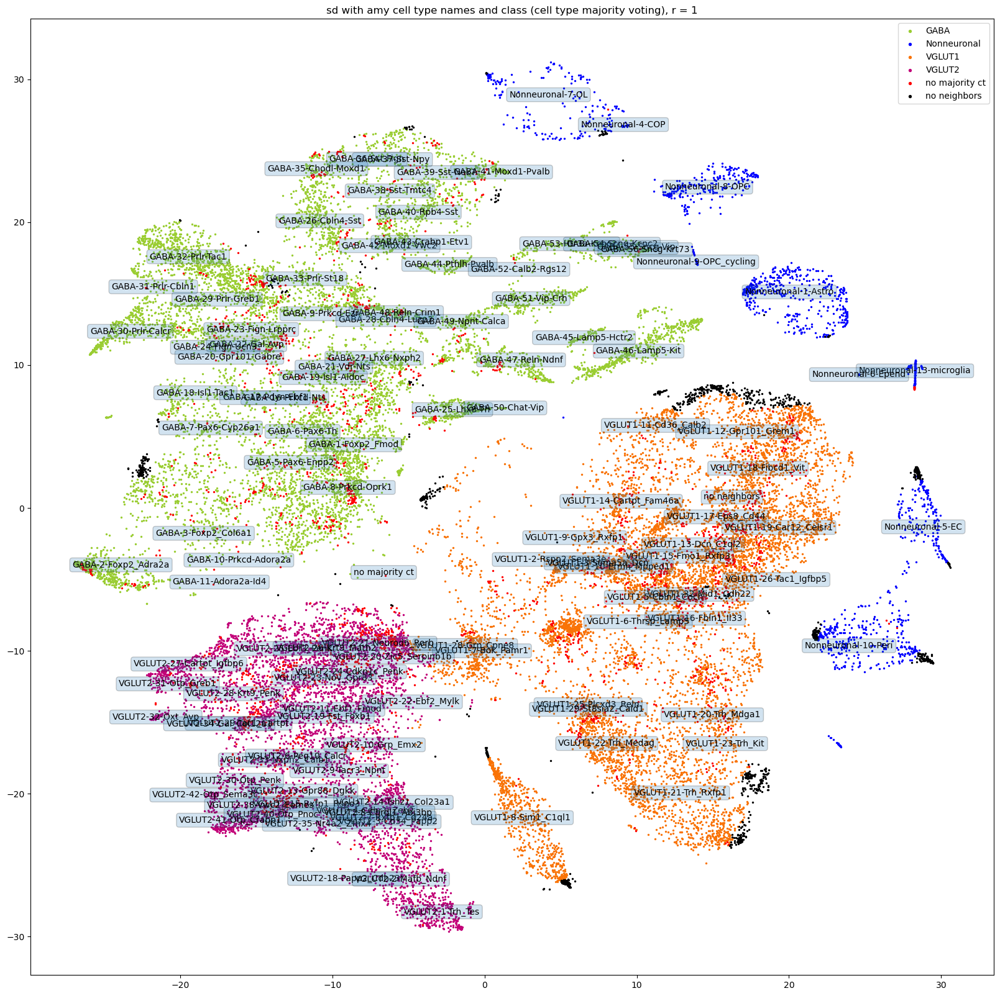

In [466]:
%matplotlib inline
thc.plot_transferred_cell_labels(sd_metadata_df_subset_w_amc,amy_sd_arr_tsne,meta_data_df_pca,
                                 1,
                                 '/bigdata/isaac/sd_amy_tsne_harmony_comp/v2_full_names/', 
                                 'ctype_cclass_sd_w_amy_names_mv_r_1_full_name',
                                 savefig=True)

In [758]:
list(np.unique(sd_metadata_df_subset_w_amc.loc['amy_class']))

['GABA',
 'NA - no majority ct',
 'NA - no neighbors',
 'Nonneuronal',
 'VGLUT1',
 'VGLUT2']

### Use text files containing hex codes for each cluster from amy paper to match cluster colors with amy assigned clusters in SD data

In [468]:
amy_cluster_txt_files = '/bigdata/isaac/sd_amy_tsne_harmony_comp/amy_cluster_txt_files/'

In [469]:
cd '/bigdata/isaac/sd_amy_tsne_harmony_comp/amy_cluster_txt_files/'

/bigdata/isaac/sd_amy_tsne_harmony_comp/amy_cluster_txt_files


/home/isaac/anaconda3/lib/python3.11/site-packages/IPython/core/magics/osm.py:417: UserWarning: This is now an optional IPython functionality, setting dhist requires you to install the `pickleshare` library.
  self.shell.db['dhist'] = compress_dhist(dhist)[-100:]


In [470]:
ls

Clusters_info_hannah.txt  Glut1-hexa.txt  old_2_new_cluster_names.csv
GABA-hexa.txt             Glut2-hexa.txt


In [473]:
#load file to convert old names to new names
old_2_new_cluster_names = pd.read_csv(amy_cluster_txt_files + 'old_2_new_cluster_names.csv')
old_2_new_cluster_names.head()

,old,new
0,'GABA_Fmod_Tshz1','GABA-1-Foxp2_Fmod'
1,'GABA_Scn10a_Tshz1','GABA-2-Foxp2_Adra2a'
2,'GABA_Plekha2_Tshz1','GABA-3-Foxp2_Col6a1'
3,'GABA_Htr1f_Tshz1','GABA-4-Foxp2_Htr1f'
4,'GABA_Oprk1_Myh7','GABA-5-Pax6-Enpp2'


In [474]:
#remove single quotes from entries
old_2_new_cluster_names["old"] = old_2_new_cluster_names["old"].str.replace("'", "", regex=False)
old_2_new_cluster_names["new"] = old_2_new_cluster_names["new"].str.replace("'", "", regex=False)

In [510]:
#make consistent using '-' instead of '_' in naming convention
old_2_new_cluster_names['new'] = old_2_new_cluster_names["new"].str.replace("_", "-", regex=False)

In [511]:
old_2_new_cluster_names.head()

,old,new
0,GABA_Fmod_Tshz1,GABA-1-Foxp2-Fmod
1,GABA_Scn10a_Tshz1,GABA-2-Foxp2-Adra2a
2,GABA_Plekha2_Tshz1,GABA-3-Foxp2-Col6a1
3,GABA_Htr1f_Tshz1,GABA-4-Foxp2-Htr1f
4,GABA_Oprk1_Myh7,GABA-5-Pax6-Enpp2


In [606]:
old_2_new_cluster_names.head()

,old,new
0,GABA_Fmod_Tshz1,GABA-1-Foxp2-Fmod
1,GABA_Scn10a_Tshz1,GABA-2-Foxp2-Adra2a
2,GABA_Plekha2_Tshz1,GABA-3-Foxp2-Col6a1
3,GABA_Htr1f_Tshz1,GABA-4-Foxp2-Htr1f
4,GABA_Oprk1_Myh7,GABA-5-Pax6-Enpp2


In [512]:
#create dict old:new
old_2_new_amy_dict = dict(zip(old_2_new_cluster_names['old'],old_2_new_cluster_names['new']))

In [518]:
gaba_hcodes_row = thc.get_hcodes(amy_cluster_txt_files,'GABA-hexa.txt','GABA',old_2_new_amy_dict,sd_metadata_df_subset_w_amc)

In [478]:
gaba_hcodes_row

,CAACAACAGACATATG-1_10X35_2,ATGACCATCGTGAGAG-1_10X51_1,AACCCAAAGAAATGGG-1_10X35_2,GAGGGATGTATGCTAC-1_10X35_1,AAGATAGGTAACACCT-1_10X37_2,CAGGGCTGTATCTTCT-1_10X51_1,CTGCTCATCCGATCGG-1_10X38_1,TGCTCCAAGAGGCGTT-1_10X51_1,TTGCCTGTCGTAGGGA-1_10X35_2,GCAACATAGATCGACG-1_10X51_2,...,CTCACTGCAGTAACGG-1_10X52_2,CATCGGGGTCAGTCTA-1_10X52_1,AGAAGTATCTAGATCG-1_10X51_4,ACCCAAAGTTGCATTG-1_10X52_1,TTCAGGAAGCCTGTGC-1_10X52_1,ATGCATGGTTCCCAAA-1_10X37_1,TCAGTTTCAGGCACAA-1_10X36_1,GTTCGCTAGGTTGGAC-1_10X52_4,TCCTCTTTCCAAATGC-1_10X51_4,GTCATCCTCAAACTGC-1_10X52_2
hexacode,064423,3CAA36,064423,064423,064423,064423,NA,064423,3CAA36,3CAA36,...,DEDC03,NA,NA,FDEB19,DEDC03,DEDC03,3CAA36,DEDC03,FDEB19,DEDC03


In [870]:
gaba_hcodes_row

,CAACAACAGACATATG-1_10X35_2,ATGACCATCGTGAGAG-1_10X51_1,AACCCAAAGAAATGGG-1_10X35_2,GAGGGATGTATGCTAC-1_10X35_1,AAGATAGGTAACACCT-1_10X37_2,CAGGGCTGTATCTTCT-1_10X51_1,CTGCTCATCCGATCGG-1_10X38_1,TGCTCCAAGAGGCGTT-1_10X51_1,TTGCCTGTCGTAGGGA-1_10X35_2,GCAACATAGATCGACG-1_10X51_2,...,CATCGGGGTCAGTCTA-1_10X52_1,GTTTACTGTTCTTAGG-1_10X51_3,AGAAGTATCTAGATCG-1_10X51_4,ACCCAAAGTTGCATTG-1_10X52_1,TTCAGGAAGCCTGTGC-1_10X52_1,ATGCATGGTTCCCAAA-1_10X37_1,TCAGTTTCAGGCACAA-1_10X36_1,TGTAACGCAATCTGCA-1_10X36_1,GTTCGCTAGGTTGGAC-1_10X52_4,TCCTCTTTCCAAATGC-1_10X51_4
hexacode,064423,064423,064423,064423,064423,064423,DEDC03,064423,064423,3CAA36,...,DEDC03,DEDC03,DEDC03,95C121,DEDC03,DEDC03,3CAA36,DEDC03,95C121,95C121


In [519]:
np.where(gaba_hcodes_row.loc['hexacode',:]=='NA')

(array([], dtype=int64),)

In [520]:
np.where(gaba_hcodes_row.loc['hexacode',:]==np.NaN)

(array([], dtype=int64),)

In [521]:
vglut1_hcodes_row = thc.get_hcodes(amy_cluster_txt_files,'Glut1-hexa.txt','VGLUT1',old_2_new_amy_dict,sd_metadata_df_subset_w_amc)

In [522]:
vglut1_hcodes_row

,TTTCGATCAATTCGTG-1_10X38_1,CTTAGGATCAACTGAC-1_10X52_4,CTGGTCTTCCAGTACA-1_10X51_1,GAGACTTCACGTCGGT-1_10X51_1,TATATCCAGGGTTAAT-1_10X52_4,GAAGTAAAGTGCGTCC-1_10X52_3,AGGTTACTCCATCTGC-1_10X51_1,GACCCTTAGGGACCAT-1_10X51_1,CAGTGCGTCTCAGTCC-1_10X51_2,TTGGGCGCAGAGGTAC-1_10X36_2,...,CGAGGAATCAGACAAA-1_10X37_2,ACCGTTCGTCATCTAG-1_10X51_1,ATAGGCTCAAATGAAC-1_10X51_2,ATTCCCGCAACCACGC-1_10X52_1,AGGCCACTCGTGGTAT-1_10X37_2,CGTTAGATCGTGAGAG-1_10X51_2,GAATAGAGTACTCCCT-1_10X52_3,ATCCCTGAGGATCACG-1_10X51_4,TCCCAGTCATCGCTAA-1_10X52_2,AGGTAGGAGCGTGTTT-1_10X36_2
hexacode,f39200,f39200,f39200,f39200,f39200,f39200,f39200,f39200,f39200,f39200,...,f39200,f39200,f39200,f39200,f39200,f39200,f39200,be1823,f39200,f39200


In [874]:
vglut1_hcodes_row

,TTTCGATCAATTCGTG-1_10X38_1,CTTAGGATCAACTGAC-1_10X52_4,CTGGTCTTCCAGTACA-1_10X51_1,GAGACTTCACGTCGGT-1_10X51_1,TATATCCAGGGTTAAT-1_10X52_4,GCTTTCGGTTCGAACT-1_10X38_1,TCCTTTCTCCTACACC-1_10X52_2,GAAGTAAAGTGCGTCC-1_10X52_3,AGGTTACTCCATCTGC-1_10X51_1,GACCCTTAGGGACCAT-1_10X51_1,...,ATCGGCGGTGAGTAAT-1_10X51_1,CAGTTCCGTAAGTTGA-1_10X52_1,CGAGGAATCAGACAAA-1_10X37_2,ACCGTTCGTCATCTAG-1_10X51_1,ATAGGCTCAAATGAAC-1_10X51_2,ATTCCCGCAACCACGC-1_10X52_1,AGGCCACTCGTGGTAT-1_10X37_2,CGTTAGATCGTGAGAG-1_10X51_2,GAATAGAGTACTCCCT-1_10X52_3,TCCCAGTCATCGCTAA-1_10X52_2
hexacode,f39200,f39200,f39200,f39200,f39200,be1823,e94f1c,f39200,f39200,f39200,...,f39200,f39200,f39200,f39200,f39200,f39200,f39200,f39200,f39200,f39200


In [523]:
np.where(vglut1_hcodes_row.loc['hexacode',:]=='NA')

(array([], dtype=int64),)

In [875]:
np.where(vglut1_hcodes_row.loc['hexacode',:]=='NA')

(array([5439, 5622, 5636, 6689, 8033, 8034, 8037, 8039, 8043]),)

In [524]:
np.where(vglut1_hcodes_row.loc['hexacode',:]==np.NaN)

(array([], dtype=int64),)

In [535]:
def get_hcodes(folder, txt_file, cell_class, old_2_new_amy_dict, metadata_df):
    '''using txt file in folder with hexacodes for each cluster, updates name in text file with old_2_new_amy_dict. 
    then iterates through metadata_df clusters matching cluster names to get corresponding hexacode.
    returns as dataframe with subset of metadata_df columns.'''
    hexa_df = pd.read_csv(folder + txt_file, delimiter="\t")
    #use old_2_new_amy_dict to get new cluster names and insert in hexa_df file
    hexa_df.insert(2,'updated_name', '')
    hexa_df['updated_name'] = [old_2_new_amy_dict[x] for x in list(hexa_df['Name'])]
    #isolate marker names and insert as dedicated column
    m = [x.split('-',2)[2] for x in list(hexa_df['updated_name'])]
    hexa_df.insert(3,'marker_name',m)
    #loop thru metadata isolated for specified class, get hexacodes
    hcodes = []
    #print (hexa_df)
    for x in list(metadata_df.loc['amy_markers',metadata_df.loc['amy_class']==cell_class]):
        hc = hexa_df.iloc[np.where(hexa_df.loc[:,'marker_name']==x)[0],4].values
        print (x)
        print (hc)
        if hc == np.NaN:
            print ('NAN')
        #assign any blanks as NA
        if not hc:
            hc = np.array(['NA'])
        hcodes.append(hc)
    hcodes = np.concatenate(hcodes,axis=0)
    hcodes = np.reshape(hcodes,(1,len(hcodes)))
    #get cols specific to cell_class
    cols = metadata_df.loc[:,metadata_df.loc['amy_class']==cell_class].columns
    #organize into dataframe using class specific columns
    hcodes_row = pd.DataFrame(hcodes,index = ['hexacode'], columns = cols)

    return hcodes_row

In [537]:
vglut2_hcodes_row = get_hcodes(amy_cluster_txt_files,'Glut2-hexa.txt','VGLUT2',old_2_new_amy_dict,sd_metadata_df_subset_w_amc)

Krt9-Matn2
['662483']
Krt9-Matn2
['662483']
Krt9-Matn2
['662483']
Neurod6-Rorb
['951b81']
Krt9-Matn2
['662483']
Krt9-Matn2
['662483']
Krt9-Matn2
['662483']
Krt9-Matn2
['662483']
Krt9-Matn2
['662483']
Krt9-Matn2
['662483']
Krt9-Matn2
['662483']
Krt9-Matn2
['662483']
Ebf1-Fmod
['a3195b']
Neurod6-Rorb
['951b81']
Ebf3-Penk
['662483']
Krt9-Matn2
['662483']
Cd34-Pappa2
[]
Ebf1-Fmod
['a3195b']
Ebf1-Fmod
['a3195b']
Ebf2-Mylk
['951b81']
Ebf1-Fmod
['a3195b']
Neurod6-Rorb
['951b81']
Zic5-Serpinb1b
['951b81']
Zic5-Serpinb1b
['951b81']
Neurod6-Rorb
['951b81']
Neurod6-Rorb
['951b81']
Neurod6-Rorb
['951b81']
Neurod6-Rorb
['951b81']
Neurod6-Rorb
['951b81']
Neurod6-Rorb
['951b81']
Ebf2-Mylk
['951b81']
Neurod6-Rorb
['951b81']
Zic5-Serpinb1b
['951b81']
Neurod6-Rorb
['951b81']
Zic5-Serpinb1b
['951b81']
Zic5-Serpinb1b
['951b81']
Ebf2-Mylk
['951b81']
Tshz1-Col23a1
['a3195b']
Tshz1-Col23a1
['a3195b']
Ebf3-Penk
['662483']
Ebf2-Mylk
['951b81']
Otp-Crabp1
['2d2e83']
Cd34-Pappa2
[]
Nr4a2-Zfhx4
['662483']
Cd34-Pa

/tmp/ipykernel_2519638/1135062496.py:19: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if hc == np.NaN:
/tmp/ipykernel_2519638/1135062496.py:22: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if not hc:


In [541]:
sd_metadata_df_subset_w_amc.loc[:,sd_metadata_df_subset_w_amc.loc['amy_markers',:]=='Pappa2-Cd34']

,GCGTTTCGTGGTACAG-1_10X36_1,TCAGTGAGTGTACATC-1_10X36_1,ACTTCCGTCAAGCCCG-1_10X52_4,ATCGATGGTCCCACGA-1_10X35_2,ATTCCATTCTCTTAAC-1_10X52_1,CTTCTCTCATGTCGTA-1_10X52_1,CTCTCGAGTATTCTCT-1_10X52_2,TGGATGTGTATGCGGA-1_10X51_3
cell_class,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2
markers,Foxb1-BC048546,Foxb1-BC048546,Foxb1-BC048546,Ndnf-Sox6,Ndnf-Sox6,Ndnf-Sox6,Pbx3-4930523C07Rik,Pbx3-4930523C07Rik
full_name,Vglut2-1-Foxb1-BC048546,Vglut2-1-Foxb1-BC048546,Vglut2-1-Foxb1-BC048546,Vglut2-19-Ndnf-Sox6,Vglut2-19-Ndnf-Sox6,Vglut2-19-Ndnf-Sox6,Vglut2-20-Pbx3-4930523C07Rik,Vglut2-20-Pbx3-4930523C07Rik
dataset,sd,sd,sd,sd,sd,sd,sd,sd
amy_class,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2
amy_markers,Pappa2-Cd34,Pappa2-Cd34,Pappa2-Cd34,Pappa2-Cd34,Pappa2-Cd34,Pappa2-Cd34,Pappa2-Cd34,Pappa2-Cd34
amy_full_name,VGLUT2-18-Papp2_Cdh23,VGLUT2-18-Papp2_Cdh23,VGLUT2-18-Papp2_Cdh23,VGLUT2-18-Papp2_Cdh23,VGLUT2-18-Papp2_Cdh23,VGLUT2-18-Papp2_Cdh23,VGLUT2-18-Papp2_Cdh23,VGLUT2-18-Papp2_Cdh23


In [539]:
sd_metadata_df_subset_w_amc

,CAACAACAGACATATG-1_10X35_2,ATGACCATCGTGAGAG-1_10X51_1,AACCCAAAGAAATGGG-1_10X35_2,GAGGGATGTATGCTAC-1_10X35_1,AAGATAGGTAACACCT-1_10X37_2,CAGGGCTGTATCTTCT-1_10X51_1,CTGCTCATCCGATCGG-1_10X38_1,TGCTCCAAGAGGCGTT-1_10X51_1,TTGCCTGTCGTAGGGA-1_10X35_2,GCAACATAGATCGACG-1_10X51_2,...,CAAGAGGGTCAATCTG-1_10X36_2,TATACCTAGAGTAACT-1_10X35_1,GCACGTGGTTATTCCT-1_10X37_1,GATGATCTCAAGCCTA-1_10X36_1,GGTGTCGAGAAGCTGC-1_10X36_2,GAGAGGTCACATCATG-1_10X37_2,ATCAGGTTCCACTAGA-1_10X35_2,TCCACGTAGAGCATCG-1_10X37_1,CTGCGAGCACTACGGC-1_10X35_2,CTCTGGTTCGAAGCAG-1_10X37_1
cell_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal
markers,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,...,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2
full_name,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,...,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2
dataset,sd,sd,sd,sd,sd,sd,sd,sd,sd,sd,...,sd,sd,sd,sd,sd,sd,sd,sd,sd,sd
amy_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,no neighbors,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal
amy_markers,Chat-Vip,Lhx8-Th,Chat-Vip,Chat-Vip,Chat-Vip,Chat-Vip,Foxp2-Fmod,Chat-Vip,Lhx8-Th,Lhx8-Th,...,OL,COP,COP,COP,OL,no neighbors,OL,OL,OL,OL
amy_full_name,GABA-50-Chat-Vip,GABA-25-Lhx8-Th,GABA-50-Chat-Vip,GABA-50-Chat-Vip,GABA-50-Chat-Vip,GABA-50-Chat-Vip,GABA-1-Foxp2_Fmod,GABA-50-Chat-Vip,GABA-25-Lhx8-Th,GABA-25-Lhx8-Th,...,Nonneuronal-7-OL,Nonneuronal-4-COP,Nonneuronal-4-COP,Nonneuronal-4-COP,Nonneuronal-7-OL,no neighbors,Nonneuronal-7-OL,Nonneuronal-7-OL,Nonneuronal-7-OL,Nonneuronal-7-OL


In [526]:
vglut2_hcodes_row

,TTCAATCTCGTTCCCA-1_10X52_1,CGCCAGAGTGGATTTC-1_10X38_2,GCTACAATCGGCAGTC-1_10X51_1,CCAATGAAGTTCTACG-1_10X52_2,AGACACTGTAGTCTTG-1_10X51_2,AATCACGTCGCCTAGG-1_10X38_1,AAGTTCGAGGTCGTGA-1_10X51_1,TTGTTGTTCTCTCAAT-1_10X51_1,TTCTTCCTCTACTCAT-1_10X51_1,TCCCATGGTGACGTCC-1_10X51_1,...,ATTGGGTGTATCGTGT-1_10X38_1,AGGAAATTCACCTGTC-1_10X51_1,AGCGCTGAGCGGTAAC-1_10X35_2,GATCATGTCACCGGTG-1_10X37_2,GAGTCATTCGACATTG-1_10X51_1,CACTGTCGTGACGTCC-1_10X38_1,CGAGGAAGTGTCTAAC-1_10X35_1,AGCCAATGTGTGTGGA-1_10X35_2,GCTGCAGTCGTAATGC-1_10X37_2,ATTCTTGAGTAGCCAG-1_10X36_1
hexacode,662483,662483,662483,951b81,662483,662483,662483,662483,662483,662483,...,NA,d60b52,d60b52,d60b52,d60b52,d60b52,d60b52,d60b52,d60b52,d60b52


In [878]:
vglut2_hcodes_row

,TTCAATCTCGTTCCCA-1_10X52_1,CGCCAGAGTGGATTTC-1_10X38_2,GCTACAATCGGCAGTC-1_10X51_1,CCAATGAAGTTCTACG-1_10X52_2,GAGTGAGCAATCGAAA-1_10X37_2,AGACACTGTAGTCTTG-1_10X51_2,AATCACGTCGCCTAGG-1_10X38_1,AAGTTCGAGGTCGTGA-1_10X51_1,TTGTTGTTCTCTCAAT-1_10X51_1,TTCTTCCTCTACTCAT-1_10X51_1,...,AGGAAATTCACCTGTC-1_10X51_1,AGCGCTGAGCGGTAAC-1_10X35_2,TCCGGGAGTGTTCAGT-1_10X51_1,GATCATGTCACCGGTG-1_10X37_2,GAGTCATTCGACATTG-1_10X51_1,CACTGTCGTGACGTCC-1_10X38_1,CGAGGAAGTGTCTAAC-1_10X35_1,AGCCAATGTGTGTGGA-1_10X35_2,GCTGCAGTCGTAATGC-1_10X37_2,ATTCTTGAGTAGCCAG-1_10X36_1
hexacode,662483,662483,662483,662483,662483,662483,662483,662483,662483,662483,...,d60b52,d60b52,d60b52,d60b52,d60b52,d60b52,d60b52,d60b52,d60b52,d60b52


In [527]:
np.where(vglut2_hcodes_row.loc['hexacode',:]=='NA')

(array([  16,   42,   44,   53,   58,   63,  943,  944,  945,  946,  947,
         952,  959,  960,  963,  965,  967,  968,  969,  970,  972,  973,
         979,  988,  989,  990,  991,  994, 1001, 1002, 1007, 1016, 1044,
        1046, 1047, 1049, 1052, 1054, 1055, 1082, 1100, 1102, 1109, 1207,
        1428, 1447, 1465, 1542, 1549, 1669, 3545, 3855, 3857, 3858, 3860,
        3867, 3875, 3880, 3885, 3886, 3891, 3893, 3901, 3904, 3905, 3906,
        3907, 3909, 3916, 3923, 3933, 3937, 3939, 3940, 3941, 3942, 3944,
        3947, 3948, 3949, 3950, 3951, 3955, 3957, 3959, 3960, 3962, 3963,
        3964, 3965, 3966, 3967, 3968, 3971, 3972, 3973, 3974, 3980, 3982,
        3983, 3984, 3988, 3992, 3994, 3995, 3997, 3998, 3999, 4000, 4001,
        4003, 4004, 4005, 4006, 4008, 4010, 4011, 4017, 4019, 4021, 4024,
        4042, 4043, 4063, 4066, 4072, 4073, 4074, 4075, 4076, 4077, 4080,
        4081, 4082, 4083, 4084, 4085, 4087, 4088, 4089, 4090, 4091, 4092,
        4093, 4094, 4096, 4097, 4098, 

In [879]:
np.where(vglut2_hcodes_row.loc['hexacode',:]=='NA')

(array([  24, 1022]),)

In [528]:
np.where(vglut2_hcodes_row.loc['hexacode',:]==np.nan)

(array([], dtype=int64),)

In [546]:
all_hcodes_row = pd.concat([gaba_hcodes_row,vglut1_hcodes_row,vglut2_hcodes_row], axis = 1)
all_hcodes_row

,CAACAACAGACATATG-1_10X35_2,ATGACCATCGTGAGAG-1_10X51_1,AACCCAAAGAAATGGG-1_10X35_2,GAGGGATGTATGCTAC-1_10X35_1,AAGATAGGTAACACCT-1_10X37_2,CAGGGCTGTATCTTCT-1_10X51_1,CTGCTCATCCGATCGG-1_10X38_1,TGCTCCAAGAGGCGTT-1_10X51_1,TTGCCTGTCGTAGGGA-1_10X35_2,GCAACATAGATCGACG-1_10X51_2,...,ATTGGGTGTATCGTGT-1_10X38_1,AGGAAATTCACCTGTC-1_10X51_1,AGCGCTGAGCGGTAAC-1_10X35_2,GATCATGTCACCGGTG-1_10X37_2,GAGTCATTCGACATTG-1_10X51_1,CACTGTCGTGACGTCC-1_10X38_1,CGAGGAAGTGTCTAAC-1_10X35_1,AGCCAATGTGTGTGGA-1_10X35_2,GCTGCAGTCGTAATGC-1_10X37_2,ATTCTTGAGTAGCCAG-1_10X36_1
hexacode,064423,3CAA36,064423,064423,064423,064423,FDEB19,064423,3CAA36,3CAA36,...,NA,d60b52,d60b52,d60b52,d60b52,d60b52,d60b52,d60b52,d60b52,d60b52


In [881]:
all_hcodes_row = pd.concat([gaba_hcodes_row,vglut1_hcodes_row,vglut2_hcodes_row], axis = 1)
all_hcodes_row

,CAACAACAGACATATG-1_10X35_2,ATGACCATCGTGAGAG-1_10X51_1,AACCCAAAGAAATGGG-1_10X35_2,GAGGGATGTATGCTAC-1_10X35_1,AAGATAGGTAACACCT-1_10X37_2,CAGGGCTGTATCTTCT-1_10X51_1,CTGCTCATCCGATCGG-1_10X38_1,TGCTCCAAGAGGCGTT-1_10X51_1,TTGCCTGTCGTAGGGA-1_10X35_2,GCAACATAGATCGACG-1_10X51_2,...,AGGAAATTCACCTGTC-1_10X51_1,AGCGCTGAGCGGTAAC-1_10X35_2,TCCGGGAGTGTTCAGT-1_10X51_1,GATCATGTCACCGGTG-1_10X37_2,GAGTCATTCGACATTG-1_10X51_1,CACTGTCGTGACGTCC-1_10X38_1,CGAGGAAGTGTCTAAC-1_10X35_1,AGCCAATGTGTGTGGA-1_10X35_2,GCTGCAGTCGTAATGC-1_10X37_2,ATTCTTGAGTAGCCAG-1_10X36_1
hexacode,064423,064423,064423,064423,064423,064423,DEDC03,064423,064423,3CAA36,...,d60b52,d60b52,d60b52,d60b52,d60b52,d60b52,d60b52,d60b52,d60b52,d60b52


In [547]:
sd_metadata_df_subset_w_amc_hex = sd_metadata_df_subset_w_amc.copy()
sd_metadata_df_subset_w_amc_hex = pd.concat([sd_metadata_df_subset_w_amc_hex,all_hcodes_row])

In [548]:
sd_metadata_df_subset_w_amc_hex

,CAACAACAGACATATG-1_10X35_2,ATGACCATCGTGAGAG-1_10X51_1,AACCCAAAGAAATGGG-1_10X35_2,GAGGGATGTATGCTAC-1_10X35_1,AAGATAGGTAACACCT-1_10X37_2,CAGGGCTGTATCTTCT-1_10X51_1,CTGCTCATCCGATCGG-1_10X38_1,TGCTCCAAGAGGCGTT-1_10X51_1,TTGCCTGTCGTAGGGA-1_10X35_2,GCAACATAGATCGACG-1_10X51_2,...,CAAGAGGGTCAATCTG-1_10X36_2,TATACCTAGAGTAACT-1_10X35_1,GCACGTGGTTATTCCT-1_10X37_1,GATGATCTCAAGCCTA-1_10X36_1,GGTGTCGAGAAGCTGC-1_10X36_2,GAGAGGTCACATCATG-1_10X37_2,ATCAGGTTCCACTAGA-1_10X35_2,TCCACGTAGAGCATCG-1_10X37_1,CTGCGAGCACTACGGC-1_10X35_2,CTCTGGTTCGAAGCAG-1_10X37_1
cell_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal
markers,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,...,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2
full_name,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,...,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2
dataset,sd,sd,sd,sd,sd,sd,sd,sd,sd,sd,...,sd,sd,sd,sd,sd,sd,sd,sd,sd,sd
amy_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,no neighbors,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal
amy_markers,Chat-Vip,Lhx8-Th,Chat-Vip,Chat-Vip,Chat-Vip,Chat-Vip,Foxp2-Fmod,Chat-Vip,Lhx8-Th,Lhx8-Th,...,OL,COP,COP,COP,OL,no neighbors,OL,OL,OL,OL
amy_full_name,GABA-50-Chat-Vip,GABA-25-Lhx8-Th,GABA-50-Chat-Vip,GABA-50-Chat-Vip,GABA-50-Chat-Vip,GABA-50-Chat-Vip,GABA-1-Foxp2_Fmod,GABA-50-Chat-Vip,GABA-25-Lhx8-Th,GABA-25-Lhx8-Th,...,Nonneuronal-7-OL,Nonneuronal-4-COP,Nonneuronal-4-COP,Nonneuronal-4-COP,Nonneuronal-7-OL,no neighbors,Nonneuronal-7-OL,Nonneuronal-7-OL,Nonneuronal-7-OL,Nonneuronal-7-OL
hexacode,064423,3CAA36,064423,064423,064423,064423,FDEB19,064423,3CAA36,3CAA36,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [884]:
#add full name row e.g. GABA-1-Foxp2-Fmod

In [885]:
list(np.unique(sd_metadata_df_subset_w_amc_hex.loc['amy_class']))

['GABA',
 'NA - no majority ct',
 'NA - no neighbors',
 'Nonneuronal',
 'VGLUT1',
 'VGLUT2']

In [886]:
#add colors for Nonneuronal, NA - no majority ct, and NA - no neighbors

In [549]:
sd_metadata_df_subset_w_amc_hex.loc['hexacode',sd_metadata_df_subset_w_amc_hex.loc['amy_class']=='Nonneuronal'] = '0000FF'

In [550]:
sd_metadata_df_subset_w_amc_hex.loc['hexacode',sd_metadata_df_subset_w_amc_hex.loc['amy_class']=='no majority ct'] = 'FF0000'

In [551]:
sd_metadata_df_subset_w_amc_hex.loc['hexacode',sd_metadata_df_subset_w_amc_hex.loc['amy_class']=='no neighbors'] = '000000'

In [552]:
sd_metadata_df_subset_w_amc_hex.isna().any(axis=None)

False

In [890]:
sd_metadata_df_subset_w_amc_hex.isna().any(axis=None)

False

In [553]:
sd_metadata_df_subset_w_amc_hex.to_json('/bigdata/isaac/sd_amy_tsne_harmony_comp/v2_full_names/sd_metadata_df_subset_w_amc_hex.json')

In [891]:
list(set(sd_metadata_df_subset_w_amc_hex.loc['hexacode']))

['a3195b',
 'FF0000',
 'f39200',
 '0000FF',
 'NA',
 '2d2e83',
 '662483',
 '026634',
 'be1823',
 'e94f1c',
 'FDEB19',
 '3CAA36',
 '951b81',
 '064423',
 'd60b52',
 '95C121',
 'DEDC03',
 '008D39',
 '000000']

In [554]:
len(np.where(sd_metadata_df_subset_w_amc_hex.loc['hexacode']=='NA')[0])

289

In [815]:
sd_metadata_df_subset_w_amc_hex.loc['hexacode']==np.NaN

CAACAACAGACATATG-1_10X35_2    False
ATGACCATCGTGAGAG-1_10X51_1    False
AACCCAAAGAAATGGG-1_10X35_2    False
GAGGGATGTATGCTAC-1_10X35_1    False
AAGATAGGTAACACCT-1_10X37_2    False
                              ...  
GAGAGGTCACATCATG-1_10X37_2    False
ATCAGGTTCCACTAGA-1_10X35_2    False
TCCACGTAGAGCATCG-1_10X37_1    False
CTGCGAGCACTACGGC-1_10X35_2    False
CTCTGGTTCGAAGCAG-1_10X37_1    False
Name: hexacode, Length: 26778, dtype: bool

In [796]:
len(np.where(sd_metadata_df_subset_w_amc_hex.loc['hexacode']==np.nan)[0])

0

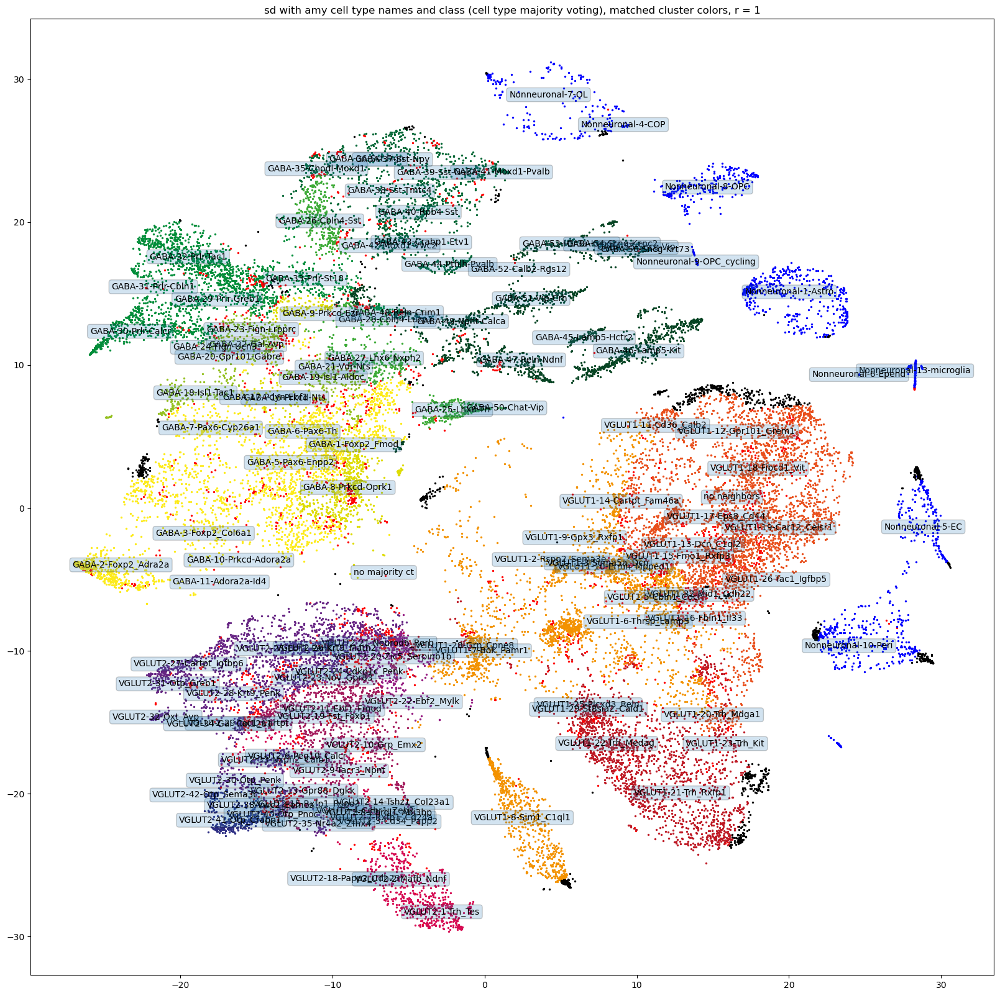

In [557]:
%matplotlib inline
distance_threshold = 1
#get sd cell type labels determined from majority voting using amy labels
sd_labels = list(np.unique(sd_metadata_df_subset_w_amc_hex.loc['amy_full_name']))

#get class labels
sd_classes = list(np.unique(sd_metadata_df_subset_w_amc_hex.loc['amy_class']))

#get amy transferred hexacode colors
sd_hexacode = list(set(sd_metadata_df_subset_w_amc_hex.loc['hexacode']))

fig,ax = plt.subplots(figsize = (20,20))
#label fontsize
label_fs = 10
#all pts
x = amy_sd_arr_tsne[:,0]
y = amy_sd_arr_tsne[:,1]
#sd pts
x_sd = x[meta_data_df_pca['dataset'] == 'sd']
y_sd = y[meta_data_df_pca['dataset'] == 'sd']
#ax.scatter(x_sd,y_sd,s=2,c = 'b', label = 'sd',alpha=.25)
for hc in sd_hexacode:
    #print (hc)
    if hc != 'NA':
        ax.scatter(x_sd[sd_metadata_df_subset_w_amc_hex.T['hexacode']==hc],y_sd[sd_metadata_df_subset_w_amc_hex.T['hexacode']==hc], s = 2, c = '#' + hc)

#combine into 2D array
arr_xy_sd = np.vstack([x_sd,y_sd])
for sd_ct in sd_labels:
    #print (arr_xy_sd.T[sd_metadata_df_subset.T['markers']==sd_ct])
    cluster_median = np.median(arr_xy_sd.T[sd_metadata_df_subset_w_amc_hex.T['amy_full_name']==sd_ct],axis = 0)
    ax.annotate(text = sd_ct, xy=cluster_median, fontsize=label_fs, color='black',
                    ha='center', va='center', bbox=dict(boxstyle='round', alpha=0.2))
#ax.set_xticks([])
#ax.set_yticks([])
ax.set_title('sd with amy cell type names and class (cell type majority voting), matched cluster colors, r = ' + str(distance_threshold))
#ax.legend(markerscale=2 )

plt.savefig('/bigdata/isaac/sd_amy_tsne_harmony_comp/v2_full_names/ctype_cclass_sd_w_amy_names_r_1_clusters_full_name.pdf')
plt.show()

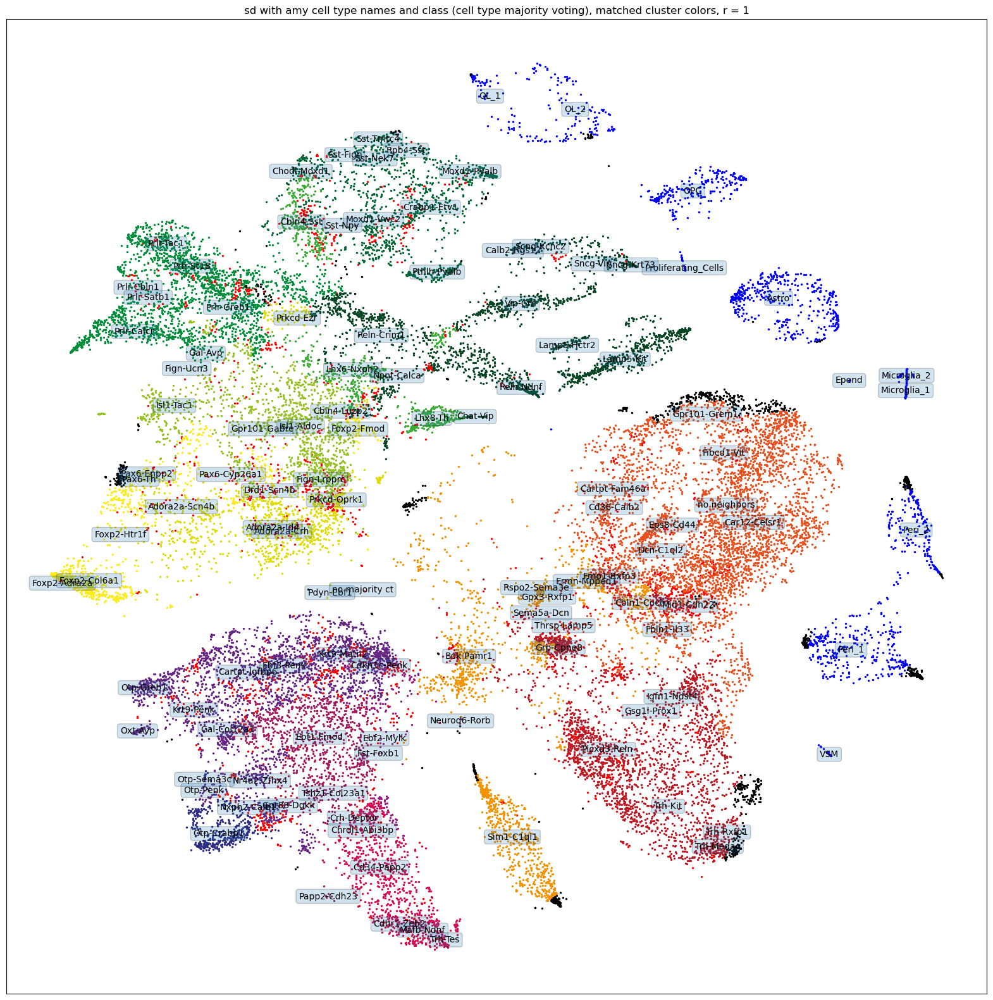

In [896]:
%matplotlib inline
#get sd cell type labels determined from majority voting using amy labels
sd_labels = list(np.unique(sd_metadata_df_subset_w_amc.loc['amy_markers']))

#get class labels
sd_classes = list(np.unique(sd_metadata_df_subset_w_amc.loc['amy_class']))

#get amy transferred hexacode colors
sd_hexacode = list(set(sd_metadata_df_subset_w_amc_hex.loc['hexacode']))

fig,ax = plt.subplots(figsize = (20,20))
#label fontsize
label_fs = 10
#all pts
x = amy_sd_arr_tsne[:,0]
y = amy_sd_arr_tsne[:,1]
#sd pts
x_sd = x[meta_data_df_pca['dataset'] == 'sd']
y_sd = y[meta_data_df_pca['dataset'] == 'sd']
#ax.scatter(x_sd,y_sd,s=2,c = 'b', label = 'sd',alpha=.25)
for hc in sd_hexacode:
    #print (hc)
    if hc != 'NA':
        ax.scatter(x_sd[sd_metadata_df_subset_w_amc_hex.T['hexacode']==hc],y_sd[sd_metadata_df_subset_w_amc_hex.T['hexacode']==hc], s = 2, c = '#' + hc)

#combine into 2D array
arr_xy_sd = np.vstack([x_sd,y_sd])
for sd_ct in sd_labels:
    #print (arr_xy_sd.T[sd_metadata_df_subset.T['markers']==sd_ct])
    cluster_median = np.median(arr_xy_sd.T[sd_metadata_df_subset_w_amc.T['amy_markers']==sd_ct],axis = 0)
    ax.annotate(text = sd_ct, xy=cluster_median, fontsize=label_fs, color='black',
                    ha='center', va='center', bbox=dict(boxstyle='round', alpha=0.2))
#ax.set_xticks([])
#ax.set_yticks([])
ax.set_title('sd with amy cell type names and class (cell type majority voting), matched cluster colors, r = ' + str(distance_threshold))
#ax.legend(markerscale=2 )

#plt.savefig('/bigdata/isaac/sd_amy_tsne_harmony_comp/ctype_cclass_sd_w_amy_names_r_1_clusters.pdf')
plt.show()

In [49]:
sd_metadata_df_subset_w_amc_hex

,CAACAACAGACATATG-1_10X35_2,ATGACCATCGTGAGAG-1_10X51_1,AACCCAAAGAAATGGG-1_10X35_2,GAGGGATGTATGCTAC-1_10X35_1,AAGATAGGTAACACCT-1_10X37_2,CAGGGCTGTATCTTCT-1_10X51_1,CTGCTCATCCGATCGG-1_10X38_1,TGCTCCAAGAGGCGTT-1_10X51_1,TTGCCTGTCGTAGGGA-1_10X35_2,GCAACATAGATCGACG-1_10X51_2,...,CAAGAGGGTCAATCTG-1_10X36_2,TATACCTAGAGTAACT-1_10X35_1,GCACGTGGTTATTCCT-1_10X37_1,GATGATCTCAAGCCTA-1_10X36_1,GGTGTCGAGAAGCTGC-1_10X36_2,GAGAGGTCACATCATG-1_10X37_2,ATCAGGTTCCACTAGA-1_10X35_2,TCCACGTAGAGCATCG-1_10X37_1,CTGCGAGCACTACGGC-1_10X35_2,CTCTGGTTCGAAGCAG-1_10X37_1
cell_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal
markers,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,...,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2
dataset,sd,sd,sd,sd,sd,sd,sd,sd,sd,sd,...,sd,sd,sd,sd,sd,sd,sd,sd,sd,sd
amy_markers,Chat-Vip,Chat-Vip,Chat-Vip,Chat-Vip,Chat-Vip,Chat-Vip,Adora2a-Scn4b,Chat-Vip,Chat-Vip,Lhx8-Th,...,OL_2,OL_2,OL_2,OL_2,OL_2,no neighbors,OL_2,OL_2,OL_2,OL_2
amy_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,NA - no neighbors,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal
hexacode,064423,064423,064423,064423,064423,064423,DEDC03,064423,064423,3CAA36,...,0000FF,0000FF,0000FF,0000FF,0000FF,000000,0000FF,0000FF,0000FF,0000FF


In [62]:
with open ('/bigdata/isaac/sd_amy_tsne_harmony_comp/sd_metadata_df_subset.json') as json_data:
    sd_metadata_df_subset = json.load(json_data)
sd_metadata_df_subset = pd.DataFrame.from_dict(sd_metadata_df_subset, orient='columns')

In [58]:
sd_metadata_df_subset_w_amc_hex.loc[:,sd_metadata_df_subset_w_amc_hex.loc['amy_markers'] == 'no majority ct']

,GTTAGACGTTTAAGGA-1_10X38_1,TCCTCGAAGAGCACTG-1_10X37_2,TTCCAATGTTCGGACC-1_10X52_2,GTCTAGAGTTCAATCG-1_10X38_1,CCATAAGAGACGCCCT-1_10X35_2,GATGGAGCAGACCTAT-1_10X36_1,CTCAGAAGTGGCTAGA-1_10X52_3,GTGTTAGCACTCGATA-1_10X37_2,GTAACCAGTCGCGTTG-1_10X52_2,AGAAGCGAGGTTGGTG-1_10X52_1,...,ATTCCCGCACAGCCAC-1_10X38_2,TTGCCTGCATACCGTA-1_10X51_2,GTCATCCGTGTCCGTG-1_10X38_1,TCTTCCTCACCTGTCT-1_10X36_1,CTTCCTTCAGACCCGT-1_10X51_1,TCCACGTAGACATACA-1_10X51_2,GCCCGAAGTGCCGAAA-1_10X35_1,CGAAGGAGTGCGGATA-1_10X51_1,CCGTAGGCAATAGTAG-1_10X37_1,GTCATCCTCAAACTGC-1_10X52_2
cell_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Nonneuronal
markers,Chat-Isl1,Sncg-Htr3a,Sncg-Htr3a,Sncg-Htr3a,Sncg-Htr3a,Sncg-Htr3a,Sncg-Htr3a,Sncg-Htr3a,Sncg-Htr3a,Sncg-Htr3a,...,Pbx3-4930523C07Rik,Pbx3-4930523C07Rik,Pbx3-4930523C07Rik,Pbx3-4930523C07Rik,Pbx3-4930523C07Rik,Pbx3-4930523C07Rik,Pbx3-4930523C07Rik,Pbx3-4930523C07Rik,Pbx3-4930523C07Rik,OPC
dataset,sd,sd,sd,sd,sd,sd,sd,sd,sd,sd,...,sd,sd,sd,sd,sd,sd,sd,sd,sd,sd
amy_markers,no majority ct,no majority ct,no majority ct,no majority ct,no majority ct,no majority ct,no majority ct,no majority ct,no majority ct,no majority ct,...,no majority ct,no majority ct,no majority ct,no majority ct,no majority ct,no majority ct,no majority ct,no majority ct,no majority ct,no majority ct
amy_class,NA - no majority ct,NA - no majority ct,NA - no majority ct,NA - no majority ct,NA - no majority ct,NA - no majority ct,NA - no majority ct,NA - no majority ct,NA - no majority ct,NA - no majority ct,...,NA - no majority ct,NA - no majority ct,NA - no majority ct,NA - no majority ct,NA - no majority ct,NA - no majority ct,NA - no majority ct,NA - no majority ct,NA - no majority ct,NA - no majority ct
hexacode,FF0000,FF0000,FF0000,FF0000,FF0000,FF0000,FF0000,FF0000,FF0000,FF0000,...,FF0000,FF0000,FF0000,FF0000,FF0000,FF0000,FF0000,FF0000,FF0000,FF0000


In [59]:
sd_metadata_df_subset_w_amc_hex.loc[:,sd_metadata_df_subset_w_amc_hex.loc['amy_markers'] == 'no neighbors']

,AGAGCCCCAGTCAGTT-1_10X35_2,AGTGCCGCACTGAATC-1_10X35_2,TCATACTTCTCATGGA-1_10X52_2,GCTTTCGCATAGAGGC-1_10X36_2,GTGGTTACATTAGGCT-1_10X35_1,TCTACCGAGGCATGGT-1_10X35_2,CCTTGTGGTCAGTCTA-1_10X51_1,ATTCTACGTGGATACG-1_10X52_1,CTGTAGAAGCTAGATA-1_10X38_1,ATACTTCCAGCCCACA-1_10X51_2,...,AAGTGAAAGGCTGAAC-1_10X51_1,AGACAAACAGAATTCC-1_10X51_2,GACCAATTCAAACTGC-1_10X51_1,CTCCACACAGCTGAGA-1_10X51_2,CAGGCCAGTGGCGCTT-1_10X51_1,ATGGGTTGTCACCGCA-1_10X51_2,TTGCATTGTCGTGGAA-1_10X38_1,CACTTCGGTGAATGAT-1_10X52_2,AAGCCATGTGGATGAC-1_10X35_1,GAGAGGTCACATCATG-1_10X37_2
cell_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal
markers,Pthlh-Pvalb,Pthlh-Pvalb,Pthlh-Pvalb,Pthlh-Pvalb,Pthlh-Pvalb,Pthlh-Pvalb,Pthlh-Pvalb,Pthlh-Pvalb,Maf-Mafb,Maf-Mafb,...,OL_1,OL_1,OL_1,OL_1,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2
dataset,sd,sd,sd,sd,sd,sd,sd,sd,sd,sd,...,sd,sd,sd,sd,sd,sd,sd,sd,sd,sd
amy_markers,no neighbors,no neighbors,no neighbors,no neighbors,no neighbors,no neighbors,no neighbors,no neighbors,no neighbors,no neighbors,...,no neighbors,no neighbors,no neighbors,no neighbors,no neighbors,no neighbors,no neighbors,no neighbors,no neighbors,no neighbors
amy_class,NA - no neighbors,NA - no neighbors,NA - no neighbors,NA - no neighbors,NA - no neighbors,NA - no neighbors,NA - no neighbors,NA - no neighbors,NA - no neighbors,NA - no neighbors,...,NA - no neighbors,NA - no neighbors,NA - no neighbors,NA - no neighbors,NA - no neighbors,NA - no neighbors,NA - no neighbors,NA - no neighbors,NA - no neighbors,NA - no neighbors
hexacode,000000,000000,000000,000000,000000,000000,000000,000000,000000,000000,...,000000,000000,000000,000000,000000,000000,000000,000000,000000,000000


In [68]:
sd_metadata_df_subset_w_amc_hex.shape

(6, 26778)

In [559]:
_, idx = np.unique(sd_metadata_df_subset_w_amc_hex.loc['markers'], return_index=True)
sd_markers = np.array(sd_metadata_df_subset_w_amc_hex.loc['markers'][np.sort(idx)])

/tmp/ipykernel_2519638/2945933882.py:2: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  sd_markers = np.array(sd_metadata_df_subset_w_amc_hex.loc['markers'][np.sort(idx)])


In [560]:
len(sd_markers)

103

In [561]:
_, idx = np.unique(sd_metadata_df_subset_w_amc_hex.loc['amy_markers'], return_index=True)
amy_markers = np.array(sd_metadata_df_subset_w_amc_hex.loc['amy_markers'][np.sort(idx)])

/tmp/ipykernel_2519638/1368238258.py:2: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  amy_markers = np.array(sd_metadata_df_subset_w_amc_hex.loc['amy_markers'][np.sort(idx)])


In [585]:
_, idx = np.unique(sd_metadata_df_subset_w_amc_hex.loc['full_name'], return_index=True)
sd_fn = np.array(sd_metadata_df_subset_w_amc_hex.loc['full_name'][np.sort(idx)])

/tmp/ipykernel_2519638/193487750.py:2: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  sd_fn = np.array(sd_metadata_df_subset_w_amc_hex.loc['full_name'][np.sort(idx)])


In [586]:
_, idx = np.unique(sd_metadata_df_subset_w_amc_hex.loc['amy_full_name'], return_index=True)
amy_fn = np.array(sd_metadata_df_subset_w_amc_hex.loc['amy_full_name'][np.sort(idx)])

/tmp/ipykernel_2519638/965187987.py:2: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  amy_fn = np.array(sd_metadata_df_subset_w_amc_hex.loc['amy_full_name'][np.sort(idx)])


In [588]:
len(sd_fn)

103

In [ ]:
sd_in_amy_cts = np.full([len(sd_markers),len(amy_markers)],np.NaN)
sd_in_amy_cts.shape

(103, 122)

In [589]:
sd_in_amy_cts_fn = np.full([len(sd_fn),len(amy_fn)],np.NaN)
sd_in_amy_cts_fn.shape

(103, 122)

In [132]:
tmp_amy_ct = sd_metadata_df_subset_w_amc_hex.loc[:,sd_metadata_df_subset_w_amc_hex.loc['amy_markers']=='Sncg-Htr3a']

In [133]:
tmp_amy_ct.shape[1]

0

In [98]:
tmp_amy_ct.loc[:,tmp_amy_ct.loc['markers',:] == 'Chat-Isl1'].shape[1]

20

In [595]:
frac_df = pd.DataFrame(index=sd_markers, columns=amy_markers)
frac_df

,Chat-Vip,Lhx8-Th,Foxp2-Fmod,Sncg-Krt73,Sncg-Vip,no majority ct,Scng-Kcnc2,Htr3a-Kcnc2,Reln-Ndnf,Calb2-Rgs12,...,Vwc2-Eomes,Epend,microglia,OPC_cycling,OPC,Astro,Peri,EC,COP,OL
Chat-Isl1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Sncg-Htr3a,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Vip-Cbln2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Cpne4-Pde3a,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Reln-Ndnf,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
VSM,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
OPC,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Astro,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
OL_1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [596]:
for i,sd_m in enumerate(sd_markers):
    for j,amy_m in enumerate(amy_markers):
        #fraction of sd cell type in amy cell type
        sd_ct_df = sd_metadata_df_subset_w_amc_hex.loc[:,sd_metadata_df_subset_w_amc_hex.loc['markers']==sd_m]
        n_sd = sd_ct_df.shape[1]
        amy_in_sd_ct_df = sd_ct_df.loc[:,sd_ct_df.loc['amy_markers',:] == amy_m]
        n_amy_in_sd_ct = amy_in_sd_ct_df.shape[1]
        frac = round(n_amy_in_sd_ct/n_sd,2)
        frac_df.loc[sd_m,amy_m] = frac
        #print (i,j)
        #sd_in_amy_cts[[i,j]] = frac
        #print (amy_m)
        #print (n_amy)
        
    #print (sd_m)

In [597]:
frac_df

,Chat-Vip,Lhx8-Th,Foxp2-Fmod,Sncg-Krt73,Sncg-Vip,no majority ct,Scng-Kcnc2,Htr3a-Kcnc2,Reln-Ndnf,Calb2-Rgs12,...,Vwc2-Eomes,Epend,microglia,OPC_cycling,OPC,Astro,Peri,EC,COP,OL
Chat-Isl1,0.54,0.38,0.08,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Sncg-Htr3a,0.0,0.0,0.0,0.24,0.03,0.03,0.24,0.29,0.15,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Vip-Cbln2,0.01,0.0,0.0,0.0,0.0,0.0,0.08,0.02,0.01,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Cpne4-Pde3a,0.0,0.0,0.04,0.0,0.0,0.08,0.0,0.0,0.46,0.04,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Reln-Ndnf,0.0,0.0,0.0,0.0,0.0,0.05,0.0,0.01,0.85,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
VSM,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
OPC,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.97,0.0,0.0,0.0,0.02,0.0
Astro,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.98,0.0,0.0,0.0,0.0
OL_1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.01,0.84


In [599]:
frac_df.sum(axis=1)

Chat-Isl1       1.0
Sncg-Htr3a     0.98
Vip-Cbln2       1.0
Cpne4-Pde3a    0.99
Reln-Ndnf      0.98
               ... 
VSM             1.0
OPC            0.99
Astro           1.0
OL_1            1.0
OL_2            1.0
Length: 103, dtype: object

In [575]:
len(amy_dd_order)

144

In [576]:
#use '-' consistently instead of occasional '_' in marker names
amy_dd_order = [x.replace("_", "-") for x in amy_dd_order]

In [577]:
amy_dd_order

['GABA-1-Foxp2-Fmod',
 'GABA-2-Foxp2-Adra2a',
 'GABA-3-Foxp2-Col6a1',
 'GABA-4-Foxp2-Htr1f',
 'GABA-5-Pax6-Enpp2',
 'GABA-6-Pax6-Th',
 'GABA-7-Pax6-Cyp26a1',
 'GABA-8-Prkcd-Oprk1',
 'GABA-9-Prkcd-Ezr',
 'GABA-10-Prkcd-Adora2a',
 'GABA-11-Adora2a-Id4',
 'GABA-12-Adora2a-Scn4b',
 'GABA-13-Adora2a-Crh',
 'GABA-14-Drd1-Scn4b',
 'GABA-15-Drd1-Ebf1',
 'GABA-16-Prkcd-Nts',
 'GABA-17-Pdyn-Ebf1',
 'GABA-18-Isl1-Tac1',
 'GABA-19-Isl1-Aldoc',
 'GABA-20-Gpr101-Gabre',
 'GABA-21-Vdr-Nts',
 'GABA-22-Gal-Avp',
 'GABA-23-Fign-Lrpprc',
 'GABA-24-Fign-Ucn3',
 'GABA-25-Lhx8-Th',
 'GABA-26-Cbln4-Sst',
 'GABA-27-Lhx6-Nxph2',
 'GABA-28-Cbln4-Luzp2',
 'GABA-29-Prlr-Greb1',
 'GABA-30-Prlr-Calcr',
 'GABA-31-Prlr-Cbln1',
 'GABA-32-Prlr-Tac1',
 'GABA-33-Prlr-St18',
 'GABA-34-Prlr-Satb1',
 'GABA-35-Chodl-Moxd1',
 'GABA-36-Sst-Fign',
 'GABA-37-Sst-Npy',
 'GABA-38-Sst-Tmtc4',
 'GABA-39-Sst-Nek7',
 'GABA-40-Rpb4-Sst',
 'GABA-41-Moxd1-Pvalb',
 'GABA-42-Moxd1-Vwc2',
 'GABA-43-Crabp1-Etv1',
 'GABA-44-Pthlh-Pvalb',
 'GA

In [578]:
[(i,x) for (i,x) in enumerate(amy_dd_order) if 'Papp' in x]

[(90, 'VGLUT2-3-Cd34-Papp2'), (105, 'VGLUT2-18-Papp2-Cdh23')]

In [579]:
#fix misspelled instances of 'Papp'
amy_dd_order[90] = 'VGLUT2-3-Cd34-Pappa2'
amy_dd_order[105] = 'VGLUT2-18-Pappa2-Cdh23'

In [580]:
amy_dd_order[90]

'VGLUT2-3-Cd34-Pappa2'

In [581]:
frac_df.columns

Index(['Chat-Vip', 'Lhx8-Th', 'Foxp2-Fmod', 'Sncg-Krt73', 'Sncg-Vip',
       'no majority ct', 'Scng-Kcnc2', 'Htr3a-Kcnc2', 'Reln-Ndnf',
       'Calb2-Rgs12',
       ...
       'Vwc2-Eomes', 'Epend', 'microglia', 'OPC_cycling', 'OPC', 'Astro',
       'Peri', 'EC', 'COP', 'OL'],
      dtype='object', length=122)

In [582]:
amy_dd_order[:-14]

['GABA-1-Foxp2-Fmod',
 'GABA-2-Foxp2-Adra2a',
 'GABA-3-Foxp2-Col6a1',
 'GABA-4-Foxp2-Htr1f',
 'GABA-5-Pax6-Enpp2',
 'GABA-6-Pax6-Th',
 'GABA-7-Pax6-Cyp26a1',
 'GABA-8-Prkcd-Oprk1',
 'GABA-9-Prkcd-Ezr',
 'GABA-10-Prkcd-Adora2a',
 'GABA-11-Adora2a-Id4',
 'GABA-12-Adora2a-Scn4b',
 'GABA-13-Adora2a-Crh',
 'GABA-14-Drd1-Scn4b',
 'GABA-15-Drd1-Ebf1',
 'GABA-16-Prkcd-Nts',
 'GABA-17-Pdyn-Ebf1',
 'GABA-18-Isl1-Tac1',
 'GABA-19-Isl1-Aldoc',
 'GABA-20-Gpr101-Gabre',
 'GABA-21-Vdr-Nts',
 'GABA-22-Gal-Avp',
 'GABA-23-Fign-Lrpprc',
 'GABA-24-Fign-Ucn3',
 'GABA-25-Lhx8-Th',
 'GABA-26-Cbln4-Sst',
 'GABA-27-Lhx6-Nxph2',
 'GABA-28-Cbln4-Luzp2',
 'GABA-29-Prlr-Greb1',
 'GABA-30-Prlr-Calcr',
 'GABA-31-Prlr-Cbln1',
 'GABA-32-Prlr-Tac1',
 'GABA-33-Prlr-St18',
 'GABA-34-Prlr-Satb1',
 'GABA-35-Chodl-Moxd1',
 'GABA-36-Sst-Fign',
 'GABA-37-Sst-Npy',
 'GABA-38-Sst-Tmtc4',
 'GABA-39-Sst-Nek7',
 'GABA-40-Rpb4-Sst',
 'GABA-41-Moxd1-Pvalb',
 'GABA-42-Moxd1-Vwc2',
 'GABA-43-Crabp1-Etv1',
 'GABA-44-Pthlh-Pvalb',
 'GA

In [ ]:
#amy_dd_order_markers = [x.split('-')[2:] for x in amy_dd_order[:-14]]

In [ ]:
#amy_dd_order_markers = ['-'.join(x) for x in amy_dd_order_markers]

In [121]:
type(frac_df.iloc[0,0])

float

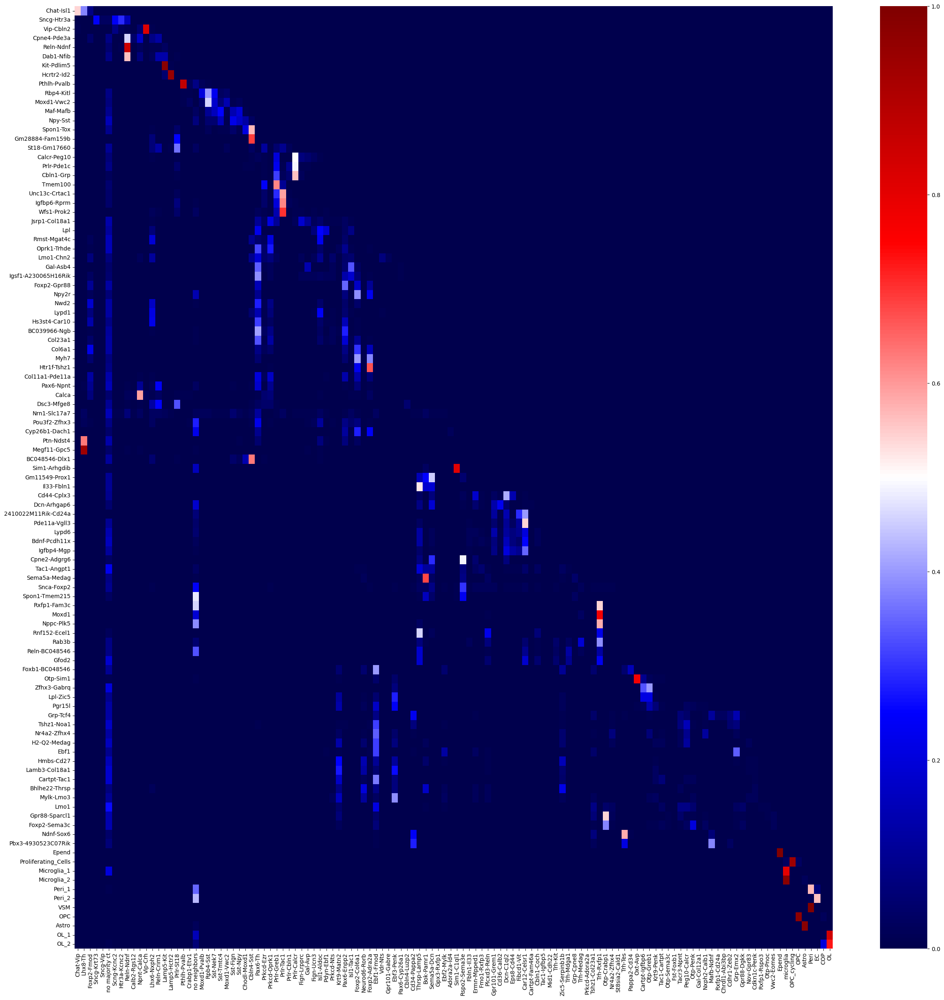

In [598]:
fig,ax = plt.subplots(figsize = (30,30))
sns.heatmap(frac_df.astype('float32'), annot=False,  cmap='seismic')
#ax.set_xticklabels(ax.get_xticks(), rotation = 45)
#plt.savefig('/bigdata/isaac/sd_amy_tsne_harmony_comp/v2_full_names/frac_amy_cts_in_sd_cts_heatmap_full_names.pdf')
plt.show()

In [ ]:
#interactive version

In [600]:
heatmap2 = frac_df.hvplot.heatmap(title='Fraction of Amy cell types per SD Cell Types Post Cluster Label Transfer',  
                                                                                                cmap='seismic', width=1200, height=1000, colorbar=True)
heatmap2.opts(xrotation = 45, xlabel='Amy Cell Types',ylabel='SD Cell Types')
hvplot.show(heatmap2)
    
# Ensure output is displayed inline
hv.output(heatmap2, backend='bokeh')
hv.save(heatmap2, '/bigdata/isaac/sd_amy_tsne_harmony_comp/v2_full_names/frac_amy_cts_in_sd_cts_heatmap_interactive.html', fmt='html')

Launching server at http://localhost:46523


:HeatMap   [columns,index]   (value)

In [602]:
### full name version
frac_df_fn = pd.DataFrame(index=sd_fn, columns=amy_fn)

for i,sd_m in enumerate(sd_fn):
    for j,amy_m in enumerate(amy_fn):
        #fraction of sd cell type in amy cell type
        sd_ct_df = sd_metadata_df_subset_w_amc_hex.loc[:,sd_metadata_df_subset_w_amc_hex.loc['full_name']==sd_m]
        n_sd = sd_ct_df.shape[1]
        amy_in_sd_ct_df = sd_ct_df.loc[:,sd_ct_df.loc['amy_full_name',:] == amy_m]
        n_amy_in_sd_ct = amy_in_sd_ct_df.shape[1]
        frac = round(n_amy_in_sd_ct/n_sd,2)
        frac_df_fn.loc[sd_m,amy_m] = frac

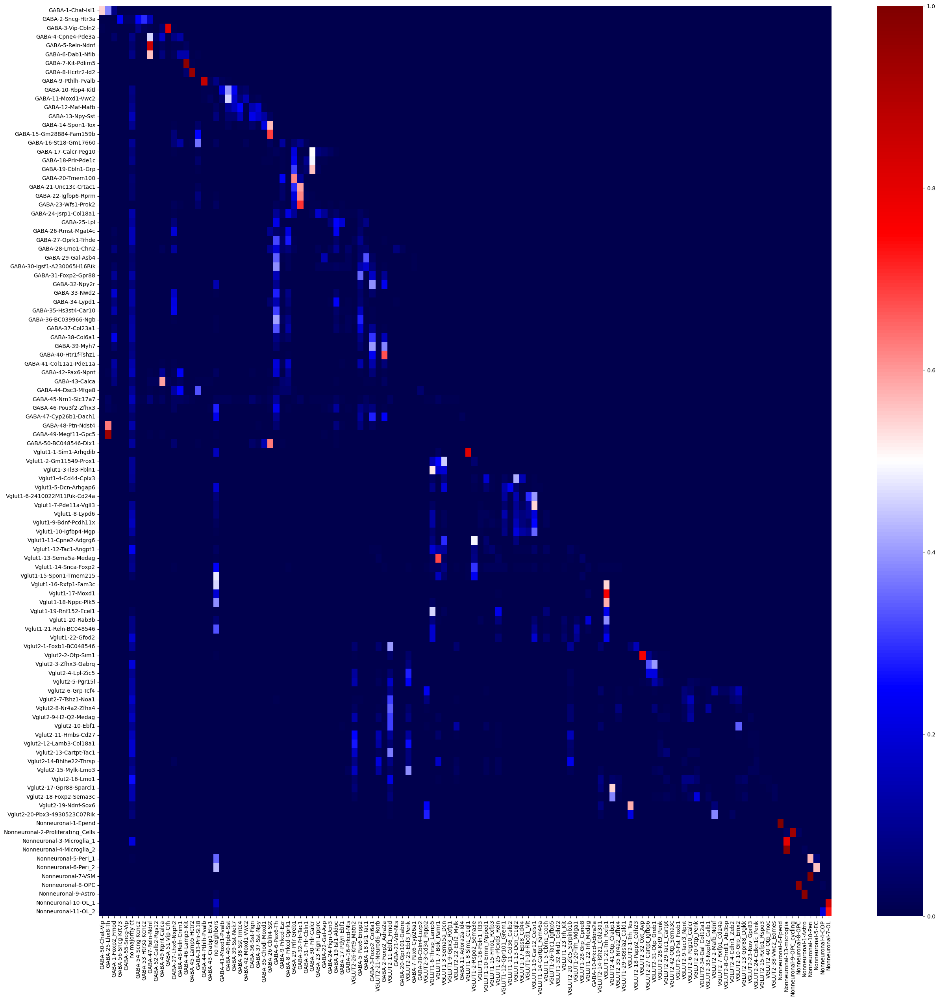

In [612]:
fig,ax = plt.subplots(figsize = (30,30))
sns.heatmap(frac_df_fn.astype('float32'), annot=False,  cmap='seismic')
#ax.set_xticklabels(ax.get_xticks(), rotation = 20)
plt.savefig('/bigdata/isaac/sd_amy_tsne_harmony_comp/v2_full_names/frac_amy_cts_in_sd_cts_heatmap_full_names.pdf')
plt.show()

In [ ]:
heatmap2 = frac_df_fn.hvplot.heatmap(title='Fraction of Amy cell types per SD Cell Types Post Cluster Label Transfer',  
                                                                                                cmap='seismic', width=1200, height=1000, colorbar=True)
heatmap2.opts(xrotation = 45, xlabel='Amy Cell Types',ylabel='SD Cell Types')
hvplot.show(heatmap2)
    
# Ensure output is displayed inline
hv.output(heatmap2, backend='bokeh')
hv.save(heatmap2, '/bigdata/isaac/sd_amy_tsne_harmony_comp/v2_full_names/frac_amy_cts_in_sd_cts_heatmap_interactive_full_names.html', fmt='html')

In [601]:
sd_metadata_df_subset_w_amc_hex

,CAACAACAGACATATG-1_10X35_2,ATGACCATCGTGAGAG-1_10X51_1,AACCCAAAGAAATGGG-1_10X35_2,GAGGGATGTATGCTAC-1_10X35_1,AAGATAGGTAACACCT-1_10X37_2,CAGGGCTGTATCTTCT-1_10X51_1,CTGCTCATCCGATCGG-1_10X38_1,TGCTCCAAGAGGCGTT-1_10X51_1,TTGCCTGTCGTAGGGA-1_10X35_2,GCAACATAGATCGACG-1_10X51_2,...,CAAGAGGGTCAATCTG-1_10X36_2,TATACCTAGAGTAACT-1_10X35_1,GCACGTGGTTATTCCT-1_10X37_1,GATGATCTCAAGCCTA-1_10X36_1,GGTGTCGAGAAGCTGC-1_10X36_2,GAGAGGTCACATCATG-1_10X37_2,ATCAGGTTCCACTAGA-1_10X35_2,TCCACGTAGAGCATCG-1_10X37_1,CTGCGAGCACTACGGC-1_10X35_2,CTCTGGTTCGAAGCAG-1_10X37_1
cell_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal
markers,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,Chat-Isl1,...,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2
full_name,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,GABA-1-Chat-Isl1,...,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2,Nonneuronal-11-OL_2
dataset,sd,sd,sd,sd,sd,sd,sd,sd,sd,sd,...,sd,sd,sd,sd,sd,sd,sd,sd,sd,sd
amy_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,no neighbors,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal
amy_markers,Chat-Vip,Lhx8-Th,Chat-Vip,Chat-Vip,Chat-Vip,Chat-Vip,Foxp2-Fmod,Chat-Vip,Lhx8-Th,Lhx8-Th,...,OL,COP,COP,COP,OL,no neighbors,OL,OL,OL,OL
amy_full_name,GABA-50-Chat-Vip,GABA-25-Lhx8-Th,GABA-50-Chat-Vip,GABA-50-Chat-Vip,GABA-50-Chat-Vip,GABA-50-Chat-Vip,GABA-1-Foxp2_Fmod,GABA-50-Chat-Vip,GABA-25-Lhx8-Th,GABA-25-Lhx8-Th,...,Nonneuronal-7-OL,Nonneuronal-4-COP,Nonneuronal-4-COP,Nonneuronal-4-COP,Nonneuronal-7-OL,no neighbors,Nonneuronal-7-OL,Nonneuronal-7-OL,Nonneuronal-7-OL,Nonneuronal-7-OL
hexacode,064423,3CAA36,064423,064423,064423,064423,FDEB19,064423,3CAA36,3CAA36,...,0000FF,0000FF,0000FF,0000FF,0000FF,000000,0000FF,0000FF,0000FF,0000FF


# Repeat using Graph based integration method BBKN

In [938]:
arr_pca.shape

(61739, 20)

In [940]:
meta_data_df_pca.shape

(61739, 3)

In [941]:
meta_data_df_pca.head()

,cell_class,markers,dataset
GGGTATTTCTCGCGTT-1_10-1,GABA,"[Adora2a, Id4]",amy
GGTAACTAGACATCCT-1_18-1,GABA,"[Adora2a, Id4]",amy
GGTAATCGTGGACTAG-1_18-1,GABA,"[Adora2a, Id4]",amy
TTCCGGTAGTGGTGGT-1_18-1,GABA,"[Adora2a, Id4]",amy
AGGGTGAAGTACAACA-1_19-1,GABA,"[Adora2a, Id4]",amy


In [939]:
#bbknn takes as input PCA matrix (cells as rows) and vector of batch assignments, in this case, dataset column of meta_data_df_pca

In [ ]:
#installed with
#https://anaconda.org/conda-forge/python-annoy
#https://anaconda.org/conda-forge/libgcc-ng
#github.com/Teichlab/bbknn

In [3]:
arr_pca = np.load('/bigdata/isaac/sd_amy_tsne_harmony_comp/arr_pca.npy')
with open('/bigdata/isaac/sd_amy_tsne_harmony_comp/meta_data_df_pca.json') as json_data:
    meta_data_df_pca = json.load(json_data)
meta_data_df_pca = pd.DataFrame.from_dict(meta_data_df_pca, orient='columns')

In [4]:
arr_pca.shape

(61739, 20)

In [5]:
meta_data_df_pca.shape

(61739, 3)

In [6]:
batch_list = list(meta_data_df_pca.loc[:,'dataset'])

In [7]:
distances, connectivites, parameters = bbknn.matrix.bbknn(arr_pca,batch_list)

In [9]:
parameters

{'n_neighbors': 6,
 'method': 'umap',
 'metric': 'euclidean',
 'n_pcs': 20,
 'bbknn': {'trim': 60, 'computation': 'annoy'}}

In [10]:
distances[:,0]

<61739x1 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>

In [11]:
connectivites

<61739x61739 sparse matrix of type '<class 'numpy.float32'>'
	with 504716 stored elements in Compressed Sparse Row format>

In [12]:
row_indices, col_indices = connectivites.nonzero()
#non_zero_values = connectivites.data

In [15]:
len(row_indices)

504716

In [16]:
len(col_indices)

504716